## Proyecto integrador M4 ##

# Avance 1

Creación del notebook y carga de librerías

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import ListedColormap
import datetime as dt
import plotly.express as px
import matplotlib.ticker as ticker

 Lectura del archivo data_latinoamerica.csv

In [2]:
#leer el archivo CSV
df = pd.read_csv("data_latinoamerica.csv")

In [3]:
#verificamos las 5 primeras filas o registros 
df.head()

,location_key,date,country_code,country_name,new_confirmed,new_deceased,cumulative_confirmed,cumulative_deceased,cumulative_vaccine_doses_administered,population,...,population_largest_city,area_rural_sq_km,area_urban_sq_km,life_expectancy,adult_male_mortality_rate,adult_female_mortality_rate,pollution_mortality_rate,comorbidity_mortality_rate,new_recovered,cumulative_recovered
0,AR,2020-01-01,AR,Argentina,3.0,0.0,3.0,0.0,NaN,44938712.0,...,15057273.0,2690269.0,55032.0,76.52,147.086,79.483,26.6,15.8,NaN,NaN
1,AR,2020-01-02,AR,Argentina,14.0,0.0,17.0,0.0,NaN,44938712.0,...,15057273.0,2690269.0,55032.0,76.52,147.086,79.483,26.6,15.8,NaN,NaN
2,AR,2020-01-03,AR,Argentina,3.0,0.0,20.0,0.0,NaN,44938712.0,...,15057273.0,2690269.0,55032.0,76.52,147.086,79.483,26.6,15.8,NaN,NaN
3,AR,2020-01-04,AR,Argentina,7.0,0.0,27.0,0.0,NaN,44938712.0,...,15057273.0,2690269.0,55032.0,76.52,147.086,79.483,26.6,15.8,NaN,NaN
4,AR,2020-01-05,AR,Argentina,5.0,0.0,32.0,0.0,NaN,44938712.0,...,15057273.0,2690269.0,55032.0,76.52,147.086,79.483,26.6,15.8,NaN,NaN


In [4]:
# Verificar el número de registros y columnas
print(f"Registros: {df.shape[0]}")
print(f"Columnas: {df.shape[1]}")


Registros: 12216057
Columnas: 50


 Selección de países

Seleccionamos los países de interés: Colombia, Argentina, Chile, México, Perú y Brasil:

In [ ]:
#df.country_code

In [5]:
# Seleccionar países de interés
paises_interes = [ "Argentina", "Chile","Colombia", "Mexico", "Peru", "Brazil"]

# Filtrar datos por países
df_latinoAmerica = df[df["country_name"].isin(paises_interes)] #utilizamos .isin que nos ayuda a filtrar



In [6]:
# volvemos a Verificar el número de registros y columnas
print(f"Registros: {df_latinoAmerica.shape[0]}")
print(f"Columnas: {df_latinoAmerica.shape[1]}")

Registros: 11970289
Columnas: 50


In [7]:
# verificamos la cantidad de los datos
df_latinoAmerica.isnull().sum()[df_latinoAmerica.isnull().sum() > 4000000]

new_confirmed                             5620283
new_deceased                              5661788
cumulative_confirmed                      5619937
cumulative_deceased                       5661426
cumulative_vaccine_doses_administered    11706131
population_rural                         11964343
population_urban                         11964343
population_density                       11964343
human_development_index                   6472221
gdp_usd                                  11963352
gdp_per_capita_usd                       11962361
smoking_prevalence                       11964343
diabetes_prevalence                      11964343
infant_mortality_rate                    11964343
nurses_per_1000                          11964343
physicians_per_1000                      11964343
population_largest_city                  11964343
area_rural_sq_km                         11964343
area_urban_sq_km                         11964343
life_expectancy                          11964343


In [8]:
#verificando la columna de location_key
df_latinoAmerica.location_key.value_counts()

location_key
AR              991
MX_GRO_12040    991
MX_GRO_12031    991
MX_GRO_12032    991
MX_GRO_12033    991
               ... 
BR_PR_411880    991
BR_PR_411885    991
BR_PR_411890    991
BR_PR_411900    991
PE_UCA_0401     991
Name: count, Length: 12079, dtype: int64

In [9]:
df_latinoAmerica_paises = df_latinoAmerica[df_latinoAmerica["location_key"].isin(["AR","CL","CO", "MX", "PE", "BR"])]
# volvemos a Verificar el número de registros y columnas
print(f"Registros: {df_latinoAmerica_paises.shape[0]}")
print(f"Columnas: {df_latinoAmerica_paises.shape[1]}")

Registros: 5946
Columnas: 50


 Filtrado por fecha
 

Filtramos los datos para fechas posteriores al 1 de enero de 2021:

In [10]:
# Filtrar datos por fecha
fecha_corte = "2021-01-01"
df_latinoAmerica_paises_fecha = df_latinoAmerica_paises[df_latinoAmerica_paises["date"] >= fecha_corte]
print(f"Registros: {df_latinoAmerica_paises_fecha.shape[0]}")
print(f"Columnas: {df_latinoAmerica_paises_fecha.shape[1]}")

Registros: 3750
Columnas: 50


Con el nuevo filtro vamos a ver que cantidad de elementos tenemos vacios, en caso de tenerlos debemos proceder a eliminarlos

In [11]:
#contamos valores nulos
valores_nulos_fecha = df_latinoAmerica_paises_fecha.isnull().sum()[df_latinoAmerica_paises_fecha.isnull().sum() > 0]
print(valores_nulos_fecha)
print(f"Registros: {df_latinoAmerica_paises_fecha.shape[0]}")
print(f"Columnas: {df_latinoAmerica_paises_fecha.shape[1]}")

new_confirmed                              21
new_deceased                               21
cumulative_confirmed                       21
cumulative_deceased                        21
cumulative_vaccine_doses_administered     589
average_temperature_celsius                42
minimum_temperature_celsius                41
maximum_temperature_celsius                41
rainfall_mm                                90
relative_humidity                          42
new_recovered                            2119
cumulative_recovered                     2740
dtype: int64
Registros: 3750
Columnas: 50


In [12]:
# este codigo nos ayuda a mirar las columnas que debemos llenarle nulos
valores_nulos_fecha.index

Index(['new_confirmed', 'new_deceased', 'cumulative_confirmed',
       'cumulative_deceased', 'cumulative_vaccine_doses_administered',
       'average_temperature_celsius', 'minimum_temperature_celsius',
       'maximum_temperature_celsius', 'rainfall_mm', 'relative_humidity',
       'new_recovered', 'cumulative_recovered'],
      dtype='object')

Comparación por país para llenar valores faltantes

In [13]:


# Puedes llenar los valores faltantes con la media, mediana, moda, etc. de cada país
round(df_latinoAmerica_paises_fecha.new_confirmed.mode(),2)

print(df_latinoAmerica_paises_fecha)

         location_key        date country_code country_name  new_confirmed  \
366                AR  2021-01-01           AR    Argentina         2685.0   
367                AR  2021-01-02           AR    Argentina         7767.0   
368                AR  2021-01-03           AR    Argentina         4934.0   
369                AR  2021-01-04           AR    Argentina        13953.0   
370                AR  2021-01-05           AR    Argentina        14085.0   
...               ...         ...          ...          ...            ...   
10253872           PE  2022-09-13           PE         Peru         1150.0   
10253873           PE  2022-09-14           PE         Peru            NaN   
10253874           PE  2022-09-15           PE         Peru            NaN   
10253875           PE  2022-09-16           PE         Peru            NaN   
10253876           PE  2022-09-17           PE         Peru            NaN   

          new_deceased  cumulative_confirmed  cumulative_deceas

In [18]:
for pais in paises_interes:
    for columna in df_latinoAmerica_paises_fecha.columns:
        if columna != 'country_name':  # No queremos llenar valores nulos en la columna 'País'
            # Intentamos convertir la columna a números
            df_temp = pd.to_numeric(df_latinoAmerica_paises_fecha[df_latinoAmerica_paises_fecha['country_name'] == pais][columna], errors='coerce')
            moda_serie = df_temp.mode()
            if not moda_serie.empty:  # Verificar si la Serie no está vacía
                moda = moda_serie.iloc[0]
                if pd.notna(moda):  # Verificar si la moda no es un valor nulo
                    moda = round(moda, 2)  # Redondear la moda a dos decimales
                df_latinoAmerica_paises_fecha.loc[df_latinoAmerica_paises_fecha['country_name'] == pais, columna] = df_latinoAmerica_paises_fecha.loc[df_latinoAmerica_paises_fecha['country_name'] == pais, columna].fillna(moda)

print(df_latinoAmerica_paises_fecha)


         location_key        date country_code country_name  new_confirmed  \
366                AR  2021-01-01           AR    Argentina         2685.0   
367                AR  2021-01-02           AR    Argentina         7767.0   
368                AR  2021-01-03           AR    Argentina         4934.0   
369                AR  2021-01-04           AR    Argentina        13953.0   
370                AR  2021-01-05           AR    Argentina        14085.0   
...               ...         ...          ...          ...            ...   
10253872           PE  2022-09-13           PE         Peru         1150.0   
10253873           PE  2022-09-14           PE         Peru            0.0   
10253874           PE  2022-09-15           PE         Peru            0.0   
10253875           PE  2022-09-16           PE         Peru            0.0   
10253876           PE  2022-09-17           PE         Peru            0.0   

          new_deceased  cumulative_confirmed  cumulative_deceas

In [19]:
# verificando nulos
valores_nulos_fecha = df_latinoAmerica_paises_fecha.isnull().sum()[df_latinoAmerica_paises_fecha.isnull().sum() > 0]
print(valores_nulos_fecha)
print(f"Registros: {df_latinoAmerica_paises_fecha.shape[0]}")
print(f"Columnas: {df_latinoAmerica_paises_fecha.shape[1]}")

new_recovered           1875
cumulative_recovered    2500
dtype: int64
Registros: 3750
Columnas: 50


In [20]:
columnas = ['new_recovered', 'cumulative_recovered']

for pais in paises_interes:
    for columna in columnas:
        df_latinoAmerica_paises_fecha.loc[df_latinoAmerica_paises_fecha['country_name'] == pais, columna] = df_latinoAmerica_paises_fecha.loc[df_latinoAmerica_paises_fecha['country_name'] == pais, columna].fillna(0)

print(df_latinoAmerica_paises_fecha)


         location_key        date country_code country_name  new_confirmed  \
366                AR  2021-01-01           AR    Argentina         2685.0   
367                AR  2021-01-02           AR    Argentina         7767.0   
368                AR  2021-01-03           AR    Argentina         4934.0   
369                AR  2021-01-04           AR    Argentina        13953.0   
370                AR  2021-01-05           AR    Argentina        14085.0   
...               ...         ...          ...          ...            ...   
10253872           PE  2022-09-13           PE         Peru         1150.0   
10253873           PE  2022-09-14           PE         Peru            0.0   
10253874           PE  2022-09-15           PE         Peru            0.0   
10253875           PE  2022-09-16           PE         Peru            0.0   
10253876           PE  2022-09-17           PE         Peru            0.0   

          new_deceased  cumulative_confirmed  cumulative_deceas

In [21]:
# verificando nulos
valores_nulos_fecha = df_latinoAmerica_paises_fecha.isnull().sum()[df_latinoAmerica_paises_fecha.isnull().sum() > 0]
print(valores_nulos_fecha)
print(f"Registros: {df_latinoAmerica_paises_fecha.shape[0]}")
print(f"Columnas: {df_latinoAmerica_paises_fecha.shape[1]}")

Series([], dtype: int64)
Registros: 3750
Columnas: 50


In [22]:
# Examen de características básicas
df_latinoAmerica_paises_fecha.describe(include="all")


,location_key,date,country_code,country_name,new_confirmed,new_deceased,cumulative_confirmed,cumulative_deceased,cumulative_vaccine_doses_administered,population,...,population_largest_city,area_rural_sq_km,area_urban_sq_km,life_expectancy,adult_male_mortality_rate,adult_female_mortality_rate,pollution_mortality_rate,comorbidity_mortality_rate,new_recovered,cumulative_recovered
count,3750,3750,3750,3750,3750.000000,3750.000000,3.750000e+03,3750.000000,3.750000e+03,3.750000e+03,...,3.750000e+03,3.750000e+03,3750.000000,3750.000000,3750.000000,3750.000000,3750.000000,3750.000000,3750.000000,3.750000e+03
unique,6,625,6,6,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,AR,2021-01-01,AR,Argentina,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,625,6,625,625,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,13851.901067,275.841333,6.764334e+06,192523.349867,7.922765e+07,7.772147e+07,...,1.443888e+07,2.636580e+06,59502.500000,76.808500,154.274667,81.428000,36.566667,14.816667,8366.870400,3.988103e+06
std,NaN,NaN,NaN,NaN,24209.870424,507.158674,7.979315e+06,182616.500824,9.833883e+07,6.713774e+07,...,5.710076e+06,2.584740e+06,45125.310561,1.597394,27.000140,11.800621,13.027566,1.665972,23012.741179,8.377157e+06
min,NaN,NaN,NaN,NaN,-573.000000,0.000000,9.710000e+02,1.000000,1.800000e+01,1.757400e+07,...,6.723516e+06,7.094180e+05,12027.000000,74.992000,107.669000,59.035000,25.300000,12.400000,-31119.000000,0.000000e+00
25%,NaN,NaN,NaN,NaN,1513.250000,25.000000,2.123774e+06,59129.500000,8.238642e+06,2.938188e+07,...,1.055471e+07,1.090598e+06,16425.000000,75.672000,146.370000,77.999000,26.600000,12.600000,0.000000,0.000000e+00
50%,NaN,NaN,NaN,NaN,5112.500000,98.000000,3.628682e+06,139614.000000,3.915328e+07,4.791080e+07,...,1.291832e+07,1.543881e+06,45582.000000,76.518000,149.351000,82.149000,33.300000,15.750000,0.000000,0.000000e+00
75%,NaN,NaN,NaN,NaN,14802.500000,311.750000,6.223497e+06,214810.500000,1.028534e+08,1.109920e+08,...,2.167191e+07,2.690269e+06,102418.000000,77.109000,184.379000,91.421000,37.000000,15.800000,1856.500000,2.144218e+06


Guardamos los datos filtrados en un archivo CSV para su reutilización:

In [23]:
# Guardar datos filtrados
df_latinoAmerica_paises_fecha.to_csv("DatosFinalesFiltrados.csv", index=False)


In [2]:
# leemos nuevamente pero el archivo filtrado final
df_latinoAmerica_paises_fecha = pd.read_csv("DatosFinalesFiltrados.csv")

In [3]:
df_copia_paises_latinoamerica_paises_fecha = df_latinoAmerica_paises_fecha.copy()#realizamos una copia del archivo final como buenas practicas


In [4]:
df_copia_paises_latinoamerica_paises_fecha.to_csv("DatosFinalesFiltrados_copia.csv", index=False)#guardamos la copia 

Aplica bucles for y/o while para el cálculo de estadísticas descriptivas y otras métricas importantes que ofrece pandas por default

In [3]:
# Cálculo de estadísticas descriptivas
for col in df_latinoAmerica_paises_fecha.columns:
    print(f"\nColumna: {col}")
    print(df_latinoAmerica_paises_fecha[col].describe())



Columna: location_key
count     3750
unique       6
top         AR
freq       625
Name: location_key, dtype: object

Columna: date
count           3750
unique           625
top       2021-01-01
freq               6
Name: date, dtype: object

Columna: country_code
count     3750
unique       6
top         AR
freq       625
Name: country_code, dtype: object

Columna: country_name
count          3750
unique            6
top       Argentina
freq            625
Name: country_name, dtype: object

Columna: new_confirmed
count      3750.000000
mean      13851.901067
std       24209.870424
min        -573.000000
25%        1513.250000
50%        5112.500000
75%       14802.500000
max      298408.000000
Name: new_confirmed, dtype: float64

Columna: new_deceased
count     3750.000000
mean       275.841333
std        507.158674
min          0.000000
25%         25.000000
50%         98.000000
75%        311.750000
max      11447.000000
Name: new_deceased, dtype: float64

Columna: cumulative_confi

*Declaramos la columna 'date' como fecha*

In [4]:
df_latinoAmerica_paises_fecha['date'] = pd.to_datetime(df_latinoAmerica_paises_fecha["date"])


*Crea una función que permita obtener la mediana, varianza y el rango.*

In [5]:
def obtener_medidas_estadisticas(datos):
  """
  Función que calcula la mediana, varianza y rango de un conjunto de datos.

  Parámetros:
    datos (array): El conjunto de datos sobre el que se calcularán las medidas.

  Retorno:
    diccionario: Un diccionario con las siguientes claves:
      mediana: La mediana del conjunto de datos.
      varianza: La varianza del conjunto de datos.
      rango: El rango del conjunto de datos.
  """

  mediana = np.median(datos)
  varianza = np.var(datos)
  rango = np.max(datos) - np.min(datos)

  return {
      "mediana": mediana,
      "varianza": varianza,
      "rango": rango
  }

# Ejemplo de uso
datos = [df_latinoAmerica_paises_fecha.new_confirmed]
medidas_estadisticas = obtener_medidas_estadisticas(datos)

print(f"Mediana: {medidas_estadisticas['mediana']}")
print(f"Varianza: {medidas_estadisticas['varianza']}")
print(f"Rango: {medidas_estadisticas['rango']}")


Mediana: 5112.5
Varianza: 585961527.8790122
Rango: 298981.0


*En resumen, la mediana, la varianza y el rango proporcionan información complementaria sobre la distribución de los datos. **La mediana** nos da una idea del valor central, mientras que la **varianza** y el **rango** nos indican cómo se dispersan los datos alrededor de la media. Al analizar estas medidas juntas, podemos obtener una mejor comprensión de la consistencia o la variabilidad de los datos.*

# Extra

*Explorando el uso de funciones de orden superior para la manipulación eficiente de datos*

Las funciones de orden superior son una herramienta poderosa en Python que permite procesar datos de manera más eficiente y flexible. Estas funciones pueden recibir otras funciones como argumentos y devolver nuevas funciones.

In [6]:
def calcular_tasa_incidencia(casos, poblacion):#definimos la funcion
  """
  Calcula la tasa de incidencia de COVID-19 por cada 100,000 habitantes.

  Parámetros:
    casos (array): Un array con la cantidad de casos confirmados.
    poblacion (int): La población del país.

  Retorno:
    float: La tasa de incidencia promedio mensual.
  """
  tasa_mensual = casos / (poblacion * 12)  # Dividimos por la población total y 12 meses
  return tasa_mensual.mean()  # Calculamos la media de la tasa mensual


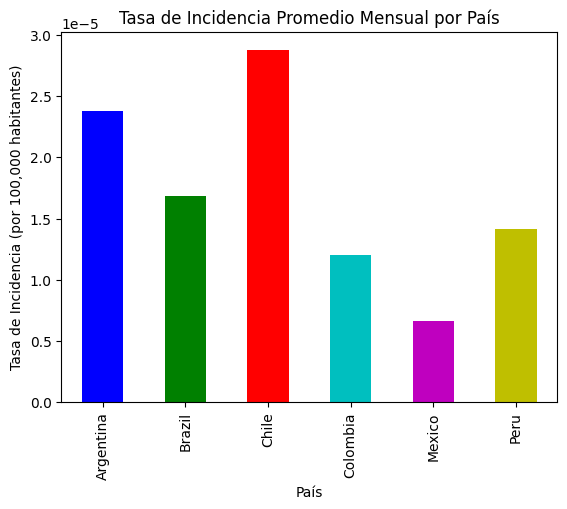

In [7]:
# Agrupar datos por país
df_agrupado = df_latinoAmerica_paises_fecha.groupby("country_name")

# Seleccionar las columnas que se van a utilizar en la función apply
df_agrupado = df_agrupado[["new_confirmed", "population"]]

# Calcular la tasa de incidencia para cada país
tasas_incidencia = df_agrupado.apply(lambda x: calcular_tasa_incidencia(x["new_confirmed"], x["population"]))

# Visualizar los resultados
colores = ['b', 'g', 'r', 'c', 'm', 'y']  # Lista de colores
tasas_incidencia.plot(kind="bar", color = colores)
plt.title("Tasa de Incidencia Promedio Mensual por País")
plt.xlabel("País")
plt.ylabel("Tasa de Incidencia (por 100,000 habitantes)")
plt.show()


*En resumen, esta función te permite calcular y visualizar la tasa de incidencia promedio mensual de COVID-19 por cada 100,000 habitantes para cada país en tu conjunto de datos. Esto puede ser útil para entender cómo la pandemia está afectando a diferentes países en términos relativos a su población.*

## Avance 2 ##

Análisis Exploratorio y Visualización de Datos

1. Importación de librerías
las que instalamos y las importamos en el principio del codigo junto con las que usamos anteriormente


 Medidas de tendencia central:

Media: df_filtrado_pais_fecha.mean()
Mediana: df_filtrado_pais_fecha.median()
Moda: df_filtrado_pais_fecha.mode()

 Medidas de dispersión:

Rango: df_filtrado_pais_fecha.max() - df_filtrado_pais_fecha.min()
Varianza: df_filtrado_pais_fecha.var()
Desviación estándar: df_filtrado_pais_fecha.std()

Correlaciones entre variables:

Matriz de correlación: df_filtrado_pais_fecha.corr()
Coeficientes de correlación de Pearson: np.corrcoef(df_filtrado_pais_fecha[var1], df_filtrado_pais_fecha[var2])

Algunos Ejemplos Pueden Ser

In [8]:
# Media de casos confirmados por país
media_casos_confirmados = df_latinoAmerica_paises_fecha.groupby('country_name')['cumulative_confirmed'].mean()

# Mediana de muertes confirmadas por país
mediana_muertes_confirmadas = df_latinoAmerica_paises_fecha.groupby('country_name')['cumulative_deceased'].median()

# Moda de grupos de edad
moda_grupos_edad = df_latinoAmerica_paises_fecha['population_age_30_39'].mode()

# Rango de temperatura media por país
rango_temperatura_media = df_latinoAmerica_paises_fecha.groupby('country_name')['average_temperature_celsius'].max() - df_latinoAmerica_paises_fecha.groupby('country_name')['average_temperature_celsius'].min()

# Varianza de dosis administradas por país
varianza_dosis_administradas = df_latinoAmerica_paises_fecha.groupby('country_name')['cumulative_vaccine_doses_administered'].var()

# Coeficiente de correlación entre casos confirmados y muertes confirmadas
corr_casos_muertes = np.corrcoef(df_latinoAmerica_paises_fecha['cumulative_confirmed'], df_latinoAmerica_paises_fecha['cumulative_deceased'])[0, 1]


In [9]:
#le damos un formato de impresion
print(f'La media de casos confirmados es: ', media_casos_confirmados)
print('----------------------------')
print(f'La mediana de muertes confirmadas es: ',mediana_muertes_confirmadas)
print('----------------------------')
print(f'La moda de edaddes en 30 y 39 años es: ',moda_grupos_edad)
print('----------------------------')
print(f'La el rango de temperatura media es: ',rango_temperatura_media)
print('----------------------------')
print(f'La varianza de las dosis de vacunas administradas es: ',varianza_dosis_administradas)
print('----------------------------')
print(f'La correlacion de los casos confirmados y las muertes confirmadas es: ',corr_casos_muertes)

La media de casos confirmados es:  country_name
Argentina    6.093209e+06
Brazil       2.246884e+07
Chile        2.226598e+06
Colombia     4.769269e+06
Mexico       2.447318e+06
Peru         2.580769e+06
Name: cumulative_confirmed, dtype: float64
----------------------------
La mediana de muertes confirmadas es:  country_name
Argentina    116740.0
Brazil       609447.0
Chile         37814.0
Colombia     139789.0
Mexico       208608.0
Peru         200771.0
Name: cumulative_deceased, dtype: float64
----------------------------
La moda de edaddes en 30 y 39 años es:  0     2945404.0
1     4379777.0
2     5777148.0
3     7810299.0
4    16763785.0
5    34476762.0
Name: population_age_30_39, dtype: float64
----------------------------
La el rango de temperatura media es:  country_name
Argentina    29.660494
Brazil       21.694445
Chile        22.072223
Colombia     13.022223
Mexico       16.713888
Peru         11.488889
Name: average_temperature_celsius, dtype: float64
----------------------

In [10]:
mis_paises = [ "Argentina", "Chile","Colombia", "Mexico", "Peru", "Brazil"]# creamos una lista con nustros paise en estudio para utilizarla mas adelante

*Crearemos una matriz de correlacion para ver si existe alguna relacion entre variables para tener en cuanta en un analisis posterior*

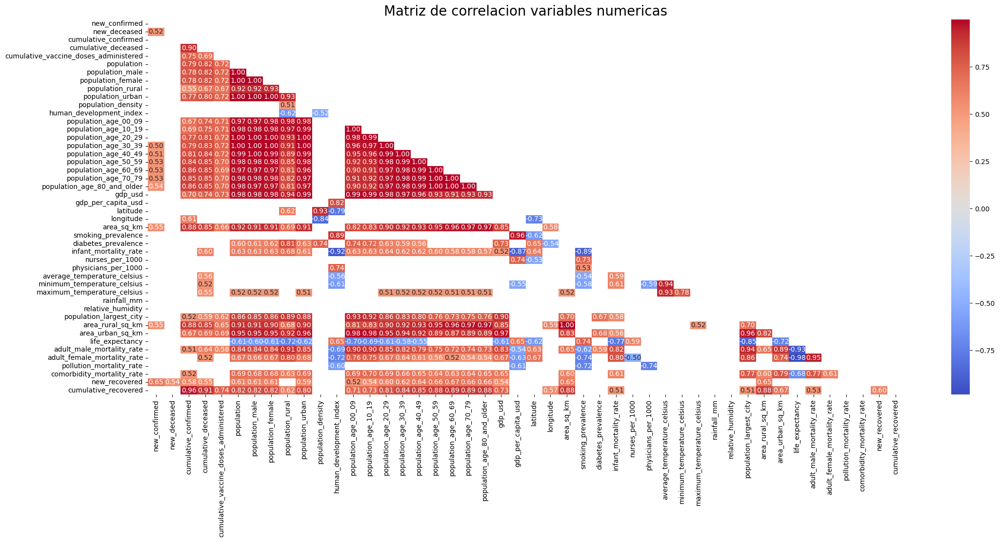

In [11]:
# Matriz de correlacion de las variantes numericas
columnas_numericas = df_latinoAmerica_paises_fecha.select_dtypes(include=['float64', 'int64']).columns
matriz_correlacion = df_latinoAmerica_paises_fecha[columnas_numericas].corr()
# creamos una mascara para el triangulo superior
mask = np.triu(np.ones_like(matriz_correlacion, dtype=bool))
# mostraremos valores superiores a 0.5 donde podemos encontrar valores fuertes tambien se pueden mostrar valores negativos
matriz_correlacion = matriz_correlacion[abs(matriz_correlacion) > abs(0.5)]

# grafico
plt.figure(figsize=(25, 10))
heatmap = sns.heatmap(matriz_correlacion, mask=mask, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matriz de correlacion variables numericas', fontsize=20)
plt.show()

El grafico anterior es un mapa de calor de la matriz de correlación para varias variables numéricas. Cada cuadro en la matriz representa el coeficiente de correlación entre dos variables, donde una variable corresponde a una fila y otra a una columna. La escala de colores indica que el rojo representa una correlación positiva, el azul una correlación negativa y el blanco ninguna correlación. La intensidad del color señala la fuerza de la correlación, con tonos más oscuros indicando relaciones más fuertes. Este tipo de visualización es útil para identificar rápidamente qué tan fuertemente están relacionadas diferentes variables entre sí

 **Visualización de Datos con Matplotlib y Seaborn:**

<Axes: xlabel='cumulative_confirmed', ylabel='Density'>

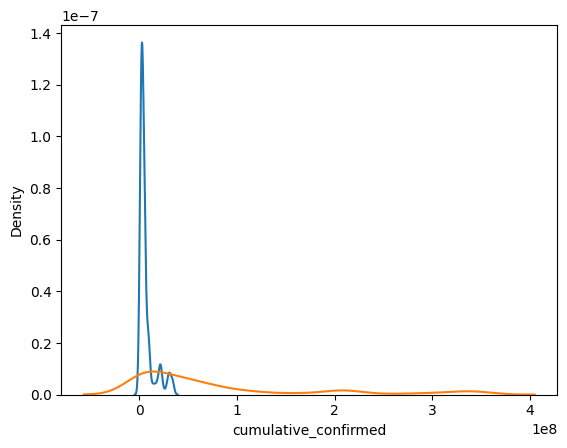

In [12]:
# Histogramas de densidad:

sns.kdeplot(df_latinoAmerica_paises_fecha['cumulative_confirmed'])
sns.kdeplot(df_latinoAmerica_paises_fecha['cumulative_vaccine_doses_administered'])


El gráfico muestra dos trazos de Estimación de Densidad Kernel (KDE) que representan la distribución de dos conjuntos de datos: 'cumulative_confirmed' y 'cumulative_vaccine_doses_administered'. El eje x, etiquetado como 'cumulative_confirmed', varía de 0 a 4e8, lo que sugiere que los datos están en el orden de los cientos de millones. El eje y, etiquetado como 'Density', varía aproximadamente de 0 a 1.4e-7.

El trazo de KDE para 'cumulative_confirmed' muestra un pico en el extremo inferior del eje x, indicando una alta densidad de puntos de datos cerca de cero casos confirmados, con una cola larga que se extiende hacia valores más altos. Esto podría sugerir que la mayoría de los puntos de datos para casos confirmados están agrupados alrededor de un número menor, con menos instancias a medida que aumenta el número de casos confirmados.

El trazo de KDE para 'cumulative_vaccine_doses_administered', que debería estar representado en este gráfico pero no se distingue claramente debido a la falta de leyenda o diferenciación de color, típicamente mostraría la distribución de las dosis de vacunas administradas a través de diferentes valores.

Este gráfico proporciona una visión visual de la distribución y densidad de los casos confirmados de COVID-19 frente a las dosis de vacunas administradas en los países de América Latina a lo largo del tiempo(nuestra lista de paises ). Nos ayuda a comprender qué tan extendidas han sido las infecciones por COVID-19 y cómo se están distribuyendo los esfuerzos de vacunación en relación con esas infecciones.



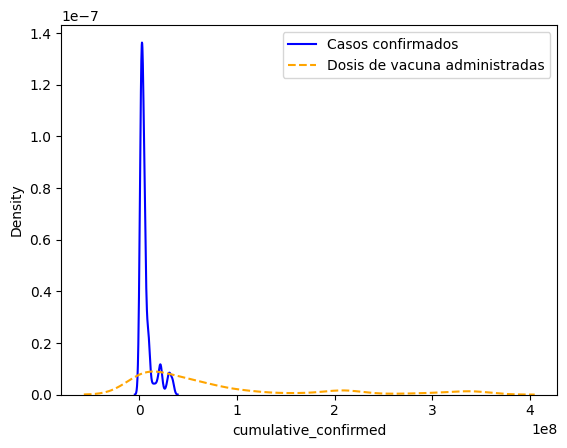

In [12]:
#mejorando el grafico anterior
# Crear la figura y los ejes
fig, ax = plt.subplots()

# Dibujar las distribuciones
sns.kdeplot(df_latinoAmerica_paises_fecha['cumulative_confirmed'], ax=ax, color='blue', label='Casos confirmados')
sns.kdeplot(df_latinoAmerica_paises_fecha['cumulative_vaccine_doses_administered'], ax=ax, color='orange', linestyle='--', label='Dosis de vacuna administradas')

# Añadir la leyenda
ax.legend()

# Mostrar el gráfico
plt.show()


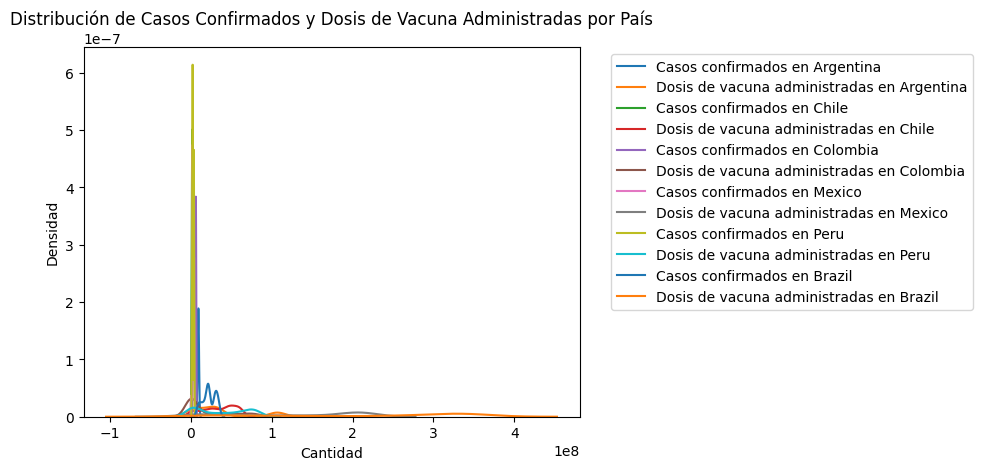

In [15]:
# Crear un gráfico de densidad para cada país
for pais in mis_paises:
    df_pais = df_latinoAmerica_paises_fecha[df_latinoAmerica_paises_fecha['country_name'] == pais]
    sns.kdeplot(df_pais['cumulative_confirmed'], label=f"Casos confirmados en {pais}")
    sns.kdeplot(df_pais['cumulative_vaccine_doses_administered'], label=f"Dosis de vacuna administradas en {pais}")

# Agregar títulos y etiquetas
plt.title('Distribución de Casos Confirmados y Dosis de Vacuna Administradas por País')
plt.xlabel('Cantidad')
plt.ylabel('Densidad')
# Mover la leyenda fuera del gráfico
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Mostrar el gráfico
plt.show()


El gráfico muestra la distribución de dos conjuntos de datos: ‘cumulative_confirmed’ (casos confirmados) y ‘cumulative_vaccine_doses_administered’ (dosis de vacuna administradas) para nuestra lista de paises. Cada país tiene dos líneas en el gráfico, una para cada conjunto de datos, y están codificadas por colores con etiquetas correspondientes en la leyenda.

Casos Confirmados: La línea que representa los casos confirmados muestra la densidad de los casos confirmados de COVID-19 en cada país.
Dosis de Vacuna Administradas: La línea que representa las dosis de vacuna administradas muestra la densidad de las dosis de vacunas que se han administrado en cada país.
Este gráfico es útil para comparar visualmente cómo se correlacionan los casos confirmados de COVID-19 y la administración de vacunas en diferentes países de América Latina. Puede ayudar a inferir patrones o disparidades entre estos dos conjuntos de datos dentro de esta región. Además, al mover la leyenda fuera del gráfico, se mejora la legibilidad y se evita que la leyenda obstruya cualquier parte del gráfico.

<Axes: title={'center': 'Nuevos Confirmados Por Pais'}, xlabel='country_name', ylabel='new_confirmed'>

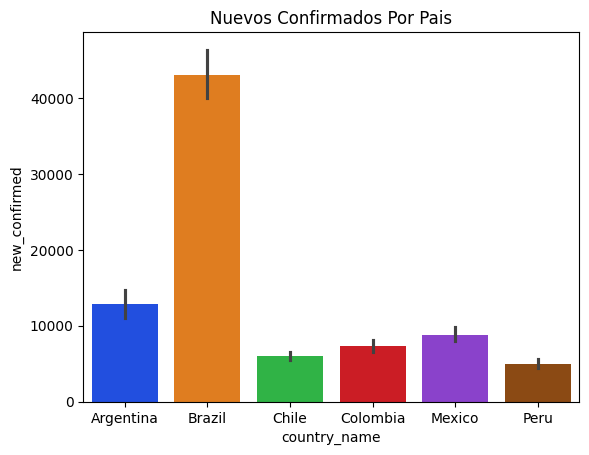

In [16]:
# Grafico de barras
plt.title('Nuevos Confirmados Por Pais')
sns.barplot(x='country_name', y='new_confirmed', hue='country_name', data=df_latinoAmerica_paises_fecha, palette='bright', legend=False)


El gráfico de barras titulado “Nuevos Confirmados Por País” muestra la cantidad de nuevos casos confirmados de COVID-19 por país en América Latina. Cada barra representa un país diferente y la altura de la barra indica el número de nuevos casos confirmados. Los países incluidos son Argentina, Brasil, Chile, Colombia, México y Perú.

Las observaciones clave son:

Distribución de Casos: Las barras permiten comparar rápidamente la distribución de nuevos casos entre los países.

Comparación Visual: La diferencia en la altura de las barras proporciona una comparación visual del impacto relativo del COVID-19 en estos países.

Ausencia de Leyenda: No hay leyenda en el gráfico, lo que significa que los colores de las barras se utilizan solo para diferenciar los países y no para representar diferentes categorías o grupos.

Datos Actuales: Este gráfico refleja los datos más recientes disponibles en el conjunto de datos df_latinoAmerica_paises_fecha.
Es importante tener en cuenta que la ausencia de una leyenda y el uso de colores pueden afectar la interpretación del gráfico si no se proporciona un contexto adecuado. Además, la precisión de los datos depende de la actualización y calidad del conjunto de datos utilizado.

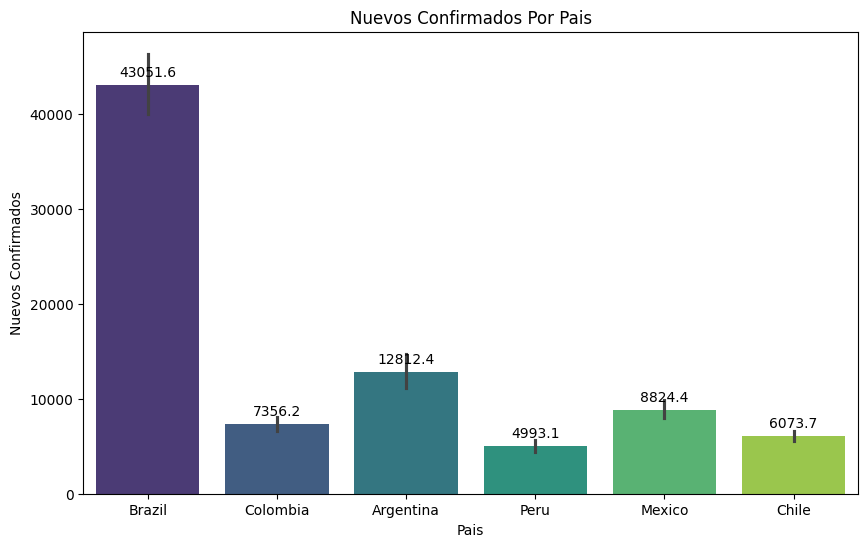

In [17]:
#mejoramos el grafico
# Ordenar los datos por 'new_confirmed'
df_sorted = df_latinoAmerica_paises_fecha.sort_values('new_confirmed')

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
barplot = sns.barplot(x='country_name', y='new_confirmed', hue='country_name', data=df_sorted, palette='viridis', legend=False)


# Añadir la leyenda y las etiquetas
plt.title('Nuevos Confirmados Por Pais')
plt.xlabel('Pais')
plt.ylabel('Nuevos Confirmados')

# Añadir etiquetas de datos a cada barra
for p in barplot.patches:
    barplot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')

# Mostrar el gráfico
plt.show()


Este ciclo for recorre todas las barras en el gráfico de barras y añade una anotación a cada una de ellas. 

- *for p in barplot.patches:* Aquí, barplot.patches es una lista de todas las barras en el gráfico de barras. El ciclo for recorre cada barra en esta lista.

- *barplot.annotate(format(p.get_height(), '.1f'), ...):* Esta línea añade una anotación a la barra actual. La anotación es el valor de la altura de la barra (que representa el valor de los datos) formateado como un número flotante con un decimal.

- *(p.get_x() + p.get_width() / 2., p.get_height()), ...:* Estas son las coordenadas donde se colocará la anotación. p.get_x() + p.get_width() / 2. es la coordenada x, que es el centro de la barra. p.get_height() es la coordenada y, que es la altura de la barra.

- *ha = 'center', va = 'center', ...:* Estos argumentos establecen la alineación horizontal (ha) y vertical (va) de la anotación. En este caso, la anotación está centrada tanto horizontal como verticalmente.

- *xytext = (0, 9), ...:* Este argumento especifica la posición del texto de la anotación en relación con el punto de anotación. En este caso, el texto está 9 puntos por encima del punto de anotación.

- *textcoords *= 'offset points': Este argumento especifica el sistema de coordenadas para xytext. En este caso, xytext se interpreta como una compensación en puntos desde el punto de anotación.

En resumen, este ciclo for añade una etiqueta a cada barra en el gráfico de barras que muestra el valor de los datos que representa la barra.

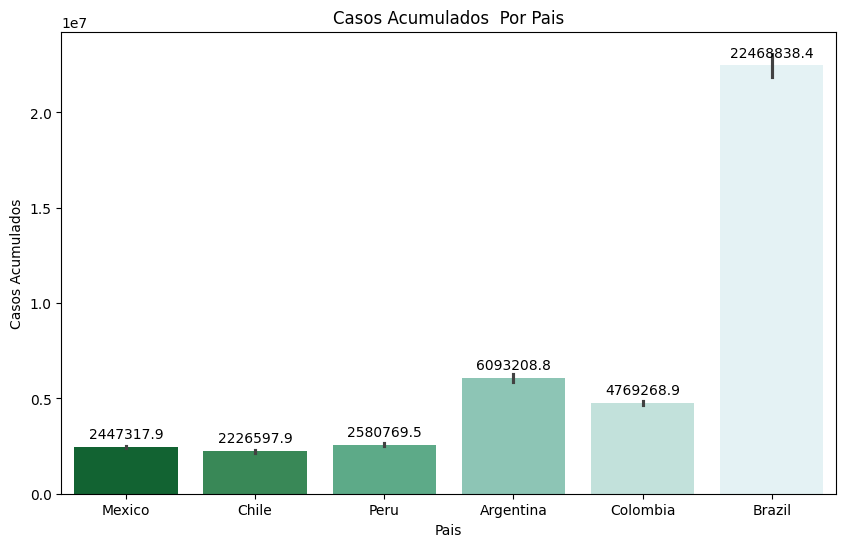

In [19]:
# Ordenar los datos 
df_sorted = df_latinoAmerica_paises_fecha.sort_values('cumulative_confirmed')

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
barplot = sns.barplot(x='country_name', y='cumulative_confirmed', hue='country_name', data=df_sorted, palette='BuGn_r', legend=False)


# Añadir la leyenda y las etiquetas
plt.title('Casos Acumulados  Por Pais')
plt.xlabel('Pais')
plt.ylabel('Casos Acumulados')

# Añadir etiquetas de datos a cada barra
for p in barplot.patches:
    barplot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')

# Mostrar el gráfico
plt.show()


*En este grafico utilizamos una paleta secuencial para datos numericos que progresan de bajos a altos*

**En un ciclo for vamos a recorrer todas las columnas relevantes para mostar informacion en un grafico de barras**

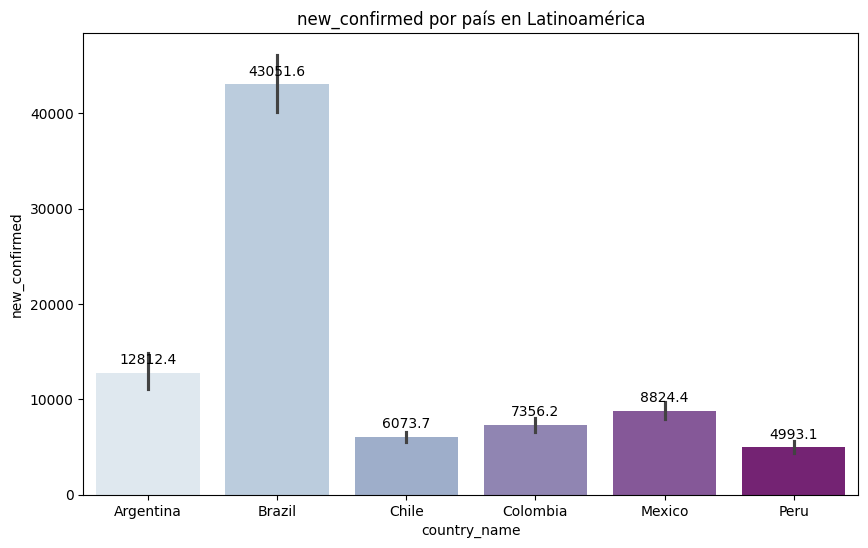

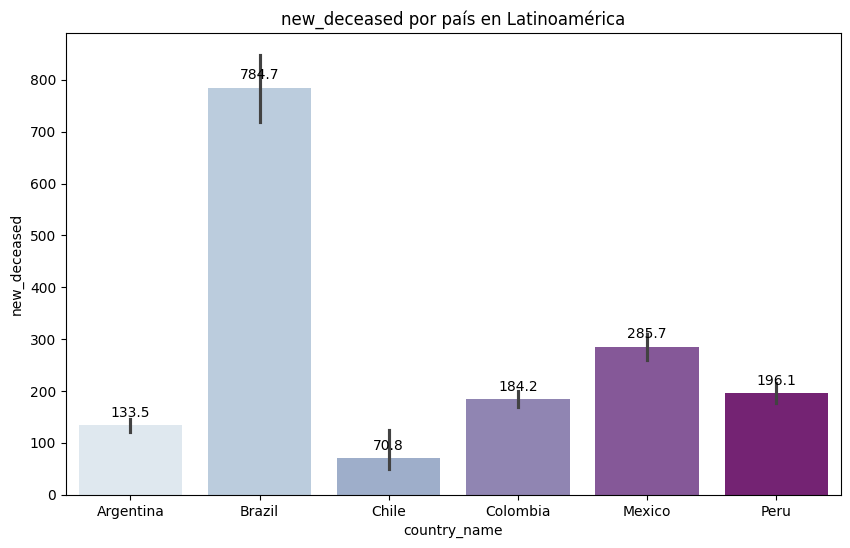

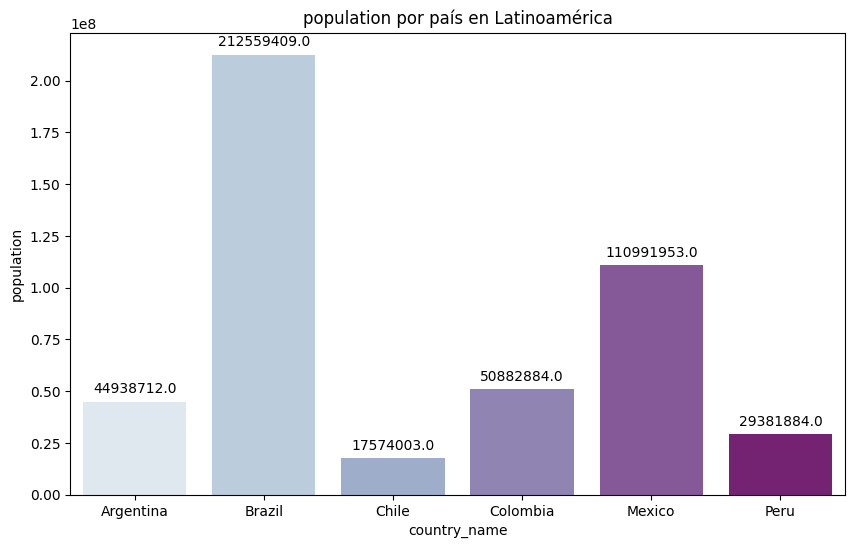

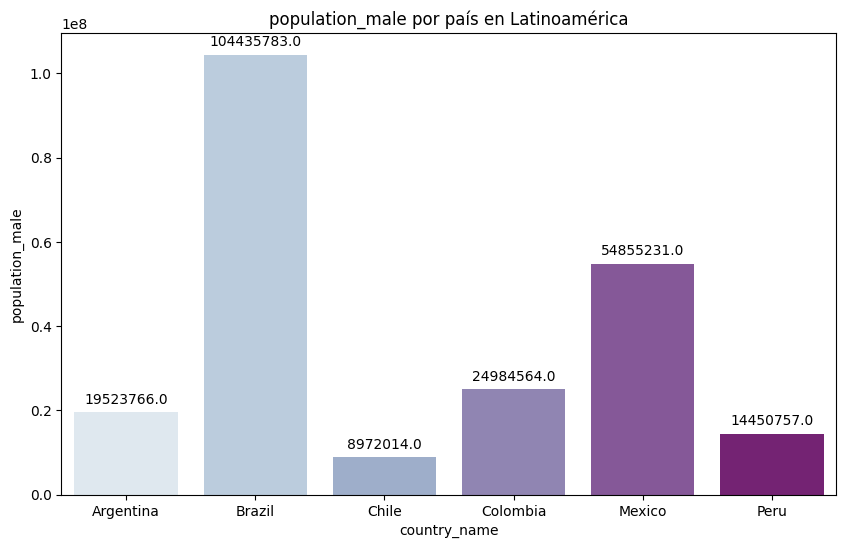

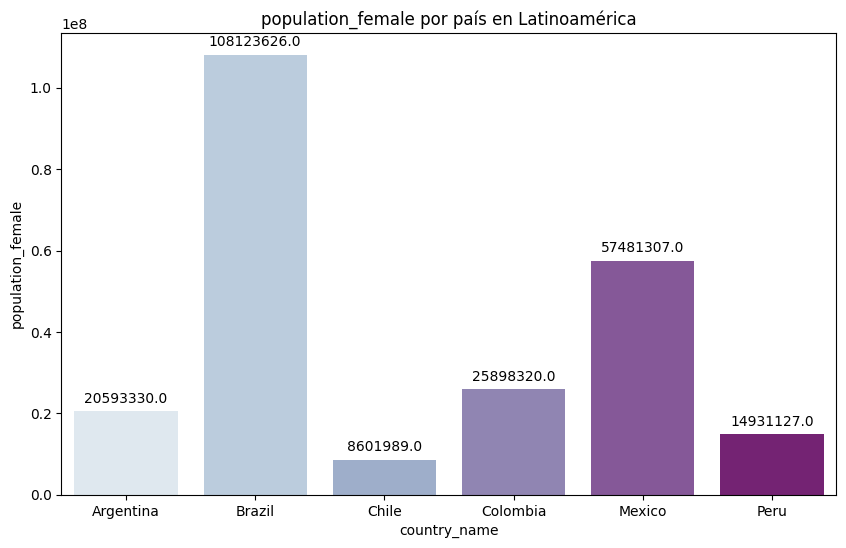

...

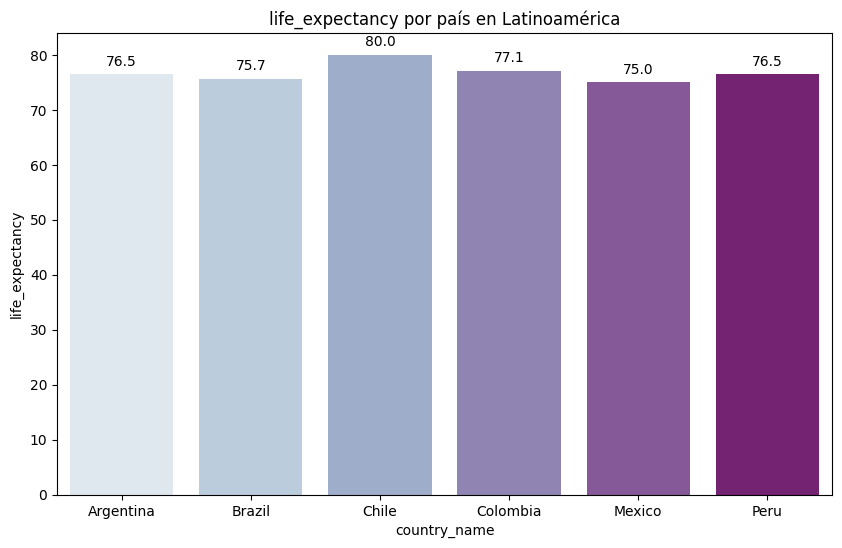

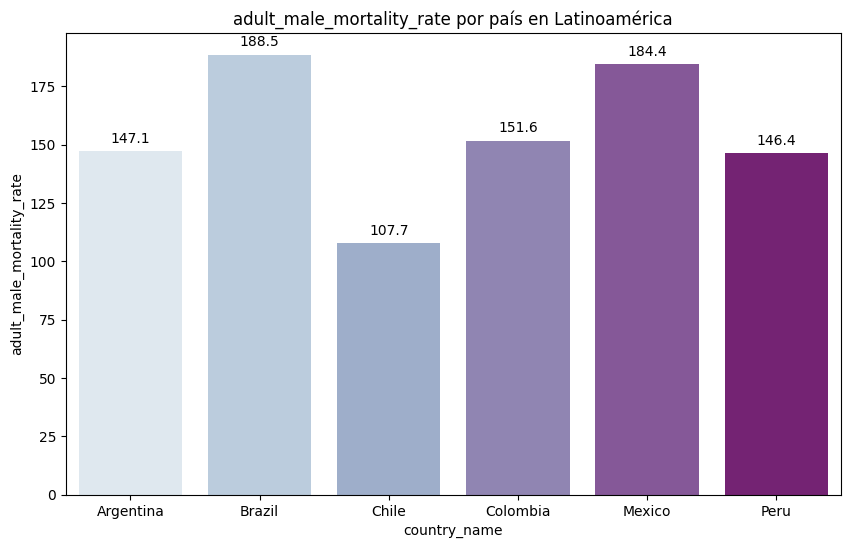

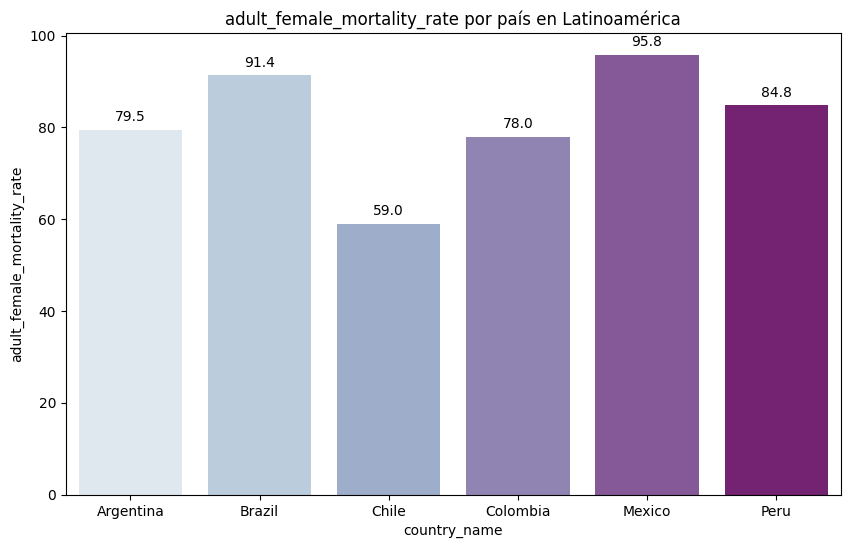

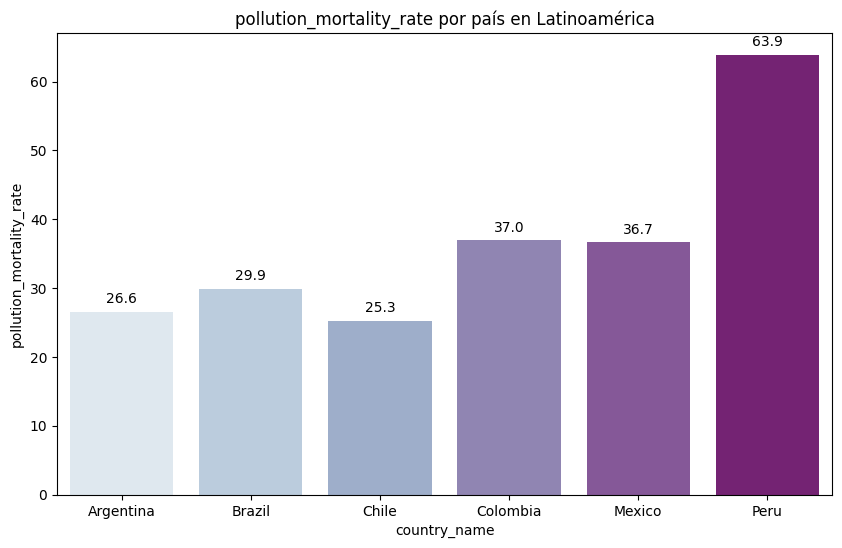

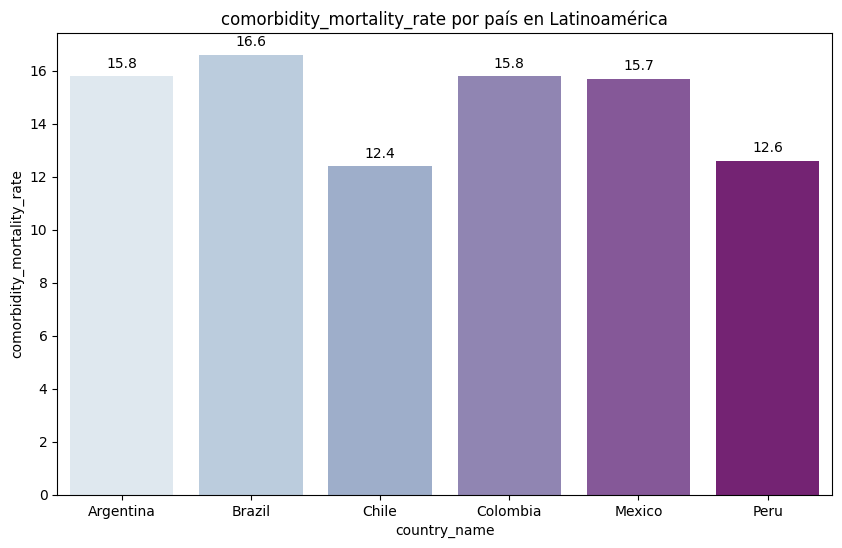

In [20]:
# Diagrama de barras para cada país en df_latinoAmerica_paises_fecha con 6 columnas
for i in df_latinoAmerica_paises_fecha.columns:
    if i not in ['location_key', 'date', 'country_code', 'country_name','latitude','longitude', 
                 'cumulative_confirmed','cumulative_deceased','cumulative_recovered',
                 'cumulative_vaccine_doses_administered','new_recovered']:
        fig, ax = plt.subplots(figsize=(10, 6))
        barplot = sns.barplot(x='country_name', y=i, data=df_latinoAmerica_paises_fecha, ax=ax,hue='country_name', palette='BuPu', legend=False)
        plt.title(f'{i} por país en Latinoamérica')
        
        # Añadir etiquetas de datos a cada barra
        for p in barplot.patches:
            barplot.annotate(format(p.get_height(), '.1f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points')
        
        plt.show()


El código genera un conjunto de gráficos de barras para cada columna en el DataFrame df_latinoAmerica_paises_fecha, excluyendo las columnas especificadas en la lista del condicional if. Para cada una de estas columnas, crea un gráfico de barras donde el eje x representa el nombre del país y el eje y representa los valores de la columna actual. Cada país tiene una barra en el gráfico, y las barras están codificadas por colores según el país al que pertenecen. El título de cada gráfico es el nombre de la columna actual seguido de “por país en Latinoamérica”.

Por lo tanto, estos gráficos te permitirían observar cómo varían los valores de cada columna (que podrían representar diferentes indicadores o métricas) entre los países de América Latina. 

*se repite el proceso del ciclo for pero ahora vamos a realizar histogramas para ver la distribucion de algunos datos*

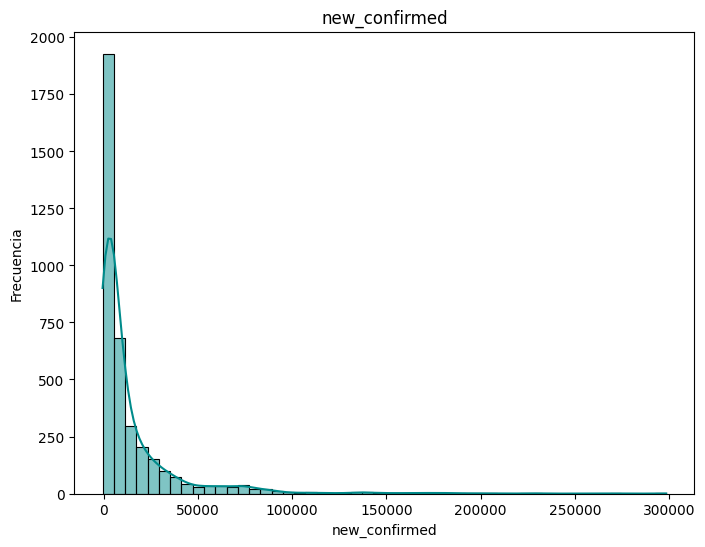

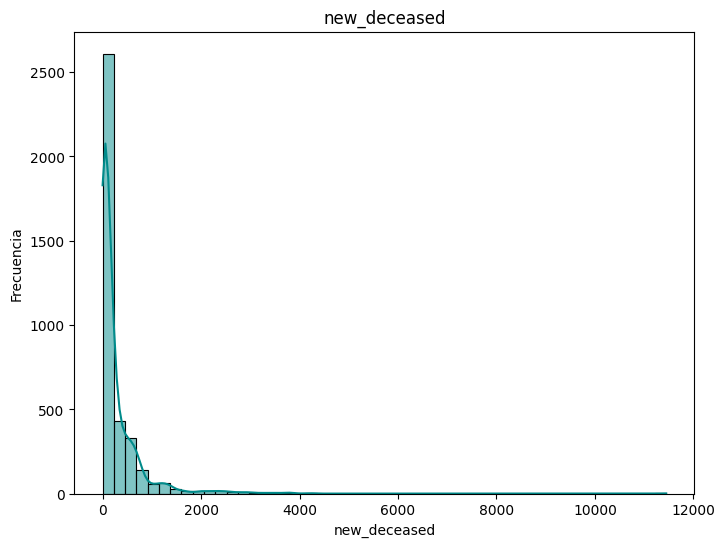

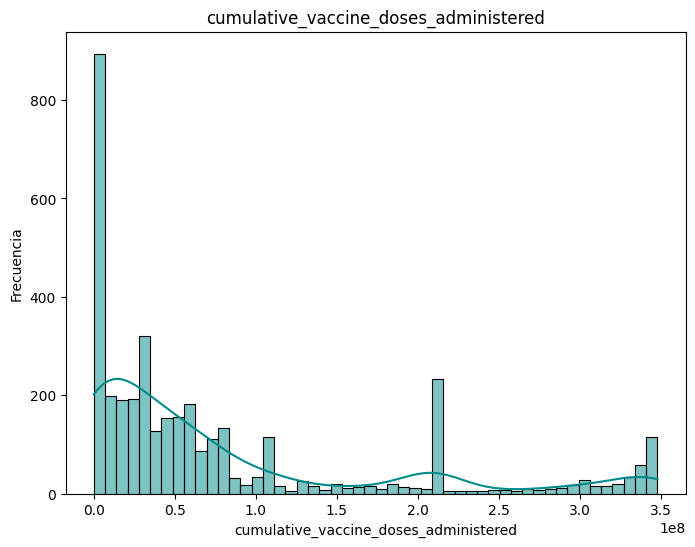

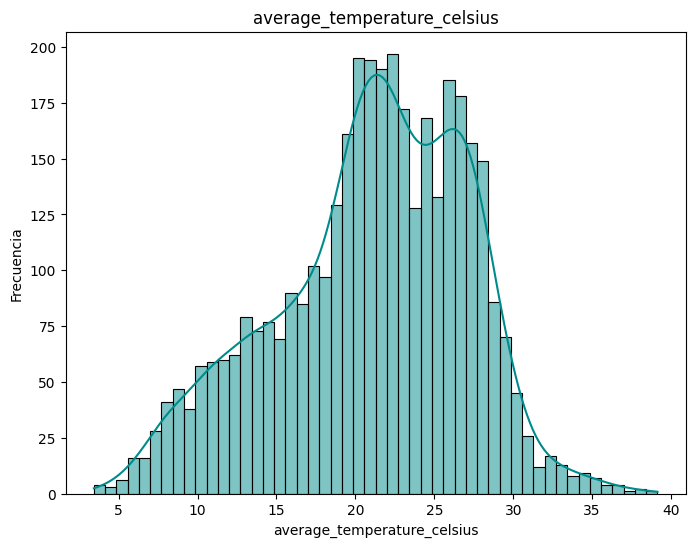

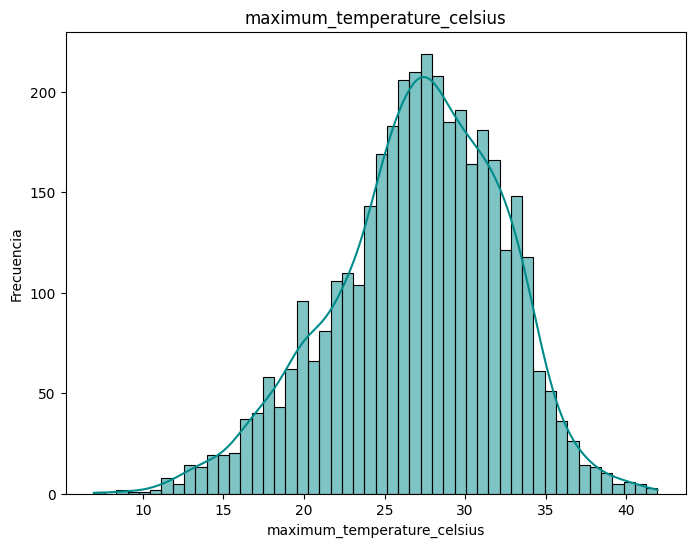

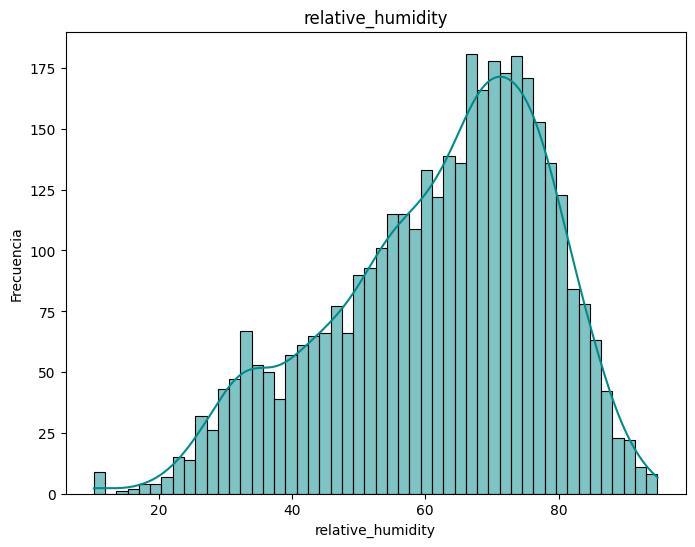

In [21]:
lista_columnas = ["new_confirmed","new_deceased", "cumulative_confirmed", "cumulative_deceased",
                  "cumulative_vaccine_doses_administered","average_temperature_celsius",
                  "maximum_temperature_celsius","relative_humidity"]

# Crear histogramas de las variables numéricas
for i in df_latinoAmerica_paises_fecha[lista_columnas]:
    if i not in ['location_key', 'date', 'country_code', 'country_name','latitude','longitude', 
                 'cumulative_confirmed','cumulative_deceased','cumulative_recovered','new_recovered']:
        fig, ax = plt.subplots(figsize=(8, 6))
        sns.histplot(df_latinoAmerica_paises_fecha[i], kde=True, color='darkcyan', bins=50)
        plt.title(i)
        plt.xlabel(i)
        plt.ylabel('Frecuencia')
        plt.show()


En el codigo anterior generamos una serie de histogramas para diferentes variables numéricas en el DataFrame **df_latinoAmerica_paises_fecha**. Cada histograma muestra la distribución de una variable diferente.

Un histograma es un gráfico que muestra la distribución de un conjunto de datos numéricos mediante barras. La altura de cada barra representa la frecuencia de cada intervalo de valores. En este caso, las variables representadas son "new_confirmed", "new_deceased", "cumulative_confirmed", "cumulative_deceased", "cumulative_vaccine_doses_administered", "average_temperature_celsius", "maximum_temperature_celsius" y "relative_humidity".

Para cada histograma:
- El eje x representa los valores de la variable.
- El eje y representa la frecuencia de esos valores en el conjunto de datos.
- La línea suave que atraviesa el histograma es una estimación de la densidad del kernel, que proporciona una visualización suave de la distribución de los datos.
- El color de las barras es 'darkcyan' y el número de bins es 50, lo que significa que los datos se dividen en 50 intervalos para el histograma.

Al observar estos histogramas, podemos obtener una comprensión visual de la distribución de cada variable en el conjunto de datos.



El número de bins en un histograma puede tener un gran impacto en la interpretación de los datos.

- **Menos bins**: Si utilizas menos bins, cada bin será más ancho, lo que significa que cada bin cubrirá un rango más amplio de valores. Esto puede hacer que el histograma sea menos detallado y puede oscurecer características importantes de los datos. Sin embargo, también puede ayudar a suavizar el ruido y hacer que las tendencias generales sean más claras.

- **Más bins**: Si utilizas más bins, cada bin será más estrecho, lo que significa que cada bin cubrirá un rango más pequeño de valores. Esto puede hacer que el histograma sea más detallado y puede revelar características importantes de los datos. Sin embargo, también puede hacer que el histograma sea más ruidoso y puede hacer que las tendencias generales sean menos claras.

En resumen, el número de bins que elijas puede afectar el equilibrio entre el detalle y el ruido en tu histograma. Por lo tanto, es importante elegir un número de bins que proporcione una representación precisa de tus datos.



**Mapas de Calor**

Text(0.5, 1.0, 'Correlación entre Casos Confirmados, Fallecidos y Dosis de Vacunas Administradas')

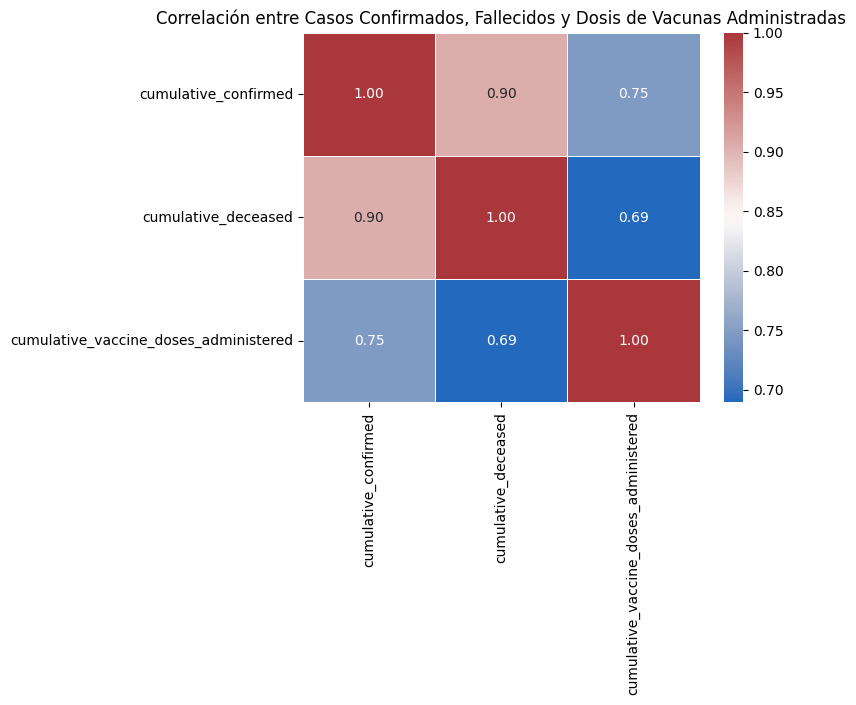

In [22]:
# filtramos por columnas para facilitar la lectura
columnas_seleccionadas = ['cumulative_confirmed', 'cumulative_deceased', 'cumulative_vaccine_doses_administered']  # Reemplaza esto con las columnas que te interesan
sns.heatmap(df_latinoAmerica_paises_fecha[columnas_seleccionadas].corr(), annot=True, fmt=".2f", cmap='vlag', linewidths=.5)
plt.title('Correlación entre Casos Confirmados, Fallecidos y Dosis de Vacunas Administradas')

El anterior es un mapa de calor de la correlación entre tres variables relacionadas con los datos de df_latiniamerica_paises_fecha con las columnas **cumulative_confirmed** (casos confirmados acumulados), **cumulative_deceased** (fallecidos acumulados) y **cumulative_vaccine_doses_administered** (dosis de vacunas administradas acumuladas).

**Observaciones Clave:**

*Correlación Positiva Fuerte*: Existe una fuerte correlación positiva (0.90) entre **cumulative_confirmed** y **cumulative_deceased**, lo que indica que a medida que aumentan los casos confirmados, también lo hacen los fallecimientos.

*Correlación Moderada:* Hay una correlación moderada entre **cumulative_confirmed** y **cumulative_vaccine_doses_administered** (0.75), y entre **cumulative_deceased** y **cumulative_vaccine_doses_administered** (0.69).

**Graficos de Dispersion**

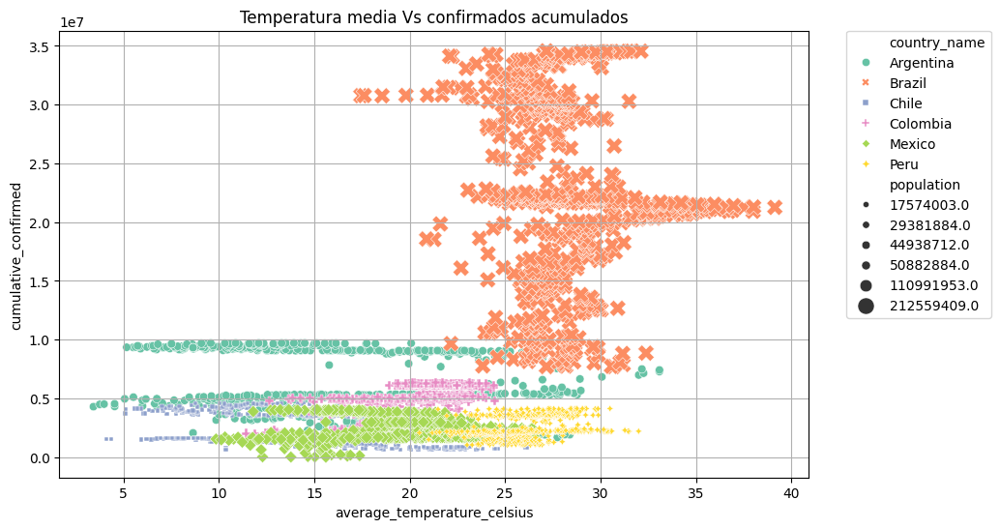

In [23]:
fig, ax = plt.subplots(figsize=(10, 6))
plt.title('Temperatura media Vs confirmados acumulados')
sns.scatterplot(x='average_temperature_celsius', y='cumulative_confirmed', 
                data=df_latinoAmerica_paises_fecha, hue='country_name', 
                size='population', sizes=(20, 150), style='country_name', 
                palette='Set2')
plt.grid(True)
plt.grid(True)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)  # Mueve la leyenda al lado derecho
plt.show()


**Interactivo**

In [24]:
# Crear un gráfico de dispersión interactivo con plotly
fig = px.scatter(df_latinoAmerica_paises_fecha, 
                 x='average_temperature_celsius', 
                 y='cumulative_confirmed', 
                 color='country_name', 
                 size='population', 
                 title='Temperatura media Vs confirmados acumulados')

# Mostrar el gráfico
fig.show()

El gráfico de dispersión anterior muestra la relación entre la ‘Temperatura media’ y los ‘Confirmados acumulados’ de COVID-19 en diferentes países de Latinoamérica.

**Observaciones:**

*Agrupación de Datos:* Hay una agrupación de puntos de datos a temperaturas medias más bajas con diferentes números de casos confirmados acumulados.

*Dispersión de Datos:* A medida que aumenta la temperatura media, parece haber una mayor dispersión en el número de casos confirmados acumulados.

Este código agrega una cuadrícula al gráfico, varía el tamaño de los puntos de datos según la población y utiliza una paleta de colores diferente para una mejor distinción visual.

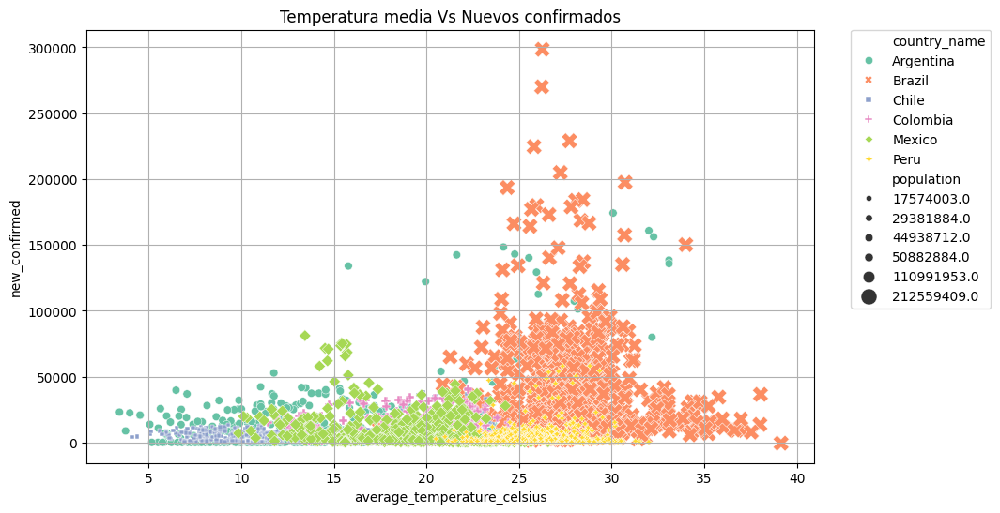

In [24]:
fig, ax = plt.subplots(figsize=(10, 6))
plt.title('Temperatura media Vs Nuevos confirmados')
sns.scatterplot(x='average_temperature_celsius', y='new_confirmed', 
                data=df_latinoAmerica_paises_fecha, hue='country_name', 
                size='population', sizes=(20, 150), style='country_name', 
                palette='Set2')
plt.grid(True)
plt.grid(True)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)  # Mueve la leyenda al lado derecho
plt.show()


El gráfico de dispersión 'Temperatura media Vs Nuevos confirmados' muestra la relación entre la temperatura media en grados Celsius y el número de nuevos casos confirmados de COVID-19 en diferentes países de Latinoamérica.

- **Representación de Países**: Cada punto representa un país, con el color y el tamaño del punto correspondientes al nombre del país y al tamaño de su población, respectivamente.

- **Eje X**: La temperatura media varía aproximadamente de 5 a 40 grados Celsius.

- **Eje Y**: El número de nuevos casos confirmados varía desde 0 hasta aproximadamente 300,000.

- **Leyenda**: Se ha movido al lado derecho fuera del área principal del gráfico para evitar la superposición con los datos.

Este gráfico nos ayuda a identificar si existe alguna tendencia visible entre la temperatura media de un país y el número de nuevos casos confirmados, aunque cualquier correlación observada requeriría un análisis más profundo para confirmar su significado.



In [25]:
#Interactivo
fig = px.scatter(df_latinoAmerica_paises_fecha, x='average_temperature_celsius', y='new_confirmed', 
                 color='country_name', size='population', 
                 hover_data=['population'])
fig.update_layout(title='Temperatura media Vs Nuevos confirmados', yaxis_type='log')
fig.show()


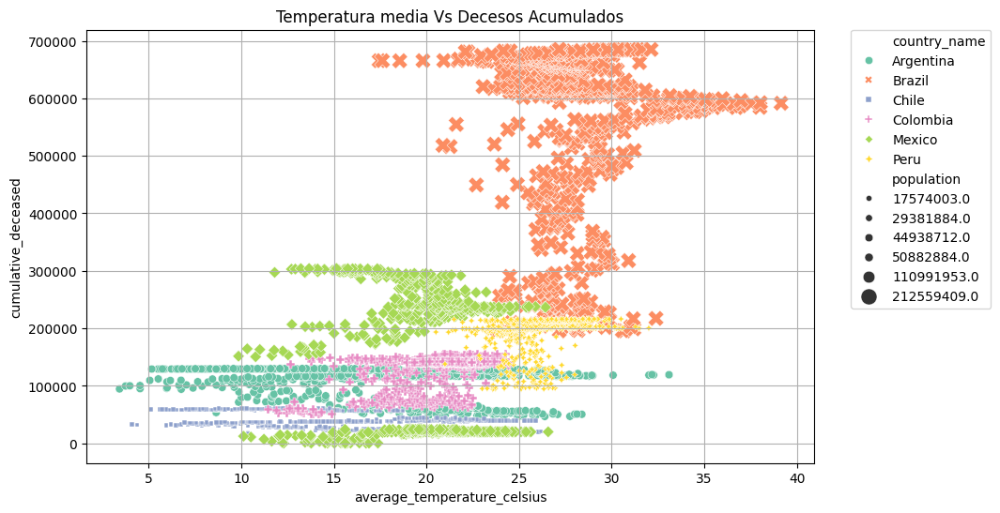

In [26]:
fig, ax = plt.subplots(figsize=(10, 6))
plt.title('Temperatura media Vs Decesos Acumulados')
sns.scatterplot(x='average_temperature_celsius', y='cumulative_deceased', 
                data=df_latinoAmerica_paises_fecha, hue='country_name', 
                size='population', sizes=(20, 150), style='country_name', 
                palette='Set2')
plt.grid(True)
plt.grid(True)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)  # Mueve la leyenda al lado derecho
plt.show()


El gráfico de dispersión ‘Temperatura media Vs Decesos Acumulados’ muestra la relación entre la temperatura media en grados Celsius y el número acumulado de decesos en diferentes países de Latinoamérica.

Eje X: Representa la temperatura media, variando aproximadamente de 5 a 40 grados Celsius.

Eje Y: Muestra los decesos acumulados, con un rango que parece ir de 0 a alrededor de 600,000.

Tamaño de Puntos: Correlaciona con el tamaño de la población de cada país, con tamaños que varían entre 20 y 150.

Colores y Estilos: Cada país está representado por un color y estilo de punto único, lo que facilita la distinción entre ellos.

Este gráfico nos ayuda a identificar si existe alguna tendencia o patrón entre la temperatura media de un país y el número acumulado de decesos, aunque cualquier correlación observada requeriría un análisis más profundo para confirmar su significado. 

La leyenda se ha movido al lado derecho fuera del área principal del gráfico para evitar la superposición con los datos.

In [27]:
#interactivo
fig = px.scatter(df_latinoAmerica_paises_fecha, x='average_temperature_celsius', y='cumulative_deceased', 
                 color='country_name', size='population', 
                 hover_data=['population'])
fig.update_layout(title='Temperatura media Vs Decesos Acumulados', yaxis_type='log')
fig.show()


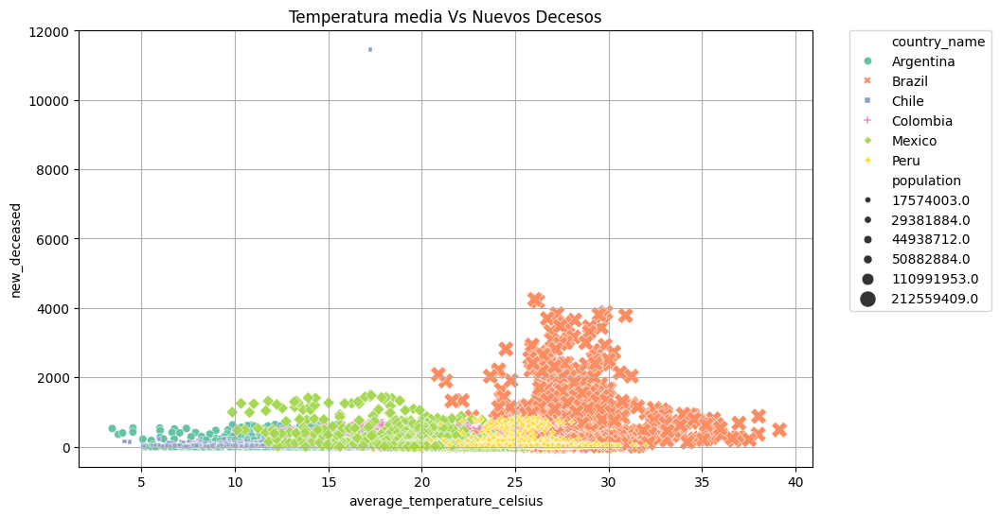

In [28]:
fig, ax = plt.subplots(figsize=(10, 6))
plt.title('Temperatura media Vs Nuevos Decesos')
sns.scatterplot(x='average_temperature_celsius', y='new_deceased', 
                data=df_latinoAmerica_paises_fecha, hue='country_name', 
                size='population', sizes=(20, 150), style='country_name', 
                palette='Set2')
plt.grid(True)
plt.grid(True)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)  # Mueve la leyenda al lado derecho
plt.show()


In [29]:

fig = px.scatter(df_latinoAmerica_paises_fecha, x='average_temperature_celsius', y='new_deceased', 
                 color='country_name', size='population', 
                 hover_data=['population'])
fig.update_layout(title='Temperatura media Vs Nuevos Decesos', yaxis_type='log')
fig.show()


El gráfico de dispersión ‘Temperatura media Vs Nuevos Decesos’ muestra la relación entre la temperatura media en grados Celsius y el número de nuevos decesos en diferentes países de Latinoamérica.

Eje X: Representa la temperatura media, variando aproximadamente de 5 a 40 grados Celsius.

Eje Y: Muestra los nuevos decesos, con un rango que parece ir de 0 a alrededor de 12,000.

Tamaño de Puntos: Correlaciona con el tamaño de la población de cada país, con tamaños que varían entre 20 y 150.

Colores y Estilos: Cada país está representado por un color y estilo de punto único, lo que facilita la distinción entre ellos.

Este gráfico nos ayuda a identificar si existe alguna tendencia o patrón entre la temperatura media de un país y el número de nuevos decesos, aunque cualquier correlación observada requeriría un análisis más profundo para confirmar su significado. 

La leyenda se ha movido al lado derecho fuera del área principal del gráfico para evitar la superposición con los datos

Podemos observar que en algunos paises no influye la temperatura en la cantidad de muertos, sin enbargo en otros paises si se puede observar una relacion entre la cantidad de muertos y la temperatura.

tambien podemos observar que para el pais de chile tenemos un dato atipico y es que tenemos un datos de nuevos decesos de 11.447k en '2022-03-21' con una temperatura de 17.24 °C un dato demaciado alto para el resto de registros.

**Dosis Administradas**

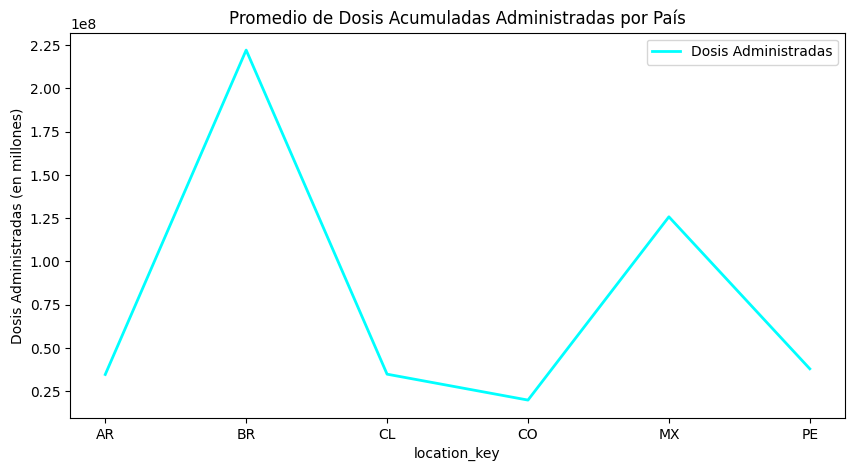

In [30]:
#creamos el grafico
plt.figure(figsize=(10, 5))
plt.title('Promedio de Dosis Acumuladas Administradas por País')
plt.xlabel('País')
plt.ylabel('Dosis Administradas (en millones)')
plt.grid(True)

media_dosis = round(df_latinoAmerica_paises_fecha.groupby('location_key')['cumulative_vaccine_doses_administered'].mean(), 2)
media_dosis.plot(kind='line', color='cyan', linestyle='-', linewidth=2)

# Añadir leyenda si es necesario
plt.legend(['Dosis Administradas'])

# Mostrar el gráfico 
plt.show()


El gráfico  “Promedio de dosis acumuladas administradas” muestra una comparación del promedio de dosis acumuladas de vacunas o medicamentos administrados en seis diferentes ubicaciones, identificadas como AR, BR, CL, CO, MX y PE. 

El eje vertical representa el número de dosis en notación científica (1e8), lo que indica que la escala está en cientos de millones. 

El eje horizontal está etiquetado como “location_key”. 

La línea tiene un pico pronunciado en la segunda ubicación (BR) y otro pico más pequeño en la quinta ubicación (MX). 

Este gráfico proporciona una representación visual de la distribución de vacunas o administración de medicamentos en estas ubicaciones, mostrando una variación significativa entre ellas.

In [31]:
print(df_latinoAmerica_paises_fecha.columns)# hicimos una breve verififacion de las columnas que tenemos hasta el momento

Index(['location_key', 'date', 'country_code', 'country_name', 'new_confirmed',
       'new_deceased', 'cumulative_confirmed', 'cumulative_deceased',
       'cumulative_vaccine_doses_administered', 'population',
       'population_male', 'population_female', 'population_rural',
       'population_urban', 'population_density', 'human_development_index',
       'population_age_00_09', 'population_age_10_19', 'population_age_20_29',
       'population_age_30_39', 'population_age_40_49', 'population_age_50_59',
       'population_age_60_69', 'population_age_70_79',
       'population_age_80_and_older', 'gdp_usd', 'gdp_per_capita_usd',
       'latitude', 'longitude', 'area_sq_km', 'smoking_prevalence',
       'diabetes_prevalence', 'infant_mortality_rate', 'nurses_per_1000',
       'physicians_per_1000', 'average_temperature_celsius',
       'minimum_temperature_celsius', 'maximum_temperature_celsius',
       'rainfall_mm', 'relative_humidity', 'population_largest_city',
       'area_rural_

C:\Users\miass\AppData\Local\Temp\ipykernel_14820\4080856107.py:15: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



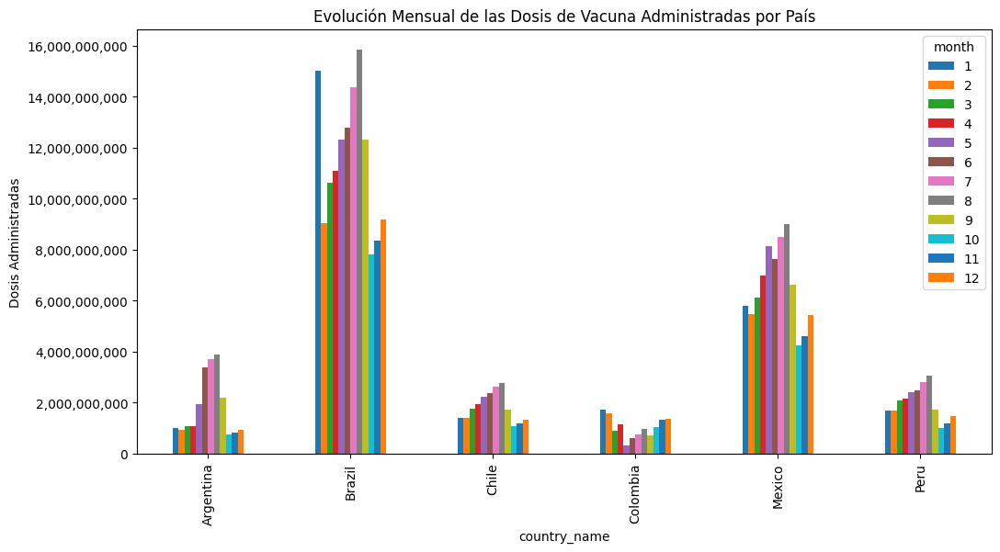

In [36]:
#Evolución_por_mes:
# Extraemos el mes de la columna de fecha
df_latinoAmerica_paises_fecha['month'] = df_latinoAmerica_paises_fecha['date'].dt.month

# Agrupamos por país y mes, y luego calculamos la suma de las dosis de vacuna administradas
df_grouped = df_latinoAmerica_paises_fecha.groupby(['country_name', 'month'])['cumulative_vaccine_doses_administered'].sum()


# Configuración del gráfico
plt.figure(figsize=(12, 6))
plt.title('Evolución Mensual de las Dosis de Vacuna Administradas por País')
plt.xlabel('País')
plt.ylabel('Dosis Administradas')
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.grid(axis='y')

# Formato del eje Y para mostrar números enteros
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

# Generación del gráfico de barras
df_grouped.unstack().plot(kind='bar', ax=plt.gca())


# Mostrar el gráfico mejorado
plt.show()


# Mostrar el gráfico mejorado
plt.show()


El anterior es un gráfico de barras que muestra la Evolución Mensual de las Dosis de Vacuna Administradas por País.

**Descripción:**
Eje X: Representa los códigos de países en Latinoamérica como AR, BR, CL, CO, MX, PE.

Eje Y: Muestra la suma de las dosis de vacunas administradas.

Barras: Cada país tiene un conjunto de barras de diferentes colores que representan cada mes del año.

**Casos nuevos entre paises**

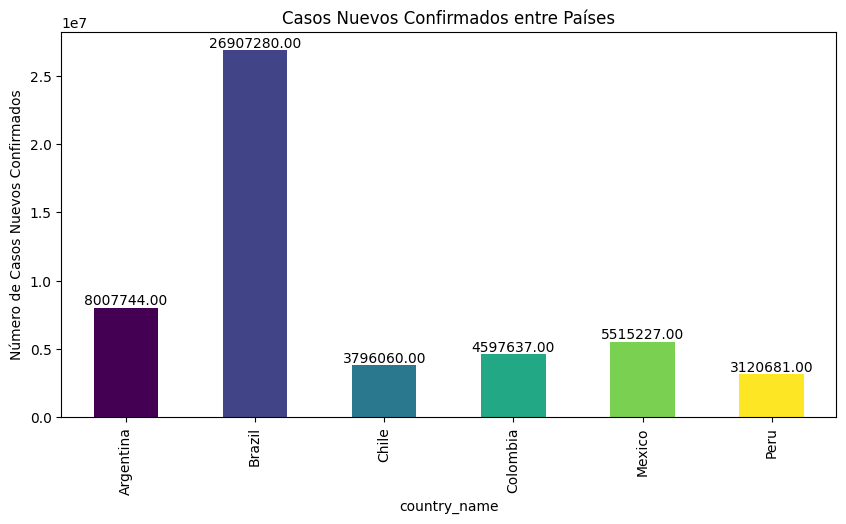

In [45]:
# Configuración del gráfico
plt.figure(figsize=(10, 5))
plt.title('Casos Nuevos Confirmados entre Países')
plt.xlabel('País')
plt.ylabel('Número de Casos Nuevos Confirmados')
plt.xticks(rotation=45)

# Crear el gráfico de barras
colors = plt.cm.viridis(np.linspace(0, 1, len(df_latinoAmerica_paises_fecha['country_name'].unique())))
df_grouped = df_latinoAmerica_paises_fecha.groupby('country_name')['new_confirmed'].sum()
bars = df_grouped.plot(kind='bar', color=colors)

# Añadir etiquetas de datos
for bar in bars.patches:
    bars.annotate(format(bar.get_height(), '.2f'), 
                  (bar.get_x() + bar.get_width() / 2, 
                   bar.get_height()), ha='center', va='bottom')

# Mostrar el gráfico mejorado
plt.show()


El gráfico muestra una comparación de los casos nuevos confirmados de COVID-19 entre varios países de Latinoamérica. 

*Las observaciones clave son:*


**Brasil:** Tiene el número más alto de casos nuevos confirmados, con aproximadamente 2.7 millones.

**Chile y Perú:** Tienen una cantidad similar de casos.

**Colombia y México:** Están en un rango intermedio.

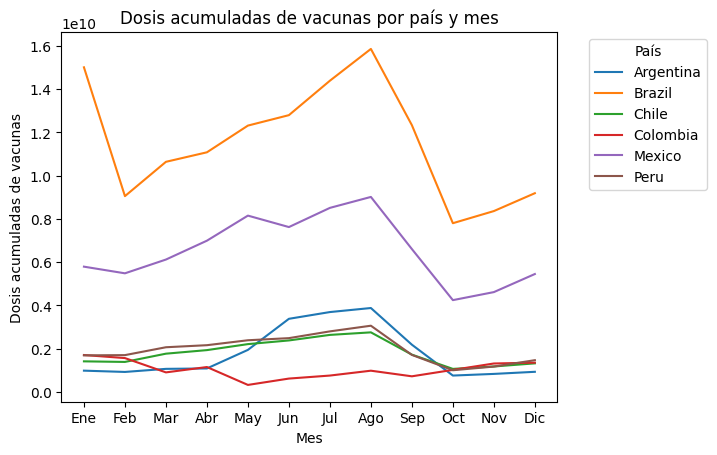

In [46]:

# Extraemos el mes de la columna de fecha
df_latinoAmerica_paises_fecha['month'] = df_latinoAmerica_paises_fecha['date'].dt.month

# Agrupamos por país y mes, y luego calculamos la suma de las dosis de vacuna administradas
df_grouped = df_latinoAmerica_paises_fecha.groupby(['country_name', 'month'])['cumulative_vaccine_doses_administered'].sum()

# Desapilamos el DataFrame agrupado y creamos el gráfico
df_grouped.unstack(level=0).plot(kind='line')

# Agregamos títulos y etiquetas
plt.title('Dosis acumuladas de vacunas por país y mes')
plt.xlabel('Mes')
plt.ylabel('Dosis acumuladas de vacunas')
plt.xticks(np.arange(1, 13), ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic'])
plt.legend(title='País', bbox_to_anchor=(1.05, 1), loc='upper left')

# Mostrar el gráfico
plt.show()


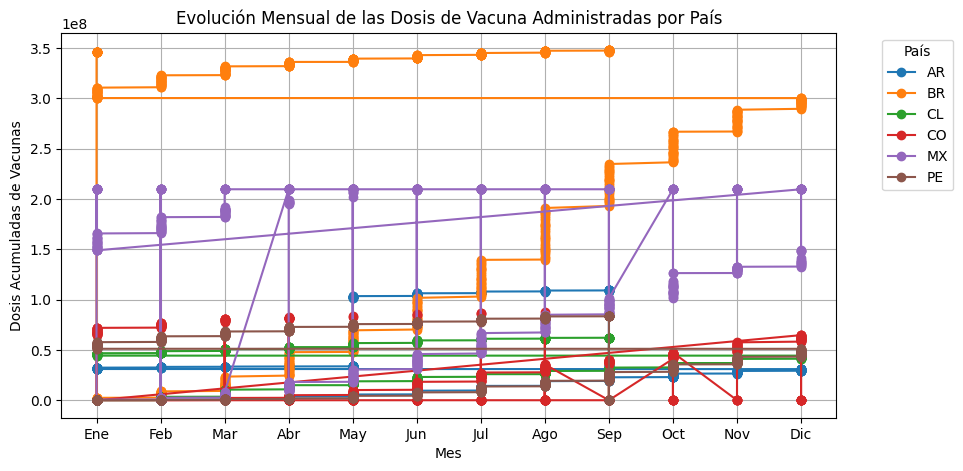

In [47]:
# Configuración del gráfico
plt.figure(figsize=(10, 5))
plt.title('Evolución Mensual de las Dosis de Vacuna Administradas por País')
plt.xlabel('Mes')
plt.ylabel('Dosis Acumuladas de Vacunas')
plt.xticks(np.arange(1, 13), ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic'])
plt.grid(True)

# Crear el gráfico de líneas con marcadores para cada punto de datos
for country in df_latinoAmerica_paises_fecha['location_key'].unique():
    country_data = df_latinoAmerica_paises_fecha[df_latinoAmerica_paises_fecha['location_key'] == country]
    plt.plot(country_data['month'], country_data['cumulative_vaccine_doses_administered'], marker='o', label=country)

# Añadir la leyenda
plt.legend(title='País', bbox_to_anchor=(1.05, 1), loc='upper left')

# Mostrar el gráfico mejorado
plt.show()


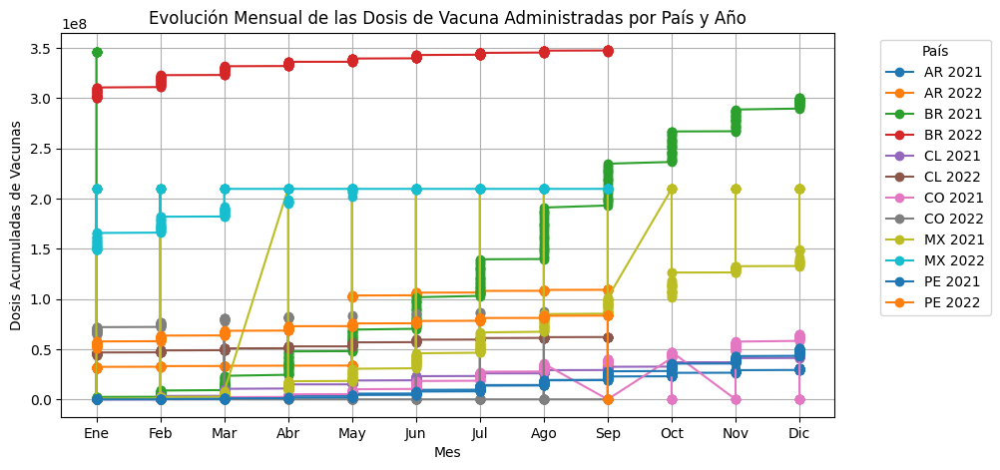

In [48]:
# Extraer el año de la columna de fecha
df_latinoAmerica_paises_fecha['year'] = df_latinoAmerica_paises_fecha['date'].dt.year

# Agrupar por país, año y mes, luego calcular la suma de las dosis de vacuna administradas
df_grouped = df_latinoAmerica_paises_fecha.groupby(['location_key', 'year', 'month'])['cumulative_vaccine_doses_administered'].sum()

# Configuración del gráfico
plt.figure(figsize=(10, 5))
plt.title('Evolución Mensual de las Dosis de Vacuna Administradas por País y Año')
plt.xlabel('Mes')
plt.ylabel('Dosis Acumuladas de Vacunas')
plt.xticks(np.arange(1, 13), ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic'])
plt.grid(True)

# Crear el gráfico de líneas con marcadores para cada punto de datos
for country in df_latinoAmerica_paises_fecha['location_key'].unique():
    for year in df_latinoAmerica_paises_fecha['year'].unique():
        country_year_data = df_latinoAmerica_paises_fecha[(df_latinoAmerica_paises_fecha['location_key'] == country) & (df_latinoAmerica_paises_fecha['year'] == year)]
        plt.plot(country_year_data['month'], country_year_data['cumulative_vaccine_doses_administered'], marker='o', label=f'{country} {year}')

# Añadir la leyenda
plt.legend(title='País', bbox_to_anchor=(1.05, 1), loc='upper left')

# Mostrar el gráfico mejorado
plt.show()


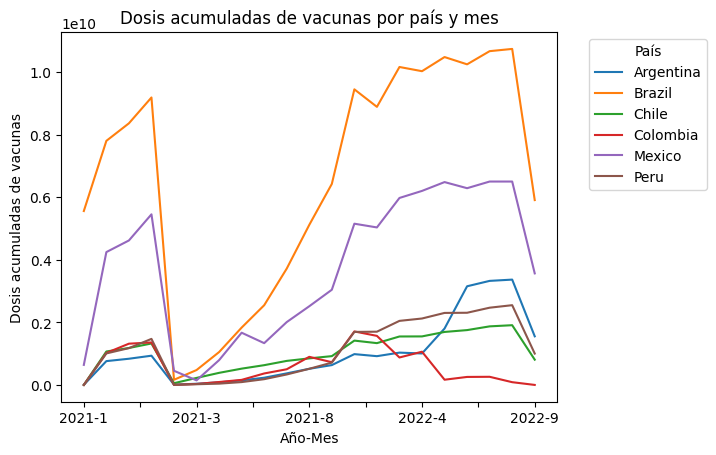

In [49]:

# Extraemos el año y el mes de la columna de fecha
df_latinoAmerica_paises_fecha['year'] = df_latinoAmerica_paises_fecha['date'].dt.year
df_latinoAmerica_paises_fecha['month'] = df_latinoAmerica_paises_fecha['date'].dt.month

# Creamos una nueva columna 'year_month' que combina el año y el mes
df_latinoAmerica_paises_fecha['year_month'] = df_latinoAmerica_paises_fecha['year'].astype(str) + '-' + df_latinoAmerica_paises_fecha['month'].astype(str)

# Agrupamos por país y 'year_month', y luego calculamos la suma de las dosis de vacuna administradas
df_grouped = df_latinoAmerica_paises_fecha.groupby(['country_name', 'year_month'])['cumulative_vaccine_doses_administered'].sum()

# Desapilamos el DataFrame agrupado y creamos el gráfico
df_grouped.unstack(level=0).plot(kind='line')

# Agregamos títulos y etiquetas
plt.title('Dosis acumuladas de vacunas por país y mes')
plt.xlabel('Año-Mes')
plt.ylabel('Dosis acumuladas de vacunas')
plt.legend(title='País', bbox_to_anchor=(1.05, 1), loc='upper left')

# Mostrar el gráfico
plt.show()


Generamos varios graficos para ver cual estaba mejor visualmente

El gráfico muestra la evolución mensual de las dosis acumuladas de vacunas administradas por país en Latinoamérica. 

Cada línea representa un país diferente y su progreso a lo largo de los meses. 

*Escala Logarítmica:* La escala vertical es logarítmica, lo que permite visualizar grandes variaciones en los datos.

*Dosis Acumuladas:* Las líneas indican el número total de dosis administradas, acumuladas mes a mes.

*Comparación entre Países:* Se puede comparar la rapidez con la que cada país ha administrado las vacunas.


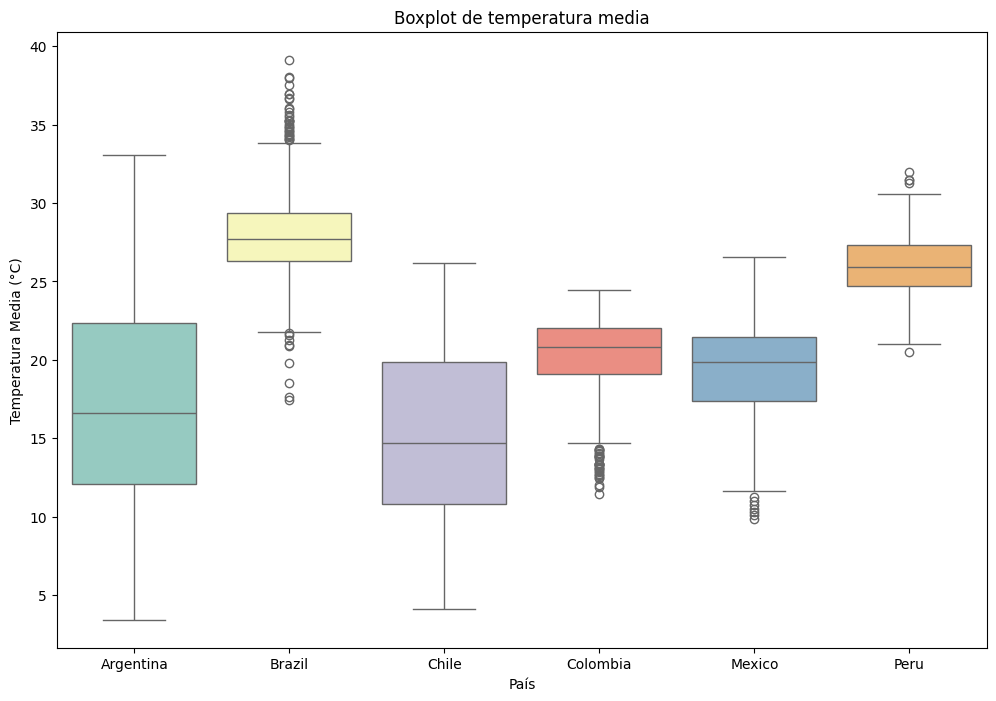

In [50]:
# Configuración del gráfico
plt.figure(figsize=(12, 8))  # Ajusta el tamaño del gráfico
plt.title('Boxplot de temperatura media')
plt.xlabel('País')
plt.ylabel('Temperatura Media (°C)')  # Etiqueta clara para el eje Y

# Crear el gráfico de boxplot
sns.boxplot(x='country_name', y='average_temperature_celsius', data=df_latinoAmerica_paises_fecha, hue='country_name', palette='Set3')

# Mostrar el gráfico
plt.show()


El gráfico de boxplot muestra la distribución de la temperatura media en diferentes países. 

**Las observaciones clave son:**

*Rango de Temperatura:* Varía desde aproximadamente -5 hasta 40 grados Celsius.

*Mediana y Cuartiles:* Cada boxplot indica la mediana (línea central) y los cuartiles (bordes del rectángulo).

*Outliers:* Los puntos fuera de los ‘bigotes’ representan valores atípicos.

**Ahora declaramos nuestra columna de fecha como nuestro indice para nuestros futuros estudios a lo largo del tiempo**

In [51]:

df_latinoAmerica_paises_fecha.set_index('date', inplace=True)

*acontiniacion observaremos  las dosis administradas por mes en todos los paises*

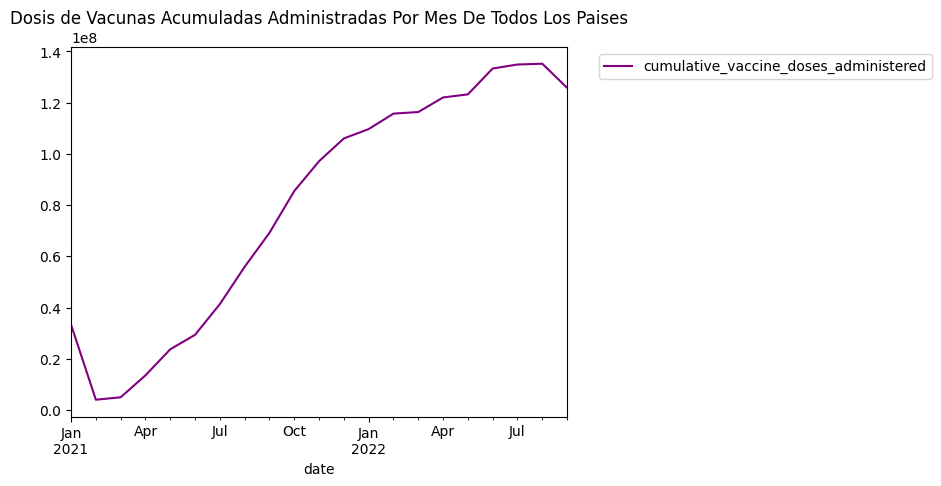

In [52]:
#Grafica de valores medios de todos los paises 
df_latinoAmerica_paises_fecha.resample('ME').mean(numeric_only=True)['cumulative_vaccine_doses_administered'].plot(color='purple')
plt.legend( bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('Dosis de Vacunas Acumuladas Administradas Por Mes De Todos Los Paises')
plt.show()

El gráfico muestra la evolución de las dosis acumuladas de vacunas administradas por mes en todos los países. 

*Tendencia Ascendente:* La línea muestra un aumento constante en el número de dosis administradas a lo largo del tiempo.

*Crecimiento Rápido:* Hay un aumento pronunciado en las dosis administradas alrededor de abril de 2021.

*Desaceleración y Nueva Subida:* Después de diciembre de 2021, la tasa de crecimiento se desacelera y luego sube más abruptamente entre enero y marzo de 2022.

*Estabilización:* La línea se estabiliza hacia julio de 2022, lo que podría indicar una ralentización en la administración de nuevas dosis.

Este gráfico es relevante para entender el progreso global de la vacunación contra la COVID-19 a lo largo del tiempo. 

**Analisis mas detallado por pais**

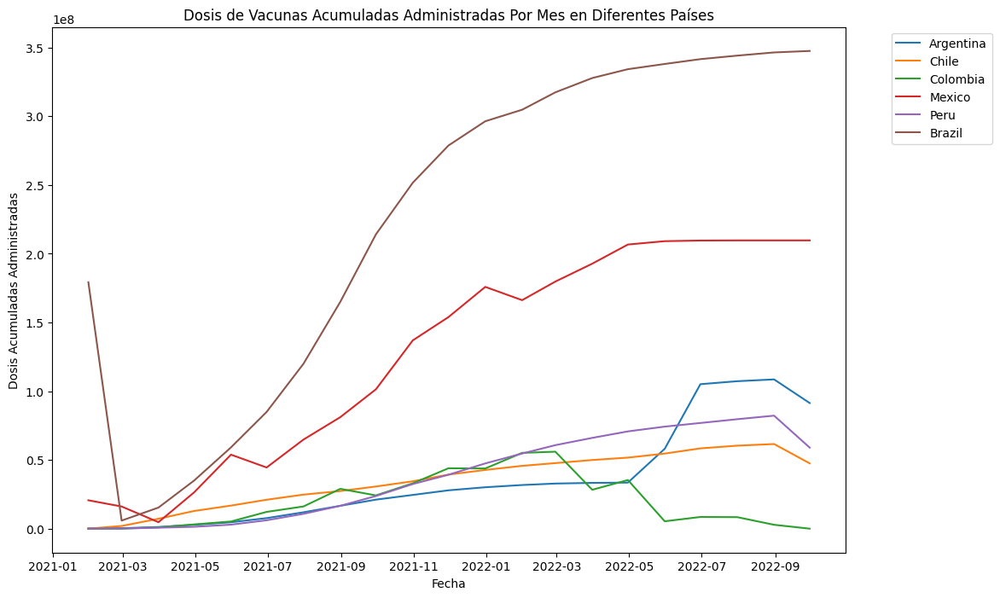

In [53]:
# Crear una figura y ejes para el gráfico
fig, ax = plt.subplots(figsize=(12, 8))

# Iterar sobre cada país y graficar los datos resampleados
for pais in mis_paises:
    # Filtrar datos para el país actual
    df_pais = df_latinoAmerica_paises_fecha[df_latinoAmerica_paises_fecha['country_name'] == pais]
    
    # Resamplear los datos mensualmente y calcular la media
    df_resampled = df_pais.resample('ME').mean(numeric_only=True)
    
    # Graficar la columna específica
    ax.plot(df_resampled.index, df_resampled['cumulative_vaccine_doses_administered'], label=pais)

# Ajustar la leyenda y el título del gráfico
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('Dosis de Vacunas Acumuladas Administradas Por Mes en Diferentes Países')
plt.xlabel('Fecha')
plt.ylabel('Dosis Acumuladas Administradas')

# Mostrar el gráfico
plt.show()

In [54]:

# Crear un DataFrame resumido
df_resampled = df_latinoAmerica_paises_fecha.resample('ME').mean(numeric_only=True)

# Crear el gráfico interactivo
fig = px.line(df_resampled, y='cumulative_vaccine_doses_administered', title='Dosis de Vacunas Acumuladas Administradas Por Mes De Todos Los Paises')
fig.show()


El gráfico muestra la evolución de las dosis acumuladas de vacunas administradas por mes en diferentes países. 

**Tendencia Ascendente:** La línea muestra un aumento constante en el número de dosis administradas a lo largo del tiempo.

**Crecimiento Rápido:** Hay un aumento pronunciado en las dosis administradas alrededor de abril de 2021.

**Desaceleración y Nueva Subida:** Después de diciembre de 2021, la tasa de crecimiento se desacelera y luego sube más abruptamente entre enero y marzo de 2022.

**Estabilización:** La línea se estabiliza hacia julio de 2022, lo que podría indicar una ralentización en la administración de nuevas dosis.

Este gráfico es relevante para entender el progreso global de la vacunación contra la COVID-19 a lo largo del tiempo.

**Muertes por Mes**

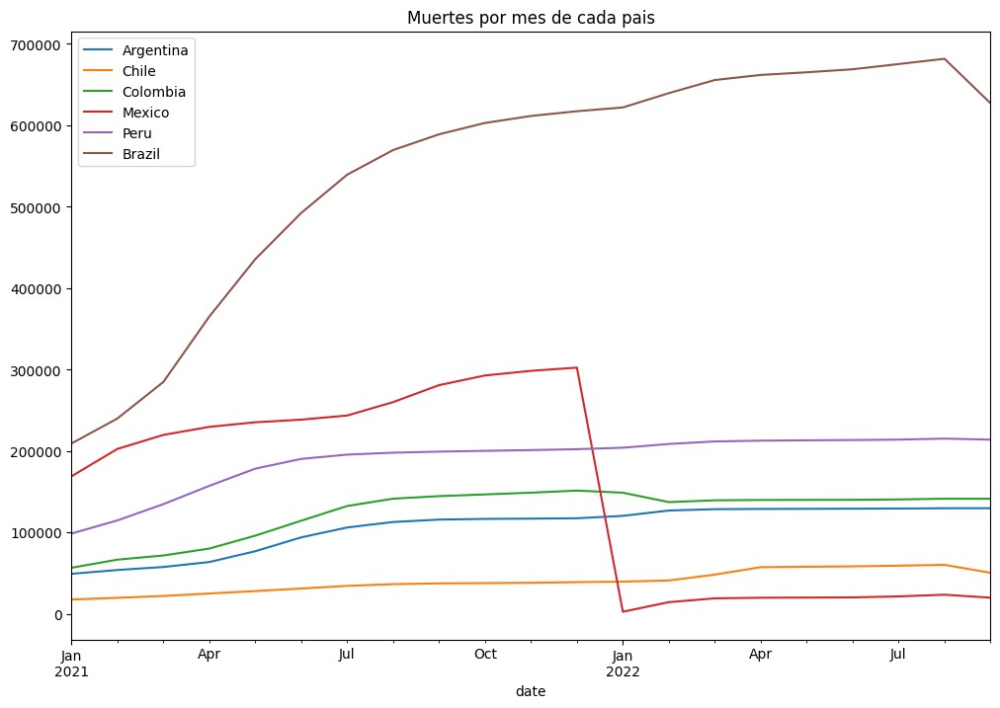

In [55]:
# Crear una figura y ejes para el gráfico
fig, ax = plt.subplots(figsize=(12, 8))

# Iterar sobre cada país y graficar los datos resampleados
for pais in mis_paises:
    # Filtrar datos para el país actual
    df_latinoAmerica_paises_fecha[df_latinoAmerica_paises_fecha['country_name'] == pais].resample('ME').mean(numeric_only=True)['cumulative_deceased'].plot()
    
    
# Ajustar la leyenda y el título del gráfico
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('Muertes por mes de cada pais')
plt.legend(mis_paises)

# Mostrar el gráfico
plt.show()

El gráfico muestra la evolución de las muertes acumuladas por mes en diferentes países.

*Brasil:* Representado por la línea marrón, muestra el mayor número de muertes, alcanzando casi 700,000.

*México:* La línea azul indica un número significativo de muertes, aunque mucho menor que Brasil.

*Argentina, Chile, Colombia y Perú:* Las líneas de estos países muestran tendencias variadas pero todas por debajo de las cifras de Brasil y México.

**Nota:** podemos notar que hay una falta de datos por eso nuestra grafica muestra una caida en picada en el pais de Mexico

Este gráfico es relevante ya que proporciona una comparación visual de las tasas de mortalidad mensuales a través de múltiples países sudamericanos a lo largo del tiempo.

In [56]:
# Crear un DataFrame resumido
df_resampled = df_latinoAmerica_paises_fecha.groupby(['country_name', pd.Grouper(freq='ME')]).mean(numeric_only=True).reset_index()

# Crear el gráfico interactivo
fig = px.line(df_resampled, x='date', y='cumulative_deceased', color='country_name', title='Muertes por mes de cada pais')

# Mostrar el gráfico
fig.show()


Este gráfico de líneas interactivo muestra la evolución de las muertes acumuladas por mes en diferentes países. 

Cada país se representa con una línea de color diferente. 

Puedes pasar el cursor sobre el gráfico para ver los valores exactos en cada punto.


**Casos Confirmados**

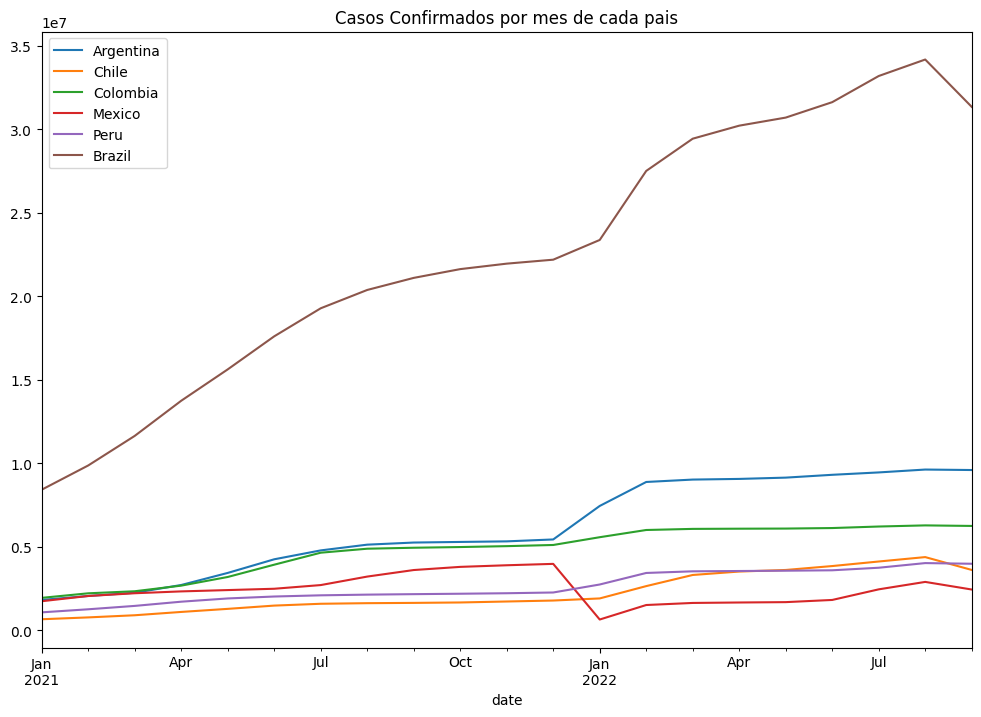

In [57]:
# Crear una figura y ejes para el gráfico
fig, ax = plt.subplots(figsize=(12, 8))

# Iterar sobre cada país y graficar los datos resampleados
for pais in mis_paises:
    # Filtrar datos para el país actual
    df_latinoAmerica_paises_fecha[df_latinoAmerica_paises_fecha['country_name'] == pais].resample('ME').mean(numeric_only=True)['cumulative_confirmed'].plot()
    
    
# Ajustar la leyenda y el título del gráfico
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('Casos Confirmados por mes de cada pais')
plt.legend(mis_paises)

# Mostrar el gráfico
plt.show()

El gráfico muestra la tendencia de casos confirmados acumulados por mes en varios países. 

Cada línea representa un país diferente y su evolución a lo largo del tiempo desde enero de 2021 hasta julio de 2022. 

Las líneas muestran diferentes patrones de crecimiento en el número de casos confirmados, lo que puede indicar cómo cada país ha sido afectado y cómo ha respondido a lo largo del tiempo.

**Interactivo**

In [58]:


df_resampled = df_latinoAmerica_paises_fecha.groupby(['country_name', pd.Grouper(freq='ME')]).mean(numeric_only=True).reset_index()

# Crear el gráfico interactivo con Plotly
fig = px.line(df_resampled, x='date', y='cumulative_confirmed', color='country_name', title='Casos Confirmados por mes de cada pais')



# Mostrar el gráfico
fig.show()


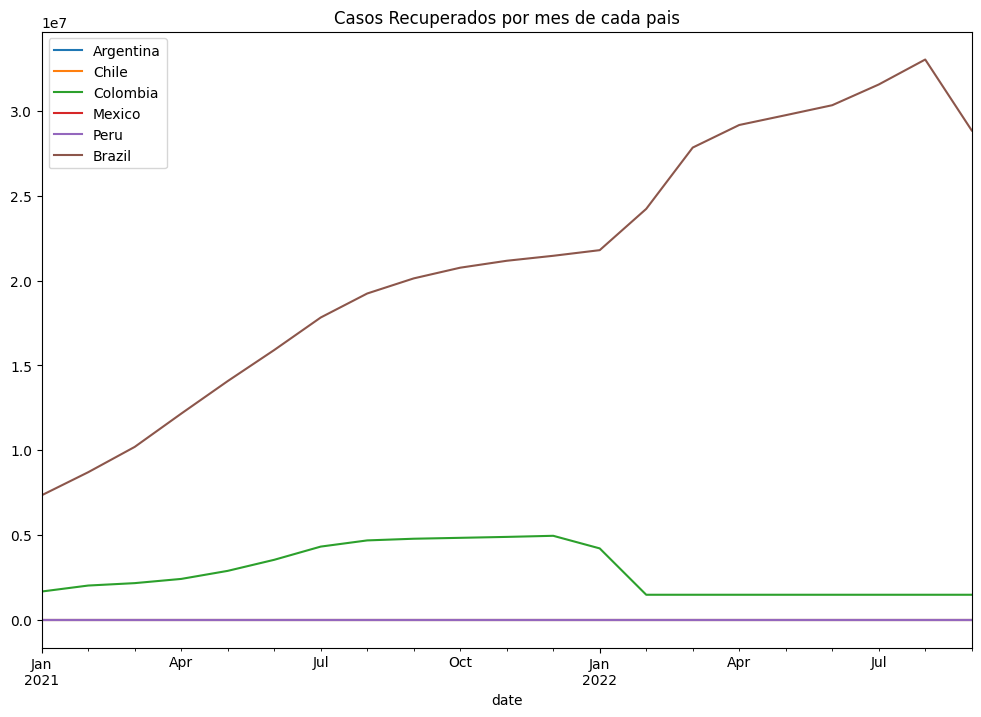

In [59]:
# Crear una figura y ejes para el gráfico
fig, ax = plt.subplots(figsize=(12, 8))

# Iterar sobre cada país y graficar los datos resampleados
for pais in mis_paises:
    # Filtrar datos para el país actual
    df_latinoAmerica_paises_fecha[df_latinoAmerica_paises_fecha['country_name'] == pais].resample('ME').mean(numeric_only=True)['cumulative_recovered'].plot()
    
    
# Ajustar la leyenda y el título del gráfico
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('Casos Recuperados por mes de cada pais')
plt.legend(mis_paises)

# Mostrar el gráfico
plt.show()

El gráfico muestra la evolución de los casos recuperados de COVID-19 por mes para cada uno de los países seleccionados en la lista mis_paises. 

**Aquí hay una descripción detallada:**

*Título del Gráfico:* “Casos Recuperados por mes de cada país” indica que el gráfico se centra en la recuperación mensual de pacientes de COVID-19 en varios países.

*Eje X:* Representa el tiempo, con fechas que van desde enero de 2021 hasta aproximadamente julio de 2022.

*Eje Y:* Parece representar el número acumulado de casos recuperados, con valores en la escala de los diez millones.

*Líneas del Gráfico:* Cada línea corresponde a un país diferente, identificado por colores únicos y una leyenda que incluye Argentina, Chile, Colombia, México, Perú y Brasil.

El gráfico permite comparar visualmente las tendencias de recuperación entre estas naciones a lo largo de aproximadamente 18 meses.

**Nota**: El grafico no nos esta mostrando mucho por que no habian muchos datos para todos los paises, incluso algunos paises no tienen datos acerca de los recuperados 

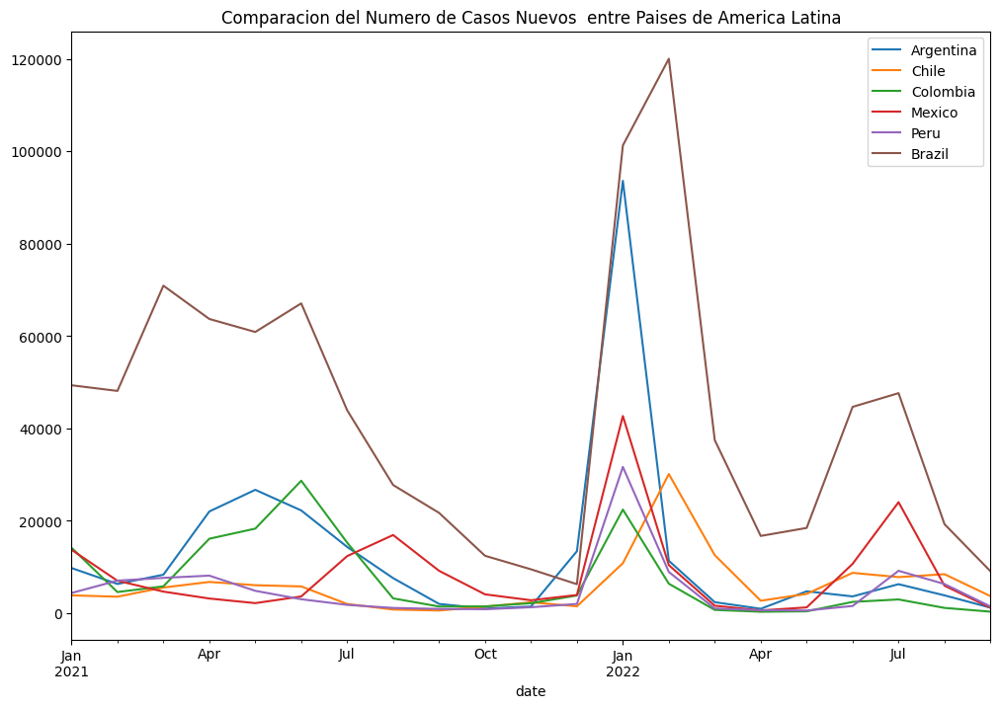

In [60]:
# Crear una figura y ejes para el gráfico
fig, ax = plt.subplots(figsize=(12, 8))

# Iterar sobre cada país y graficar los datos resampleados
for pais in mis_paises:
    # Filtrar datos para el país actual
    df_latinoAmerica_paises_fecha[df_latinoAmerica_paises_fecha['country_name'] == pais].resample('ME').mean(numeric_only=True)['new_confirmed'].plot()
    
    
# Ajustar la leyenda y el título del gráfico
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title('Comparacion del Numero de Casos Nuevos  entre Paises de America Latina')
plt.legend(mis_paises)

# Mostrar el gráfico
plt.show()

In [61]:
import plotly.graph_objects as go

# Crear una figura vacía
fig = go.Figure()

# Iterar sobre cada país y agregar los datos al gráfico
for pais in mis_paises:
    # Filtrar datos para el país actual
    data_pais = df_latinoAmerica_paises_fecha[df_latinoAmerica_paises_fecha['country_name'] == pais].resample('ME').mean(numeric_only=True)['new_confirmed']
    
    # Agregar los datos al gráfico
    fig.add_trace(go.Scatter(x=data_pais.index, y=data_pais.values, mode='lines', name=pais))

# Ajustar la leyenda y el título del gráfico
fig.update_layout(title='Comparacion del Numero de Casos Nuevos entre Paises de America Latina', 
                  xaxis_title='Fecha', 
                  yaxis_title='Casos Nuevos', 
                  legend_title='País')

# Mostrar el gráfico
fig.show()


El gráfico  muestra la comparación del número de casos nuevos de COVID-19 entre varios países de América Latina desde enero de 2021 hasta julio de 2022. 

**Aquí hay algunos puntos clave que podemos observar:**

*Título del Gráfico:* “Comparación del Número de Casos Nuevos entre Países de América Latina” sugiere que el gráfico está diseñado para comparar la cantidad de casos nuevos de COVID-19 entre los países listados.

*Eje X:* Representa el tiempo, con meses que van desde enero de 2021 hasta julio de 2022.

*Eje Y:* Indica el número de casos nuevos, con valores que van desde 0 hasta 1,200,000.

*Líneas del Gráfico:* Cada línea representa un país diferente con un color distinto, y los países incluidos son Argentina, Chile, Colombia, México y Perú.

Las líneas muestran cómo ha fluctuado el número de casos nuevos en cada país a lo largo del tiempo, permitiendo comparaciones directas entre las tendencias de cada uno.

*Nota*: Podemos ver que algo atipico pasa en argentina que llego a tener un pico tan alto en el mes de enero sabiendo que la diferencia de poblacion entre Argentina y Brasil es demaciado alta.
tendriamos que analizar bien los datos y mirar que estrategia implemento cada pais ya que podemos ver que en abril llegaron a un bache muy bajo

**Distribucion**

Text(0.5, 1.0, 'Distribución de Dosis Acumuladas Por Pais')

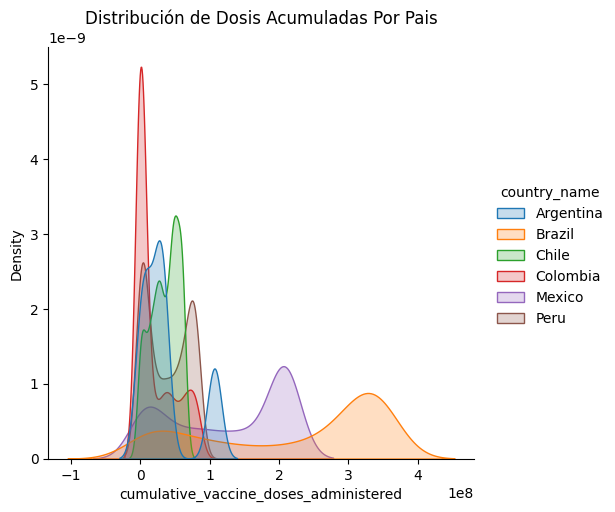

In [62]:
sns.displot(df_latinoAmerica_paises_fecha, x="cumulative_vaccine_doses_administered", hue="country_name", kind="kde", fill=True) #fill es el relleno
plt.title('Distribución de Dosis Acumuladas Por Pais')

El gráfico KDE (Estimación de Densidad Kernel)muestra la distribución de las dosis acumuladas de vacunas administradas en varios países de América Latina. 

*Título:* ‘Distribución de Dosis Acumuladas Por País’ indica que el gráfico representa la distribución de las dosis de vacunas acumuladas por país.

*Eje X:* Representa las dosis acumuladas de vacunas administradas, con una escala de aproximadamente -1 a 3e8.

*Eje Y:* Etiquetado como ‘Density’, muestra la densidad de la distribución de datos.

*Curvas:* Cada curva representa un país diferente, con colores distintos y el área bajo la curva rellenada.

In [63]:


# Crear una figura vacía
fig = go.Figure()

# Iterar sobre cada país y agregar los datos al gráfico
for pais in df_latinoAmerica_paises_fecha['country_name'].unique():
    # Filtrar datos para el país actual
    data_pais = df_latinoAmerica_paises_fecha[df_latinoAmerica_paises_fecha['country_name'] == pais]['cumulative_vaccine_doses_administered']
    
    # Agregar los datos al gráfico
    fig.add_trace(go.Histogram(x=data_pais, histnorm='probability density', name=pais))

# Ajustar la leyenda y el título del gráfico
fig.update_layout(title='Distribución de Dosis Acumuladas Por Pais', 
                  xaxis_title='Dosis Acumuladas', 
                  yaxis_title='Densidad', 
                  bargap=0.2, # gap between bars of adjacent location coordinates
                  bargroupgap=0.1, # gap between bars of the same location coordinates
                  legend_title='País')

# Mostrar el gráfico
fig.show()


 Para cada país, se agrega un histograma a la figura. 

 El eje x del histograma representa las dosis acumuladas de vacunas para ese país. 

 El histograma se normaliza para mostrar la densidad de probabilidad, lo que significa que el área total bajo cada histograma será 1. 

 Esto es útil cuando se comparan distribuciones con diferentes números de observaciones.

 Por lo tanto, este gráfico te permite visualizar y comparar la distribución de las dosis acumuladas de vacunas para cada país. Cada país tiene su propio histograma, y puedes ver la densidad de probabilidad de las dosis acumuladas en el eje y. 
 
 Esto te proporciona una visión clara de cómo se distribuyen las dosis de vacunas en cada país

**Temperaturas**

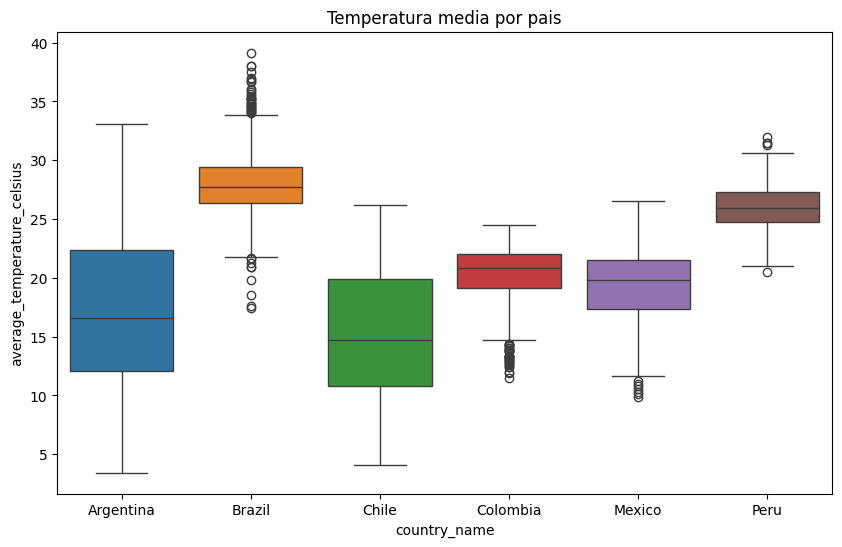

In [64]:
#promedio de temperatura Vs nuevos confirmados por pais 
fig, ax = plt.subplots(figsize=(10, 6))
sns.boxplot(x='country_name', y='average_temperature_celsius', data=df_latinoAmerica_paises_fecha, hue='country_name')
plt.title('Temperatura media por pais')
plt.show()

Según el gráfico de caja, podemos analizar la distribución de la temperatura media en cada uno de los países de América Latina incluidos. 

**Aquí hay algunas observaciones que podríamos hacer:**

*Rango de Temperaturas:* Cada país tiene un rango intercuartílico de temperaturas, que es la región dentro de la caja en el gráfico. Este rango representa el 50% central de las temperaturas observadas en cada país, lo que nos da una idea de la variabilidad de la temperatura en cada país.

*Temperatura Media:* La línea dentro de cada caja representa la temperatura media de cada país. Podemos comparar estas líneas para obtener una idea de cómo se compara la temperatura media entre los países.

*Valores Atípicos:* Los puntos fuera de las cajas representan valores atípicos, que son temperaturas que caen fuera del rango típico de temperaturas para cada país. Estos podrían indicar eventos climáticos extremos o errores en los datos.

*Comparación entre Países:* Al observar las cajas para cada país, podemos obtener una idea de cómo se comparan las temperaturas entre los países. Por ejemplo, si una caja es más alta que otra, eso indica que ese país tiene una mayor variabilidad de temperaturas.

Es importante recordar que este gráfico solo muestra la distribución de las temperaturas, no muestra cómo estas temperaturas podrían estar relacionadas con otros factores, como la cantidad de casos de COVID-19

**Nota:**podemos observar que para chile y argentina no tenemos valores atipicos para este caso

**Violin**

*Ahora vamos a entender los datos por medio de graficos de violin*


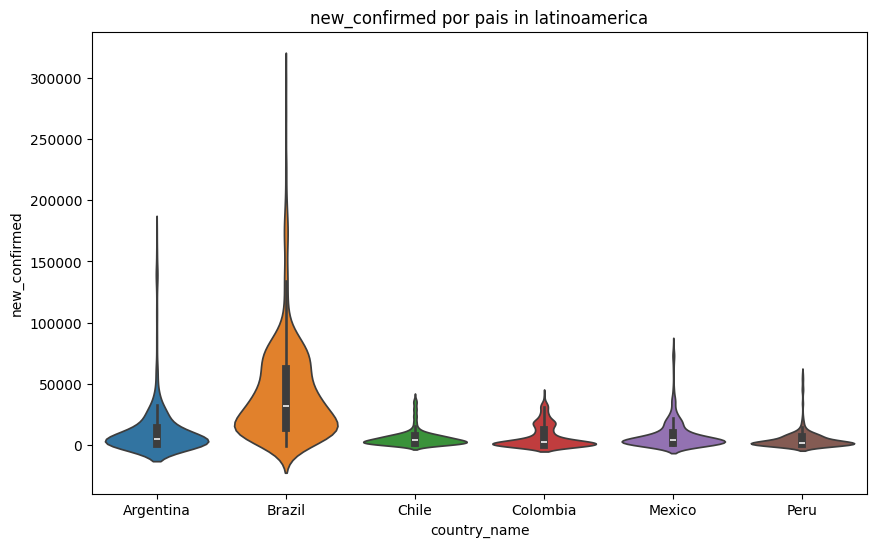

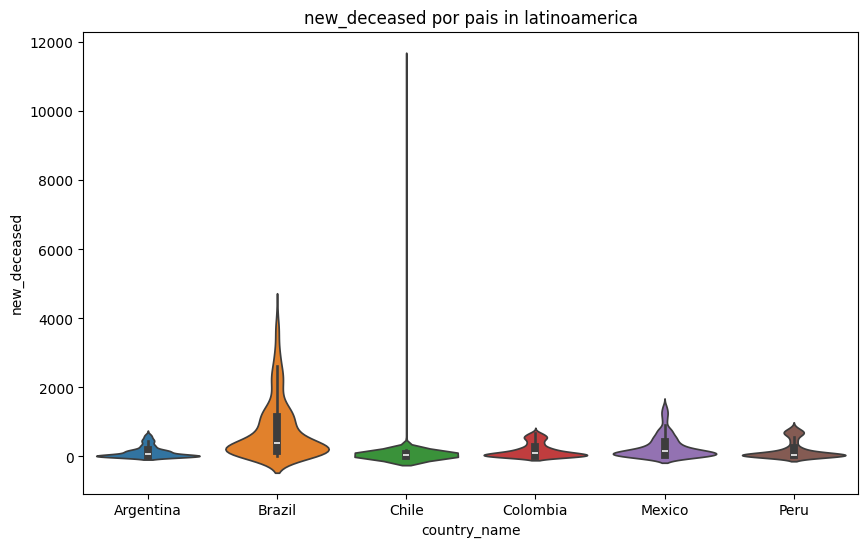

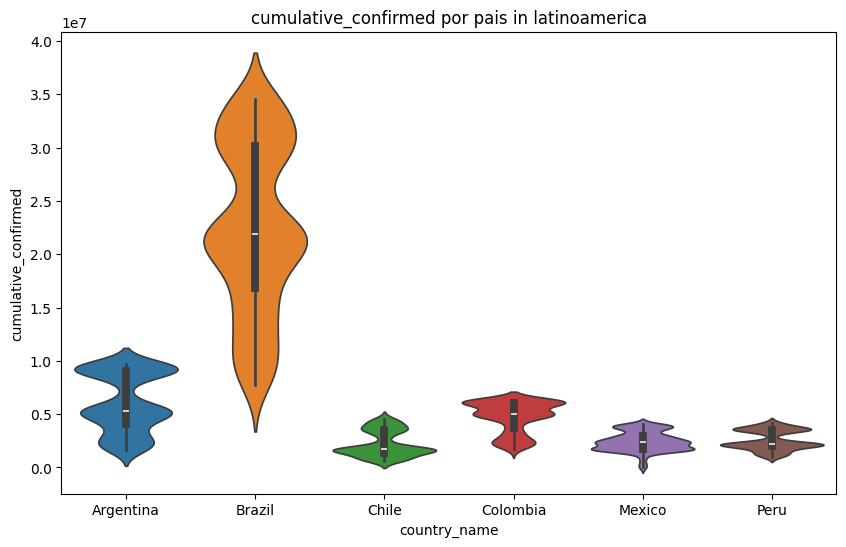

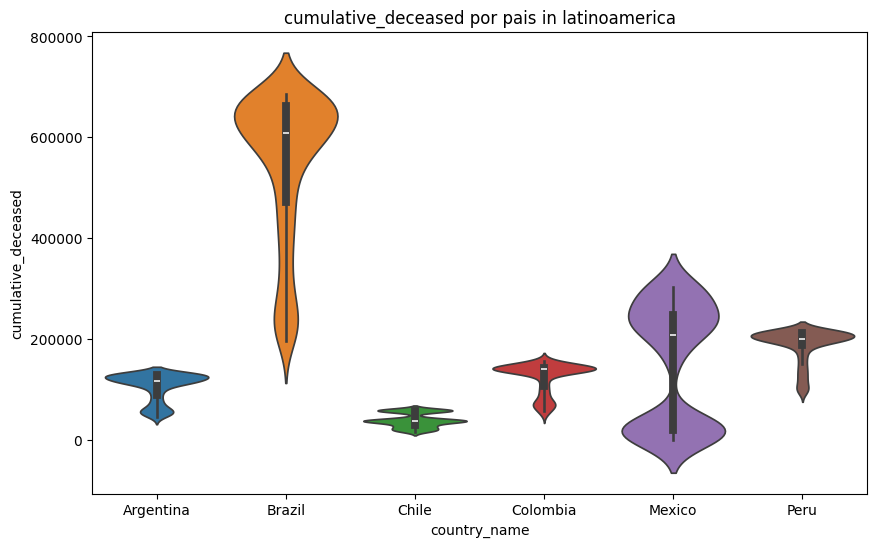

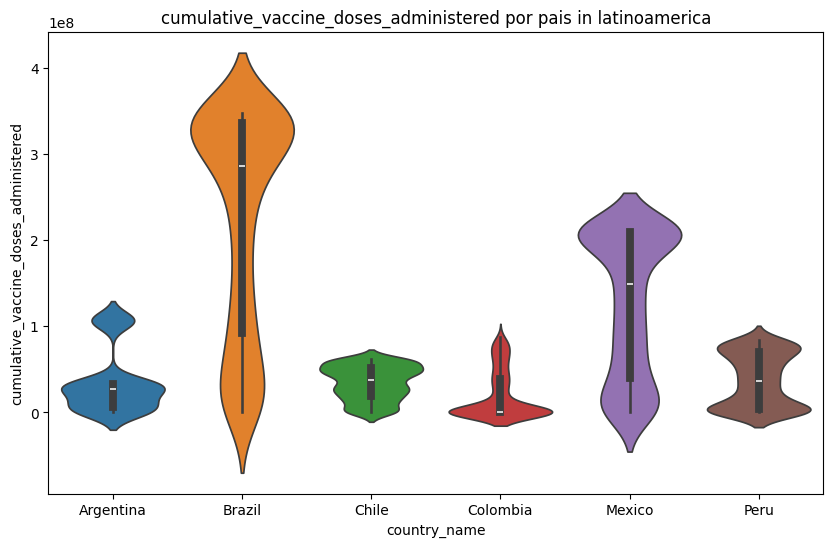

...

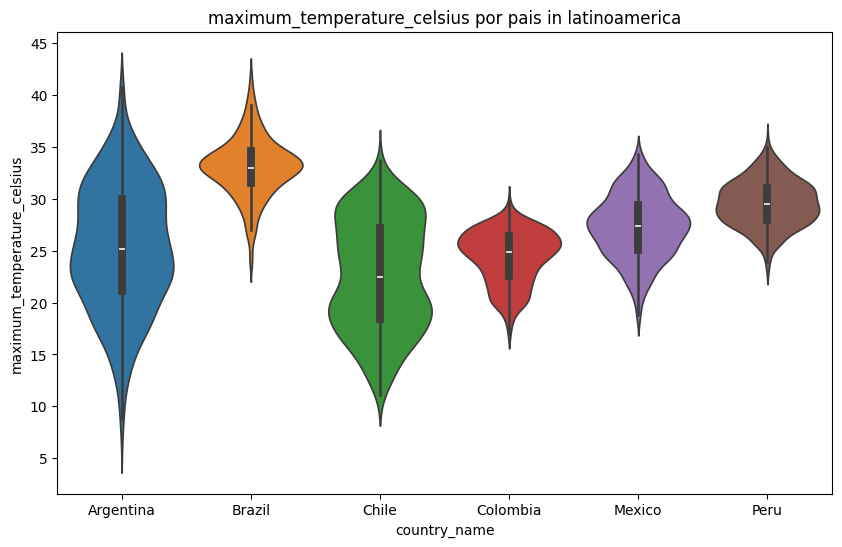

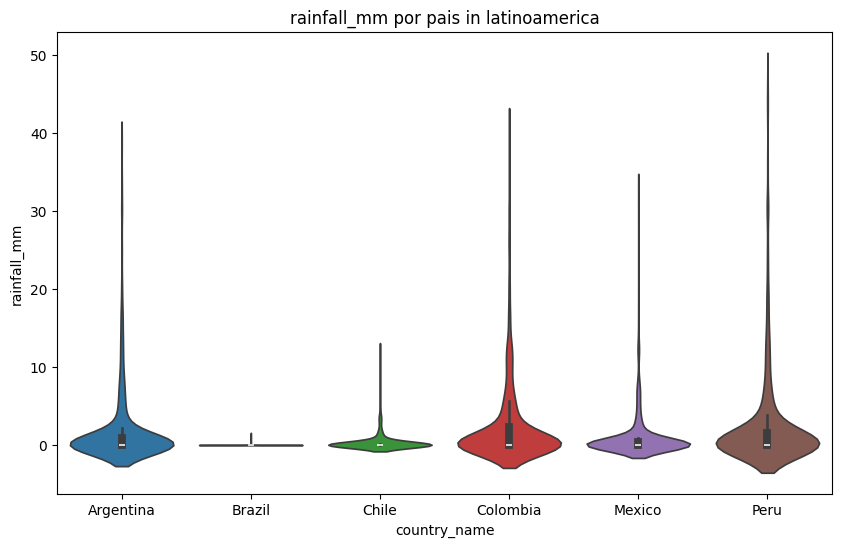

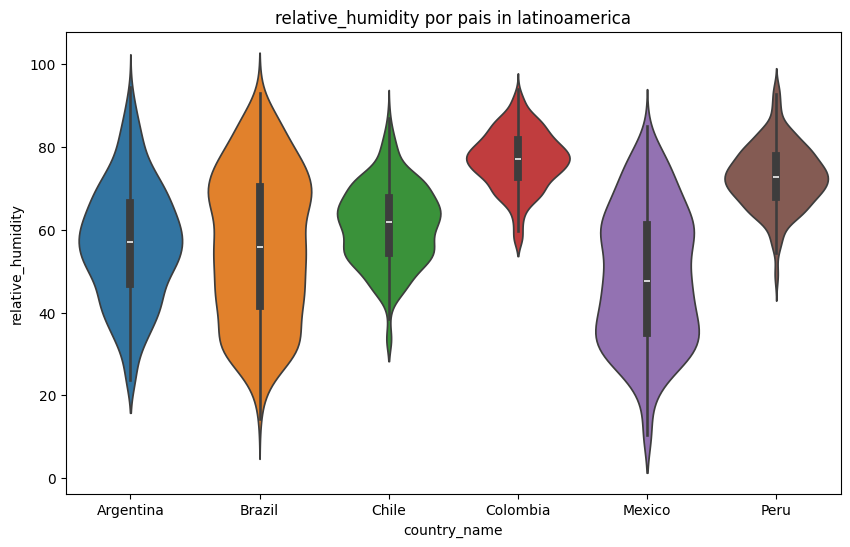

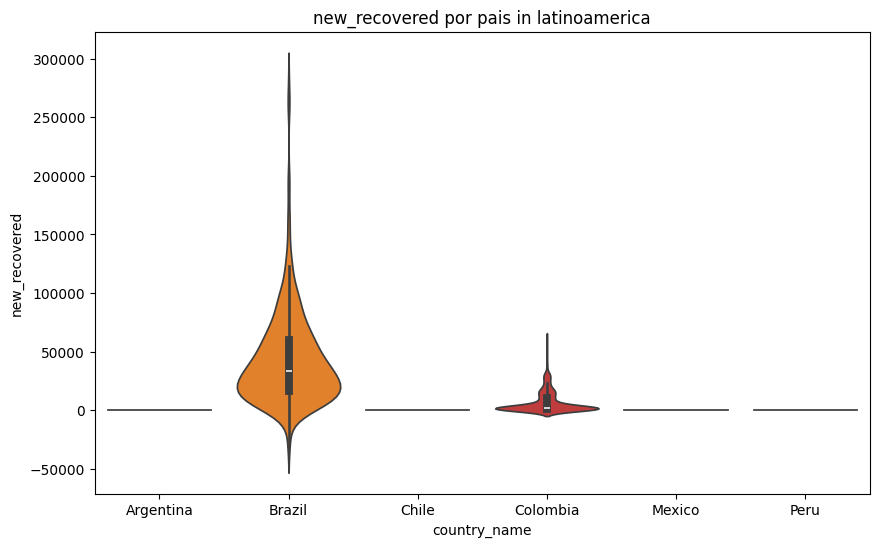

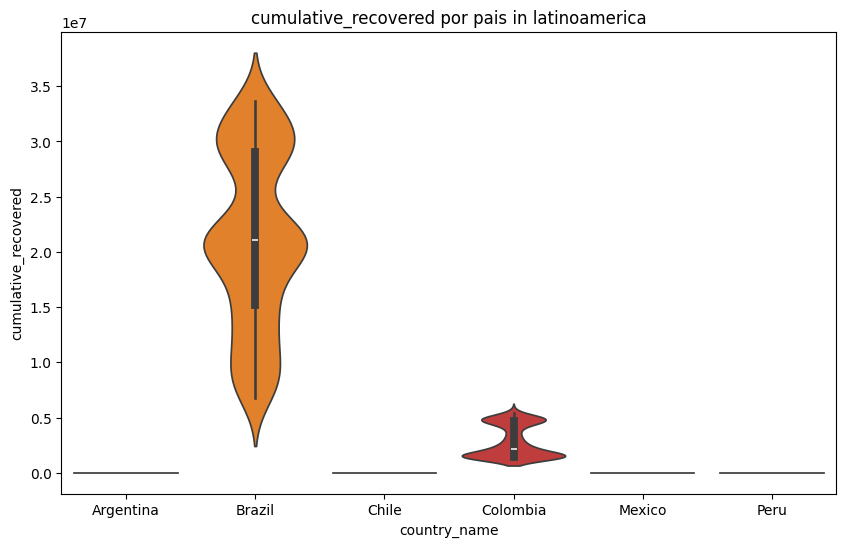

In [65]:
#creamos un dataframe con culumnas mayores a 6 que son las que tienen valores diferentes 
columnas_mayore_6 =[]
for i in df_latinoAmerica_paises_fecha.columns:
    if i not in ['location_key', 'date', 'country_code', 'latitude', 'longitude']:
        if df_latinoAmerica_paises_fecha[i].nunique()>6:
            columnas_mayore_6.append(i)
#Agregamos a columnas_mayores_6  la columna Country_name para poder hacer analisis por pais
columnas_mayore_6.append('country_name')
#creamos el df con las columnas mayores a 6
df_latinoAmerica_paises_mayores_6 = df_latinoAmerica_paises_fecha[columnas_mayore_6]

#violinplot en todos los paises para variables numericas
for i in df_latinoAmerica_paises_mayores_6.columns:
    if i not in ['location_key', 'date', 'country_code', 'latitude', 'longitude', 'country_name', 'month', 'year_month']:
        fig, ax = plt.subplots(figsize=(10, 6))
        sns.violinplot(x='country_name', y=i, data=df_latinoAmerica_paises_mayores_6, hue='country_name')
        plt.title(f'{i} por pais in latinoamerica')
        plt.show()

Este código realiza un análisis exploratorio de los datos de COVID-19 para varios países de América Latina.

**Selección de columnas:** Primero, el código crea una lista vacía llamada columnas_mayore_6. Luego, itera sobre todas las columnas en el DataFrame df_latinoAmerica_paises_fecha y agrega a la lista las columnas que tienen más de 6 valores únicos. Esto se hace para filtrar las columnas que tienen suficiente variabilidad en sus datos. También agrega la columna ‘country_name’ a la lista para poder hacer análisis por país.

**Creación de un nuevo DataFrame:** A continuación, el código crea un nuevo DataFrame df_latinoAmerica_paises_mayores_6 que solo incluye las columnas seleccionadas en el paso anterior.

**Creación de gráficos de violín:** Finalmente, el código itera sobre todas las columnas en el nuevo DataFrame y crea un gráfico de violín para cada una usando la biblioteca seaborn. Los gráficos de violín son útiles para visualizar la distribución de los datos. En este caso, cada gráfico muestra la distribución de una variable numérica para cada país. Los países se indican en el eje x, los valores de la variable en el eje y, y cada país tiene un color distinto.



**Interactivo**

In [66]:
'''Este código creará gráficos de violín interactivos para cada columna numérica en tu DataFrame.
 Podrás pasar el cursor sobre los puntos para ver los valores exactos, acercar y alejar, 
 e incluso ocultar o mostrar categorías haciendo clic en la leyenda'''
#depende de haber ejecutado el anterior codigo par poder ontener el df_latinoAmerica_paises_mayores_6
# Iterar sobre todas las columnas numéricas en el DataFrame
for i in df_latinoAmerica_paises_mayores_6.columns:
    if i not in ['location_key', 'date', 'country_code', 'latitude', 'longitude', 'country_name', 'month', 'year_month']:
        # Crear el gráfico de violín
        fig = px.violin(df_latinoAmerica_paises_mayores_6, y=i, box=True, points="all", color='country_name')
        
        # Ajustar el título del gráfico
        fig.update_layout(title=f'{i} por pais in latinoamerica')
        
        # Mostrar el gráfico
        fig.show()


**Poblacion**

Ahora procedemos a analizar la distribucion de la poblacion por grupos de edad en los paises seleccionados, y asi entender como se comporta la poblacion en cada pais y poder tomar decisiones mas acertadas en un futuro


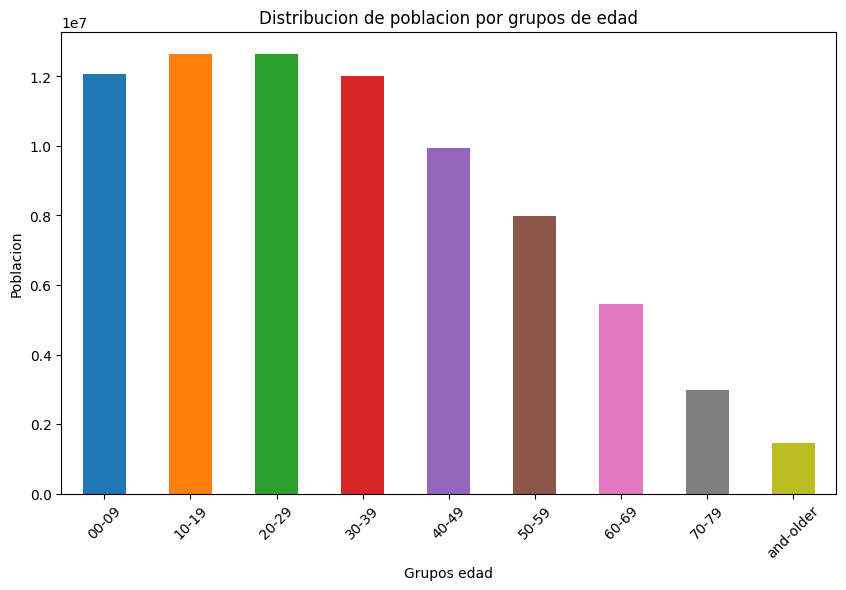

In [67]:
#Calculamos la distribuccion de la poblacion por grupos de edad
columnas_edades = [ 'population_age_00_09','population_age_10_19','population_age_20_29',
                   'population_age_30_39','population_age_40_49','population_age_50_59',
                   'population_age_60_69','population_age_70_79','population_age_80_and_older']
disribucion_edades = df_latinoAmerica_paises_fecha[columnas_edades].mean()
colores = [
    'tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple',
    'tab:brown', 'tab:pink', 'tab:gray', 'tab:olive'
]
plt.figure(figsize=(10, 6))
disribucion_edades.plot(kind='bar',color=colores , stacked=True)
plt.xlabel('Grupos edad')
plt.ylabel('Poblacion')
plt.title('Distribucion de poblacion por grupos de edad')
plt.xticks(range(len(columnas_edades)), [col.split('_')[-2] + '-' + col.split('_')[-1] for col in columnas_edades], rotation=45)
plt.show()

el grafico anterior nos muestra la distribucion de grupos por edad a nivel latinoamerica


Etario


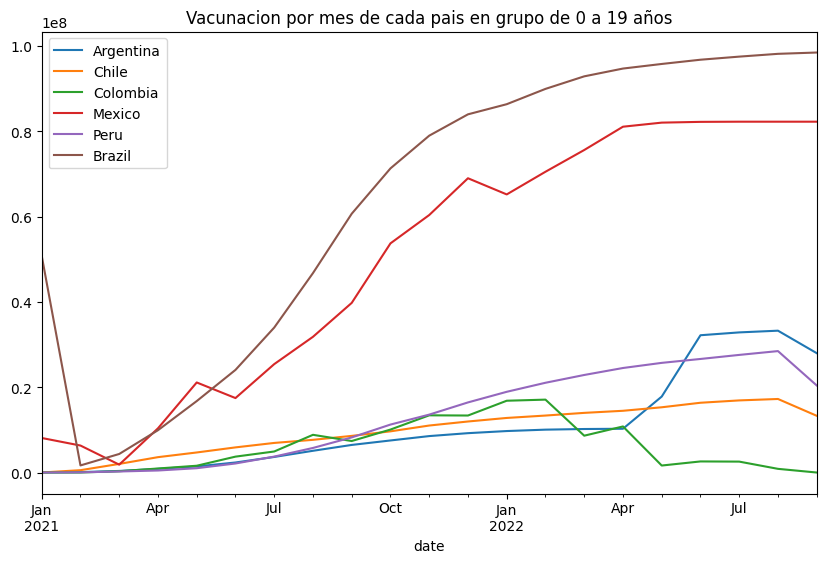

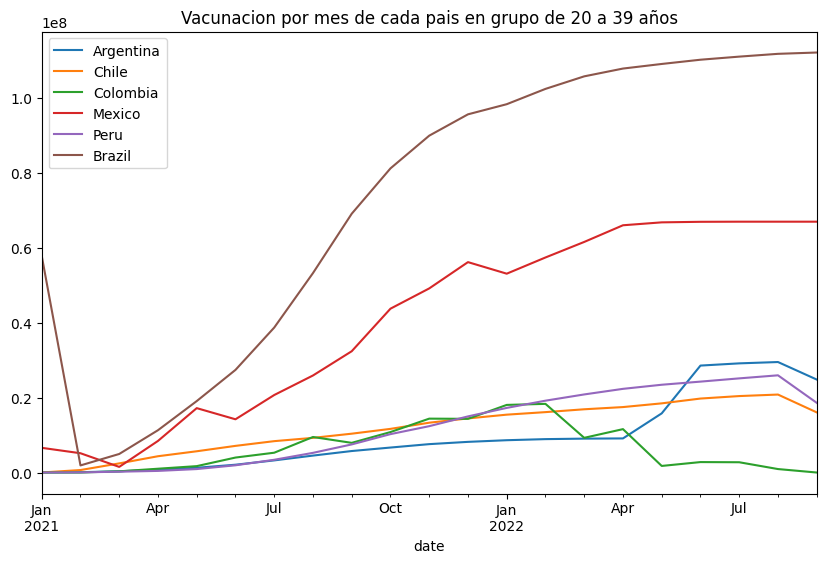

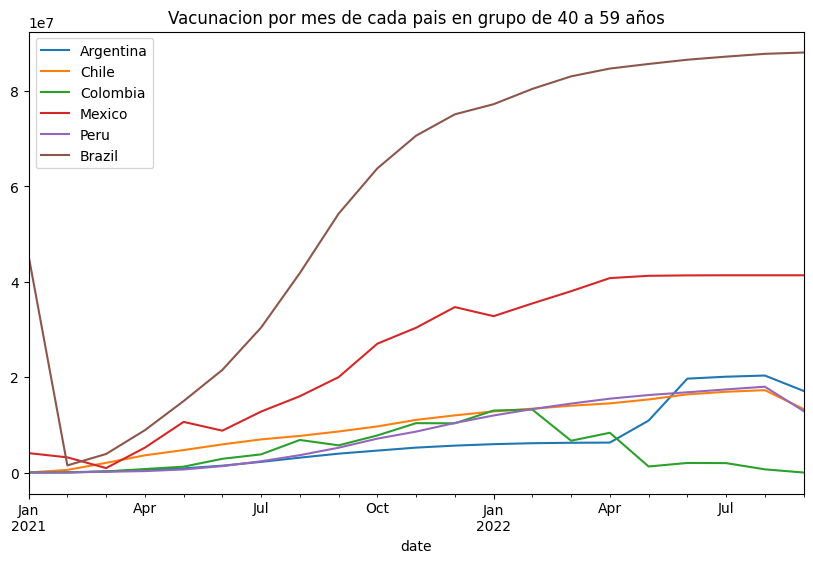

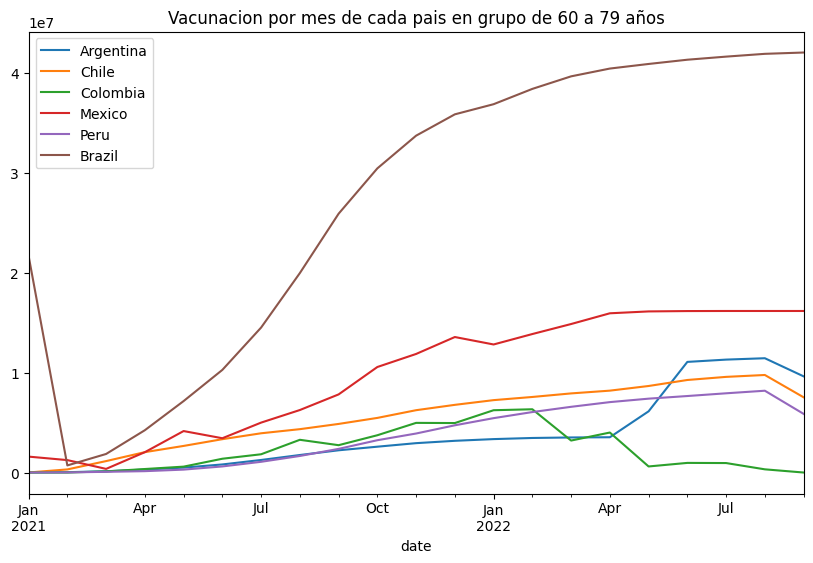

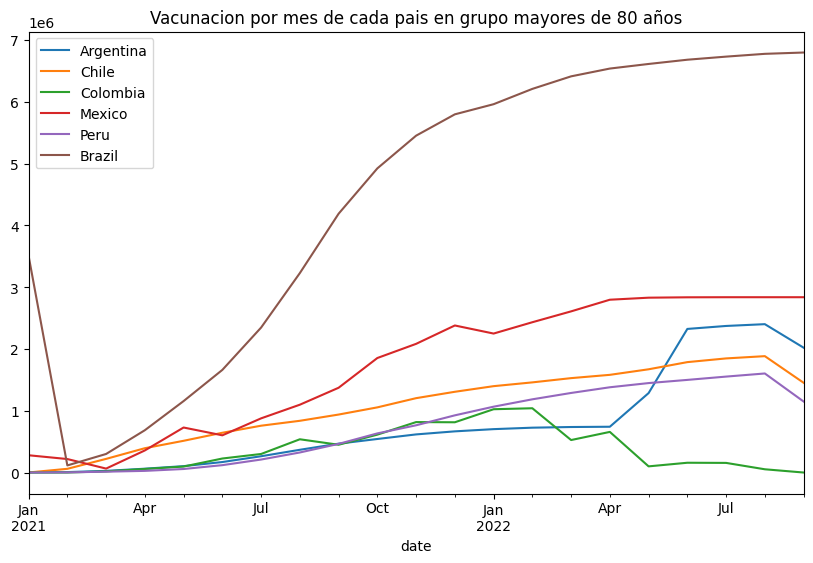

In [68]:
#grupo etario mas vacunado
df_latinoAmerica_paises_fecha['population_age_00_19']= df_latinoAmerica_paises_fecha['population_age_00_09']+df_latinoAmerica_paises_fecha['population_age_10_19']
df_latinoAmerica_paises_fecha['population_age_20_39']= df_latinoAmerica_paises_fecha['population_age_20_29']+df_latinoAmerica_paises_fecha['population_age_30_39']
df_latinoAmerica_paises_fecha['population_age_40_59']= df_latinoAmerica_paises_fecha['population_age_40_49']+df_latinoAmerica_paises_fecha['population_age_50_59']
df_latinoAmerica_paises_fecha['population_age_60_79']= df_latinoAmerica_paises_fecha['population_age_60_69']+df_latinoAmerica_paises_fecha['population_age_70_79']
df_latinoAmerica_paises_fecha['population_age_80_and_older']= df_latinoAmerica_paises_fecha['population_age_80_and_older']

df_latinoAmerica_paises_fecha['population_age_00_19_vacunados']= df_latinoAmerica_paises_fecha['cumulative_vaccine_doses_administered']*df_latinoAmerica_paises_fecha['population_age_00_19']/df_latinoAmerica_paises_fecha['population']
df_latinoAmerica_paises_fecha['population_age_20_39_vacunados']= df_latinoAmerica_paises_fecha['cumulative_vaccine_doses_administered']*df_latinoAmerica_paises_fecha['population_age_20_39']/df_latinoAmerica_paises_fecha['population']
df_latinoAmerica_paises_fecha['population_age_40_59_vacunados']= df_latinoAmerica_paises_fecha['cumulative_vaccine_doses_administered']*df_latinoAmerica_paises_fecha['population_age_40_59']/df_latinoAmerica_paises_fecha['population']
df_latinoAmerica_paises_fecha['population_age_60_79_vacunados']= df_latinoAmerica_paises_fecha['cumulative_vaccine_doses_administered']*df_latinoAmerica_paises_fecha['population_age_60_79']/df_latinoAmerica_paises_fecha['population']
df_latinoAmerica_paises_fecha['population_age_80_and_older_vacunados']= df_latinoAmerica_paises_fecha['cumulative_vaccine_doses_administered']*df_latinoAmerica_paises_fecha['population_age_80_and_older']/df_latinoAmerica_paises_fecha['population']

df_latinoAmerica_paises_fecha['population_age_00_19_vacunados']= df_latinoAmerica_paises_fecha['population_age_00_19_vacunados'].fillna(0)
df_latinoAmerica_paises_fecha['population_age_20_39_vacunados']= df_latinoAmerica_paises_fecha['population_age_20_39_vacunados'].fillna(0)
df_latinoAmerica_paises_fecha['population_age_40_59_vacunados']= df_latinoAmerica_paises_fecha['population_age_40_59_vacunados'].fillna(0)
df_latinoAmerica_paises_fecha['population_age_60_79_vacunados']= df_latinoAmerica_paises_fecha['population_age_60_79_vacunados'].fillna(0)
df_latinoAmerica_paises_fecha['population_age_80_and_older_vacunados']= df_latinoAmerica_paises_fecha['population_age_80_and_older_vacunados'].fillna(0)

df_latinoAmerica_paises_fecha['population_age_00_19_vacunados']= df_latinoAmerica_paises_fecha['population_age_00_19_vacunados'].astype(int)
df_latinoAmerica_paises_fecha['population_age_20_39_vacunados']= df_latinoAmerica_paises_fecha['population_age_20_39_vacunados'].astype(int)
df_latinoAmerica_paises_fecha['population_age_40_59_vacunados']= df_latinoAmerica_paises_fecha['population_age_40_59_vacunados'].astype(int)
df_latinoAmerica_paises_fecha['population_age_60_79_vacunados']= df_latinoAmerica_paises_fecha['population_age_60_79_vacunados'].astype(int)
df_latinoAmerica_paises_fecha['population_age_80_and_older_vacunados']= df_latinoAmerica_paises_fecha['population_age_80_and_older_vacunados'].astype(int)


df_latinoAmerica_paises_fecha['population_age_00_19_vacunados'].sum()
df_latinoAmerica_paises_fecha['population_age_20_39_vacunados'].sum()
df_latinoAmerica_paises_fecha['population_age_40_59_vacunados'].sum()
df_latinoAmerica_paises_fecha['population_age_60_79_vacunados'].sum()
df_latinoAmerica_paises_fecha['population_age_80_and_older_vacunados'].sum()

#Grafica de valores medios de todos los paises dosis de vacunas acumuladas administradas
fig, ax = plt.subplots(figsize=(10, 6))
for pais in mis_paises:
    df_latinoAmerica_paises_fecha[df_latinoAmerica_paises_fecha['country_name']== pais].resample('ME').mean(numeric_only=True)['population_age_00_19_vacunados'].plot()
plt.title('Vacunacion por mes de cada pais en grupo de 0 a 19 años')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend(mis_paises)
plt.show()

fig, ax = plt.subplots(figsize=(10, 6))
for pais in mis_paises:
    df_latinoAmerica_paises_fecha[df_latinoAmerica_paises_fecha['country_name']== pais].resample('ME').mean(numeric_only=True)['population_age_20_39_vacunados'].plot()
plt.title('Vacunacion por mes de cada pais en grupo de 20 a 39 años')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend(mis_paises)
plt.show()

fig, ax = plt.subplots(figsize=(10, 6))
for pais in mis_paises:
    df_latinoAmerica_paises_fecha[df_latinoAmerica_paises_fecha['country_name']== pais].resample('ME').mean(numeric_only=True)['population_age_40_59_vacunados'].plot()
plt.title('Vacunacion por mes de cada pais en grupo de 40 a 59 años')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend(mis_paises)
plt.show()

fig, ax = plt.subplots(figsize=(10, 6))
for pais in mis_paises:
    df_latinoAmerica_paises_fecha[df_latinoAmerica_paises_fecha['country_name']== pais].resample('ME').mean(numeric_only=True)['population_age_60_79_vacunados'].plot()
plt.title('Vacunacion por mes de cada pais en grupo de 60 a 79 años')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend(mis_paises)
plt.show()

fig, ax = plt.subplots(figsize=(10, 6))
for pais in mis_paises:
    df_latinoAmerica_paises_fecha[df_latinoAmerica_paises_fecha['country_name']== pais].resample('ME').mean(numeric_only=True)['population_age_80_and_older_vacunados'].plot()
plt.title('Vacunacion por mes de cada pais en grupo mayores de 80 años')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.legend(mis_paises)
plt.show()

Este código realiza un análisis de los datos de vacunación de COVID-19 por grupos de edad en varios países de América Latina.


*Creación de nuevas columnas de grupos de edad:* El código primero crea nuevas columnas en el DataFrame df_latinoAmerica_paises_fecha para representar diferentes grupos de edad (0-19, 20-39, 40-59, 60-79, 80 y más). Estas columnas se llenan sumando las poblaciones de las edades correspondientes.

*Cálculo de la población vacunada por grupo de edad:* Luego, el código crea nuevas columnas para cada grupo de edad que representan la cantidad de personas vacunadas en ese grupo de edad. Esto se calcula multiplicando la cantidad de dosis de vacunas administradas por la proporción de la población en ese grupo de edad.

*Limpieza de los datos:* El código luego reemplaza cualquier valor NaN en las nuevas columnas con cero y convierte los valores a enteros.

*Creación de gráficos de líneas:* Finalmente, el código crea un gráfico de líneas para cada grupo de edad, mostrando la cantidad de personas vacunadas en ese grupo de edad para cada país a lo largo del tiempo.

En resumen, este código te permite explorar y visualizar la distribución de las dosis de vacunas administradas entre diferentes grupos de edad en varios países de América Latina. 

**Mortalidad**

*Vamos a revisar la mortalidad por genero para identificar la poblacion mas vulnerable en cada pais* 

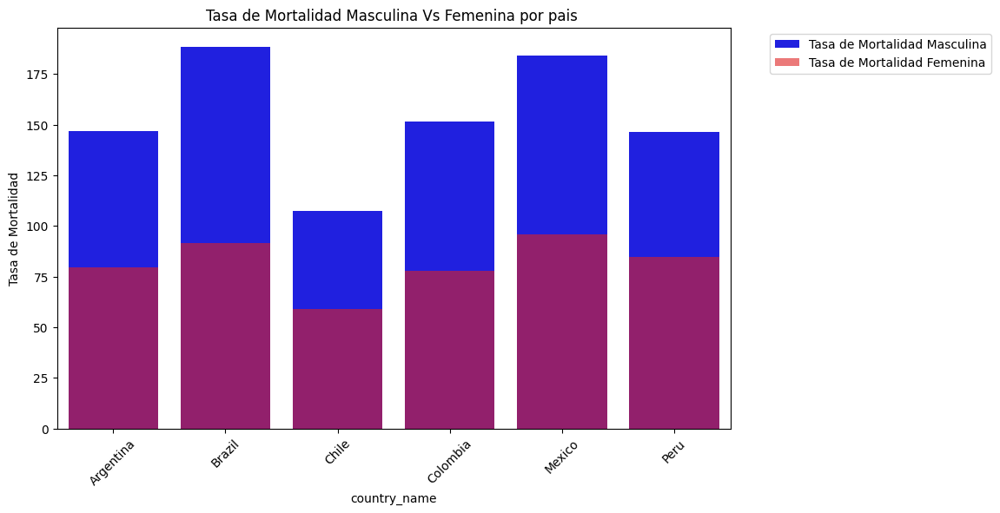

In [69]:
#Grafica de mortalidad por genero

plt.figure(figsize=(10, 6))
sns.barplot(data=df_latinoAmerica_paises_fecha, x='country_name', y='adult_male_mortality_rate', color='blue', label='Tasa de Mortalidad Masculina')
sns.barplot(data=df_latinoAmerica_paises_fecha, x='country_name', y='adult_female_mortality_rate', color='red', alpha=0.6, label='Tasa de Mortalidad Femenina')
plt.xticks(rotation=45)
plt.ylabel('Tasa de Mortalidad')
plt.title('Tasa de Mortalidad Masculina Vs Femenina por pais ')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

El gráfico de barras compara la tasa de mortalidad adulta masculina y femenina en varios países. 

**Países Incluidos:** Argentina, Brasil, Chile, Colombia, México y Perú.

**Tasas de Mortalidad:** Las barras azules representan la tasa de mortalidad masculina y las rojas la tasa de mortalidad femenina.

**Comparación:** En todos los países mostrados, las barras azules son más altas que las rojas, lo que indica tasas de mortalidad masculina más altas en comparación con las femeninas.

**Transparencia:** Las barras rojas tienen una transparencia del 60% para permitir la comparación visual con las barras azules.

In [70]:


# Crear una figura vacía
fig = go.Figure()

# Agregar las barras para la tasa de mortalidad masculina
fig.add_trace(go.Bar(
    x=df_latinoAmerica_paises_fecha['country_name'],
    y=df_latinoAmerica_paises_fecha['adult_male_mortality_rate'],
    name='Tasa de Mortalidad Masculina',
    marker_color='blue'
))

# Agregar las barras para la tasa de mortalidad femenina
fig.add_trace(go.Bar(
    x=df_latinoAmerica_paises_fecha['country_name'],
    y=df_latinoAmerica_paises_fecha['adult_female_mortality_rate'],
    name='Tasa de Mortalidad Femenina',
    marker_color='red'
))

# Ajustar el diseño del gráfico
fig.update_layout(
    barmode='group', # las barras se agrupan en lugar de apilarse
    title='Tasa de Mortalidad Masculina Vs Femenina por pais',
    xaxis_title='País',
    yaxis_title='Tasa de Mortalidad'
)

# Mostrar el gráfico
fig.show()


**Salud**

*Indicadores demograficos en salud*


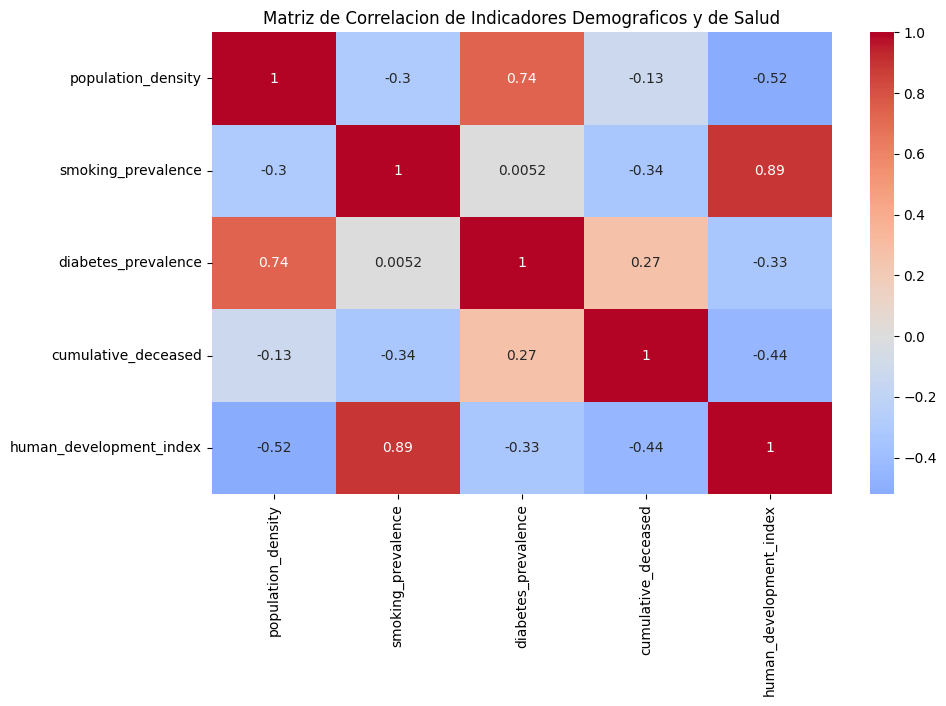

In [71]:
#seleccionamos las columnas para el analisis de correlacion
columnas_salud = ['population_density', 'smoking_prevalence', 'diabetes_prevalence', 'cumulative_deceased', 'human_development_index']
matriz_correlacion_salud = df_latinoAmerica_paises_fecha[columnas_salud].corr()
plt.figure(figsize=(10, 6))
sns.heatmap(matriz_correlacion_salud, annot=True, cmap='coolwarm', center=0)
plt.title('Matriz de Correlacion de Indicadores Demograficos y de Salud')
plt.show()

La matriz de correlación representada como un mapa de calor, que visualiza la relación entre diferentes indicadores demográficos y de salud.

**Variables Incluidas:** Densidad de población, prevalencia de fumadores, prevalencia de diabetes, fallecidos acumulados e índice de desarrollo humano.

**Valores de Correlación:** Los coeficientes de correlación varían de -1 a 1, donde 1 indica una correlación positiva perfecta, -1 una correlación negativa perfecta y 0 ninguna correlación.

**Coloración:** Los colores varían de azul (correlación negativa) a rojo (correlación positiva), con blanco en el centro indicando una correlación de 0.

**Anotaciones:** Cada celda tiene una anotación numérica que indica el valor exacto de la correlación entre las variables correspondientes.

Por ejemplo, hay una correlación positiva fuerte de 0.89 entre el índice de desarrollo humano y la prevalencia de diabetes, mientras que hay una correlación negativa fuerte de -0.52 entre el índice de desarrollo humano y la densidad de población. Este tipo de visualización es útil para identificar posibles relaciones entre diferentes factores de salud y demográficos

*Diabetes y tasa de mortalidad por COVID-19*

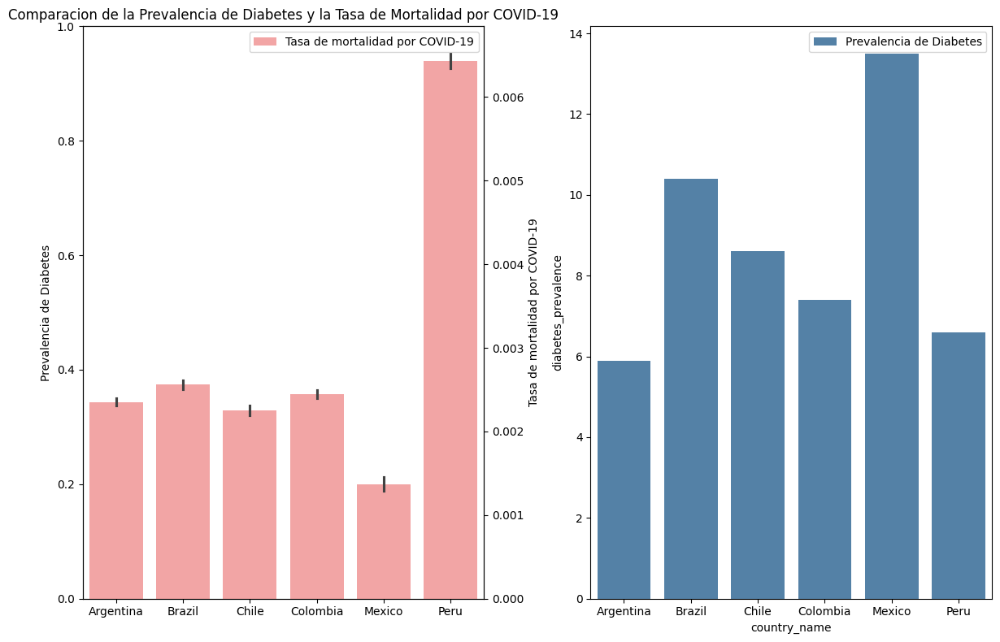

In [73]:
fig, (ax, ax2) = plt.subplots(1, 2, figsize=(12, 8))
sns.barplot(data=df_latinoAmerica_paises_fecha, x=df_latinoAmerica_paises_fecha['country_name'], y=df_latinoAmerica_paises_fecha['diabetes_prevalence'], color='steelblue', label='Prevalencia de Diabetes')
ax2 = ax.twinx()
sns.barplot(data=df_latinoAmerica_paises_fecha, x=df_latinoAmerica_paises_fecha['country_name'], y=df_latinoAmerica_paises_fecha['cumulative_deceased'] / df_latinoAmerica_paises_fecha['population'] ,
             color='red', label='Tasa de mortalidad por COVID-19', ax=ax2, alpha=0.4)
plt.xticks(rotation=90)
ax.set_ylabel('Prevalencia de Diabetes')
ax2.set_ylabel('Tasa de mortalidad por COVID-19')
plt.title('Comparacion de la Prevalencia de Diabetes y la Tasa de Mortalidad por COVID-19')
plt.tight_layout()
plt.show()

El gráfico de barras compara la prevalencia de diabetes y la tasa de mortalidad por COVID-19 en varios países de América Latina. 

**Aquí hay algunos puntos clave que podemos observar:**

*Eje Izquierdo:* Representa la prevalencia de diabetes, con barras en color azul acero.

*Eje Derecho:* Muestra la tasa de mortalidad por COVID-19, con barras en color rojo y una transparencia del 40%.

*Comparación:* Las barras permiten comparar visualmente dos métricas de salud importantes lado a lado para cada país.

Este tipo de visualización es útil para analizar posibles correlaciones o impactos entre estas dos cuestiones de salud dentro de estas naciones

Fumadores y tasa de mortalidad por COVID-19

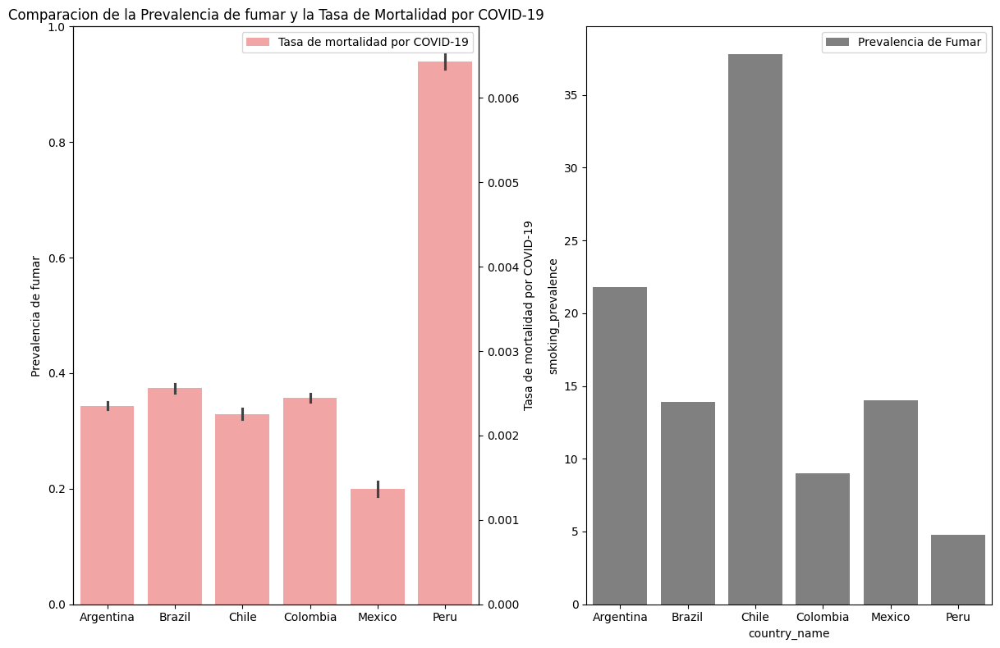

In [78]:
fig, (ax, ax2) = plt.subplots(1, 2, figsize=(12, 8))
sns.barplot(data=df_latinoAmerica_paises_fecha, x='country_name', y='smoking_prevalence',color='Grey', label='Prevalencia de Fumar' )
ax2 = ax.twinx()
sns.barplot(data=df_latinoAmerica_paises_fecha, x=df_latinoAmerica_paises_fecha['country_name'], y=df_latinoAmerica_paises_fecha['cumulative_deceased'] / df_latinoAmerica_paises_fecha['population'] ,
             color='red', label='Tasa de mortalidad por COVID-19', ax=ax2, alpha=0.4)
plt.xticks(rotation=90)
ax.set_ylabel('Prevalencia de fumar')
ax2.set_ylabel('Tasa de mortalidad por COVID-19')
plt.title('Comparacion de la Prevalencia de fumar y la Tasa de Mortalidad por COVID-19')
plt.tight_layout()
plt.show()

El gráfico de barras con dos ejes y que compara la prevalencia de fumar y la tasa de mortalidad por COVID-19 en varios países de América Latina. 

*Eje Izquierdo:* Representa la prevalencia de fumar, con barras en color gris.

*Eje Derecho:* Muestra la tasa de mortalidad por COVID-19, con barras en color rojo y una transparencia del 40%.

*Países Incluidos:* Argentina, Brasil, Chile, Colombia, México y Perú.

*Comparación:* Las barras permiten comparar visualmente dos métricas de salud importantes lado a lado para cada país.

## Avance 3 ##

*EDA con Numpy y Pandas*

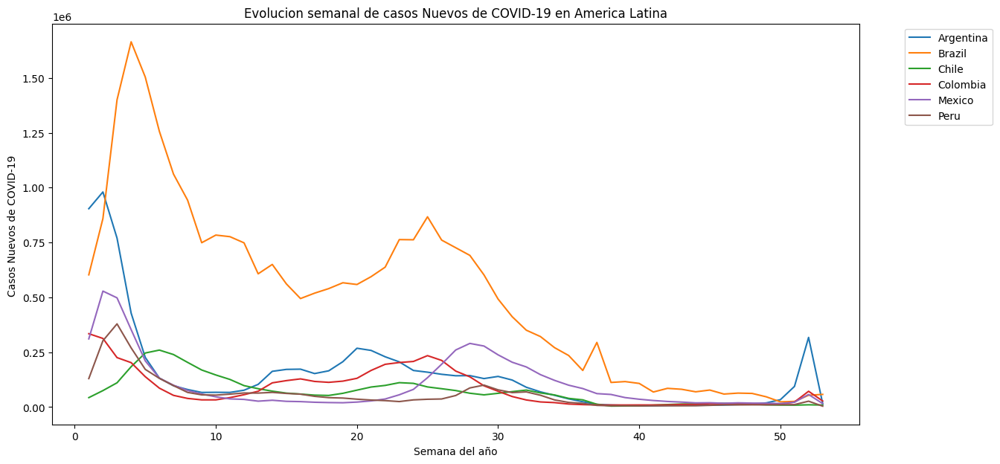

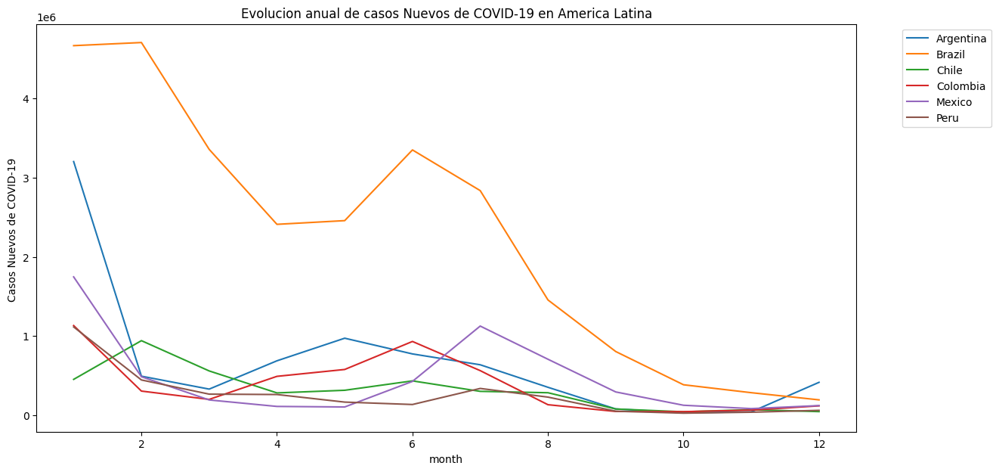

In [79]:
#vamos a analisar como evolucionan los casos de COVID-19 en America Latina a lo largo del tiempo por semana
df_latinoAmerica_paises_fecha['week'] = df_latinoAmerica_paises_fecha.index.isocalendar().week
df_latinoAmerica_paises_fecha['year'] = df_latinoAmerica_paises_fecha.index.isocalendar().year
casos_semana = df_latinoAmerica_paises_fecha.groupby(['country_name', 'week'])['new_confirmed'].sum().reset_index()
plt.figure(figsize=(14, 7))
for pais in casos_semana['country_name'].unique():
    casos_semana_pais = casos_semana[casos_semana['country_name']== pais]
    plt.plot(casos_semana_pais['week'], casos_semana_pais['new_confirmed'], label= pais)

plt.xlabel('Semana del año')
plt.ylabel('Casos Nuevos de COVID-19 ')
plt.title('Evolucion semanal de casos Nuevos de COVID-19 en America Latina')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

#ahora por año
df_latinoAmerica_paises_fecha['month'] = df_latinoAmerica_paises_fecha.index.month
casos_año = df_latinoAmerica_paises_fecha.groupby(['country_name', 'month'])['new_confirmed'].sum().reset_index()
plt.figure(figsize=(14, 7))
for pais in casos_año['country_name'].unique():
    casos_año_pais = casos_año[casos_año['country_name']== pais]
    plt.plot(casos_año_pais['month'], casos_año_pais['new_confirmed'], label= pais)

plt.xlabel('month')
plt.ylabel('Casos Nuevos de COVID-19 ')
plt.title('Evolucion anual de casos Nuevos de COVID-19 en America Latina')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

Este código realiza un análisis de los datos de COVID-19 en varios países de América Latina, mostrando cómo evolucionan los casos nuevos a lo largo del tiempo tanto en una escala semanal como anual. 

**Análisis Semanal:** Primero, el código agrega dos nuevas columnas al DataFrame df_latinoAmerica_paises_fecha para representar la semana y el año de cada fecha. Luego, agrupa los datos por país y semana, y suma los casos nuevos de COVID-19 para cada grupo. Finalmente, crea un gráfico de líneas que muestra la evolución semanal de los casos nuevos para cada país.

**Análisis Anual:** Luego, el código agrega una nueva columna al DataFrame para representar el mes de cada fecha. Agrupa los datos por país y mes, y suma los casos nuevos de COVID-19 para cada grupo. Crea otro gráfico de líneas que muestra la evolución anual de los casos nuevos para cada país.

*Progreso de la vacunacion*

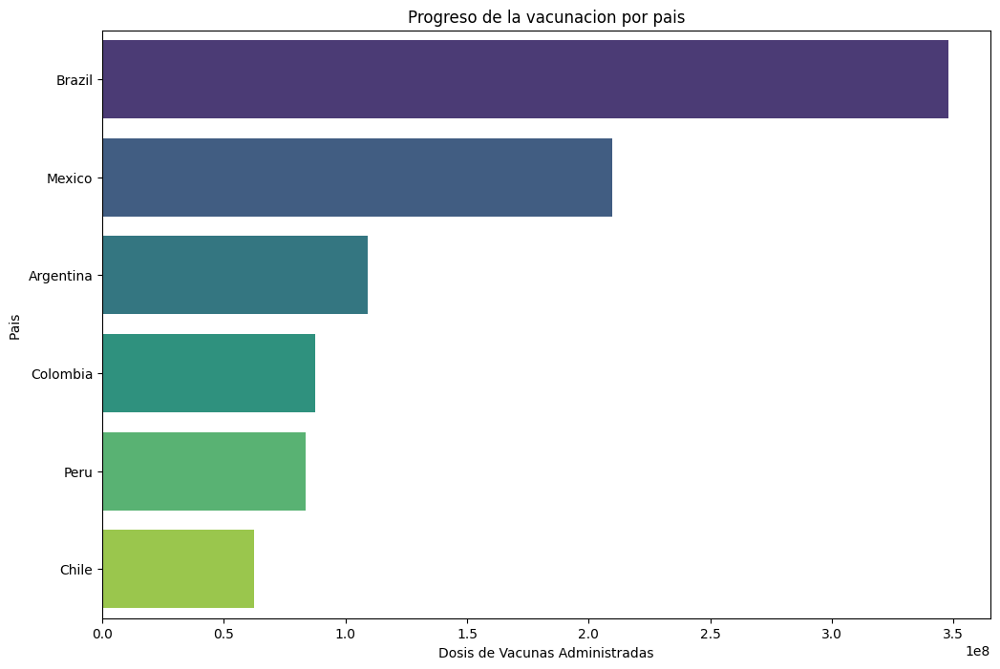

In [87]:
datos_vacunacion = df_latinoAmerica_paises_fecha.groupby('country_name')['cumulative_vaccine_doses_administered'].max().sort_values(ascending=False)
plt.figure(figsize=(12, 8))
sns.barplot(x=datos_vacunacion.values, y=datos_vacunacion.index, hue=datos_vacunacion.index, palette='viridis')
# Agregar etiquetas

plt.xlabel('Dosis de Vacunas Administradas')
plt.ylabel('Pais ')
plt.title('Progreso de la vacunacion por pais')
plt.show()


El gráfico de barras horizontales que has creado muestra el progreso de la vacunación por país en América Latina. 


**Distribución de Vacunas:** Las barras representan la cantidad total de dosis de vacunas administradas en cada país, con Brasil liderando, seguido por México y Argentina.

**Comparación entre Países**: Permite una comparación visual clara del esfuerzo de vacunación entre los países listados, como Colombia, Perú y Chile.

**Escala de Color:** La paleta de colores ‘viridis’ se utiliza para diferenciar los países, lo que facilita la identificación visual de cada uno.

**Datos Máximos:** Las longitudes de las barras correlacionan con el número máximo acumulado de dosis de vacunas administradas, lo que indica el progreso de cada país en su campaña de vacunación.

Este gráfico es útil para entender rápidamente cuáles países están avanzando más en sus esfuerzos de vacunación contra el COVID-19.


**Nota:** podemos observar es que el pais con mas dosis administradas es brasil, tambien algo importante a tener en cuenta es que en cuanto al covid muchas personas se negaron a recibir las vacunas otras lo hicieron por obligacion ya sea para laborar o por poder salir y cosas asi entonces eso tambien provoca como tanto desigualdad en los datos

**Temperatura**

*Veamos como se comporta la temperatura en los paises seleccionados*

<function matplotlib.pyplot.show(close=None, block=None)>

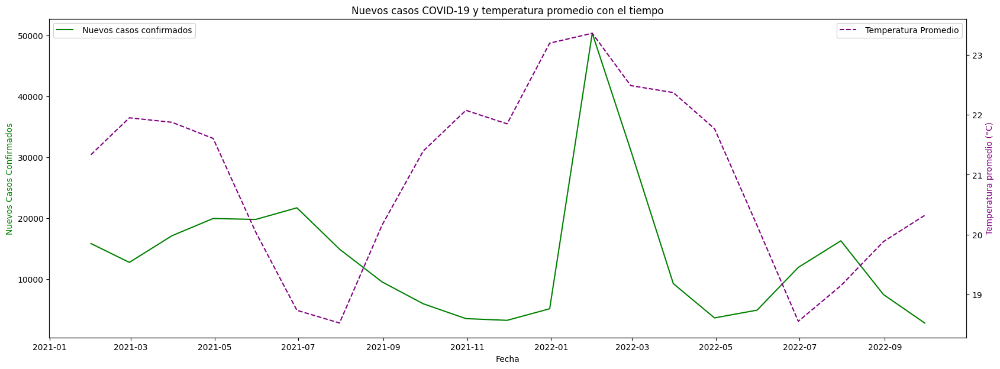

In [91]:
#relacion entre las temperaturas promedio y los nuevos casos confirmados 
plt.figure(figsize=(20, 7))
ax1 = plt.gca()
ax2 = ax1.twinx()
ax1.plot(df_latinoAmerica_paises_fecha.resample('ME').mean(numeric_only=True).index, df_latinoAmerica_paises_fecha.resample('ME').mean(numeric_only=True)['new_confirmed'], color='green', label=' Nuevos casos confirmados' )
ax2.plot(df_latinoAmerica_paises_fecha.resample('ME').mean(numeric_only=True).index, df_latinoAmerica_paises_fecha.resample('ME').mean(numeric_only=True)['average_temperature_celsius'], color='purple', label=' Temperatura Promedio', linestyle='--' )

ax1.set_xlabel('Fecha')
ax1.set_ylabel('Nuevos Casos Confirmados', color='green')
ax2.set_ylabel('Temperatura promedio (°C)', color='purple')
plt.title('Nuevos casos COVID-19 y temperatura promedio con el tiempo')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.show


El gráfico creado muestra la relación entre las temperaturas promedio y los nuevos casos confirmados de COVID-19 a lo largo del tiempo. 

*Fluctuaciones Temporales:* Ambas líneas muestran fluctuaciones a lo largo del tiempo, lo que podría indicar patrones estacionales o tendencias en los datos.

*Picos y Valles:* Los picos y valles en las líneas pueden representar brotes de casos o cambios en las temperaturas que podrían estar correlacionados.

*Comparación Visual:* La representación de dos variables en el mismo gráfico facilita la comparación visual para buscar posibles correlaciones.

*Interpretación Cautelosa:* Es importante interpretar con cautela cualquier correlación visual, ya que se necesitaría un análisis estadístico más profundo para establecer una relación causal.

**Nota:** el grafico nos muestra que La temperatura promedio ha ido aumentando y los casos confirmados han ido disminuyendo sin embargo hubo un pico antes del mes de marzo el cual disminuyo rapidamnete y pudo deberse a la dosis de vacunas administradas o que hay maas personas vacunadas

**Densidad de cada pais**

<function matplotlib.pyplot.show(close=None, block=None)>

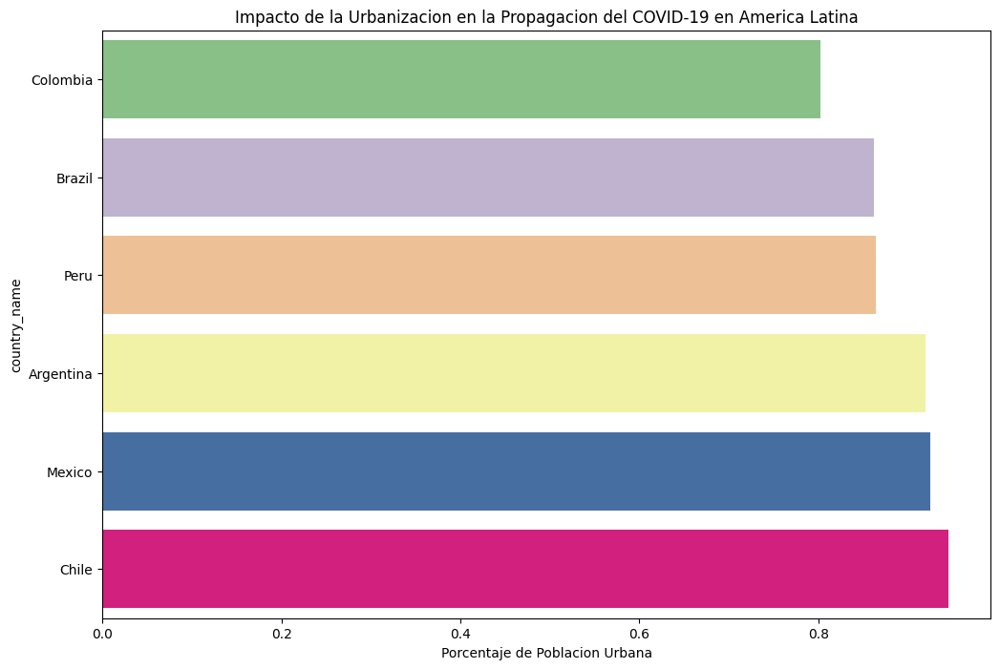

In [90]:
df_latinoAmerica_paises_fecha['urban_population_percentage'] = df_latinoAmerica_paises_fecha['population_urban']/ df_latinoAmerica_paises_fecha['population']
casos_urbanos = df_latinoAmerica_paises_fecha.groupby('country_name').last().sort_values(by='urban_population_percentage')

plt.figure(figsize=(12, 8))
sns.barplot(x=casos_urbanos['urban_population_percentage'], y=casos_urbanos.index, hue=casos_urbanos.index, palette='Accent')
plt.xlabel('Porcentaje de Poblacion Urbana')
plt.title('Impacto de la Urbanizacion en la Propagacion del COVID-19 en America Latina')
plt.show

In [92]:


# Asegúrate de que 'casos_urbanos' es un DataFrame con las columnas 'country_name' y 'urban_population_percentage'
fig = px.bar(casos_urbanos, x='urban_population_percentage', y=casos_urbanos.index, color=casos_urbanos.index,
             labels={'index': 'País', 'urban_population_percentage': 'Porcentaje de Poblacion Urbana'},
             title='Impacto de la Urbanizacion en la Propagacion del COVID-19 en America Latina')

# Añade tooltips
fig.update_traces(hoverinfo='x+name')

# Muestra el gráfico
fig.show()


El gráfico de barras horizontales muestra el porcentaje de población urbana por país en América Latina y su posible relación con la propagación del COVID-19. 

*Porcentaje Urbano:* Cada barra representa el porcentaje de población urbana de un país, lo que indica la densidad urbana.

*Orden de Países:* Los países están ordenados por su porcentaje de población urbana, lo que podría sugerir una comparación del impacto de la urbanización en la propagación del virus.

*Paleta de Colores:* La paleta ‘Accent’ ayuda a diferenciar visualmente cada país.

*Interpretación de Datos:* Aunque el gráfico muestra una comparación visual, se necesitaría un análisis más profundo para entender la correlación entre urbanización y casos de COVID-19.

**Mortalidad**

<function matplotlib.pyplot.show(close=None, block=None)>

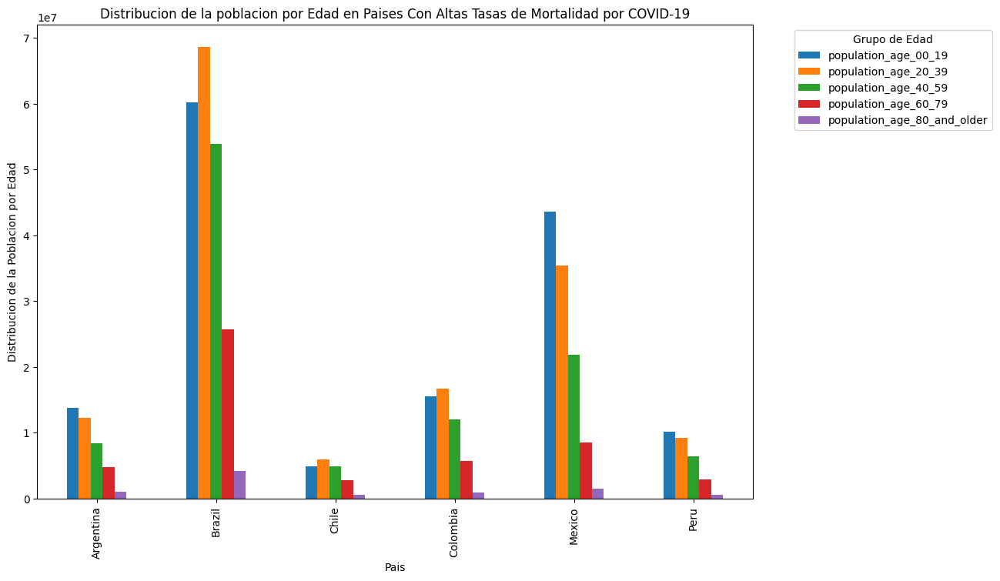

In [93]:
paises_alta_mortalidad = df_latinoAmerica_paises_fecha.groupby('country_name')['cumulative_deceased'].max().sort_values(ascending=False).index#.head(5).index #podemos llamar parte de nuestros registros en caso que tengamos muchos para poder ver mejor nuetro grafico
grupo_edad = ['population_age_00_19','population_age_20_39','population_age_40_59','population_age_60_79','population_age_80_and_older'] 
edad_distribucion = df_latinoAmerica_paises_fecha[df_latinoAmerica_paises_fecha['country_name'].isin(paises_alta_mortalidad)].groupby('country_name')[grupo_edad].mean()

edad_distribucion.plot(kind='bar', stacked=False, figsize=(12, 8))
plt.xlabel('Pais')
plt.ylabel('Distribucion de la Poblacion por Edad')
plt.title('Distribucion de la poblacion por Edad en Paises Con Altas Tasas de Mortalidad por COVID-19')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Grupo de Edad')
plt.show

El gráfico de barras muestra la distribución de la población por edad en países con altas tasas de mortalidad por COVID-19. 

**Grupos de Edad:** Cada barra está dividida en segmentos que representan diferentes grupos de edad, lo que permite visualizar la estructura demográfica de cada país.

**Comparación entre Países:** Los países están ordenados por su tasa de mortalidad por COVID-19, lo que podría sugerir una comparación del impacto de la estructura de edad en la mortalidad por COVID-19.

**Interpretación de Datos:** Aunque el gráfico muestra una comparación visual, se necesitaría un análisis más profundo para entender la correlación entre la estructura de edad y la mortalidad por COVID-19.

Este gráfico puede ser un punto de partida para investigaciones adicionales sobre cómo la estructura de edad afecta la mortalidad por COVID-19 en diferentes países.
Podemos ver la desigualdad de poblacion por grupos de edades en los paises seleccionados. 


**Estrategia de vacunacion**


*Vamos a ver que tan buenas o mas fueron las estrategias de vacunacion para mitigar la mortalidad y los casos confirmados*

<function matplotlib.pyplot.show(close=None, block=None)>

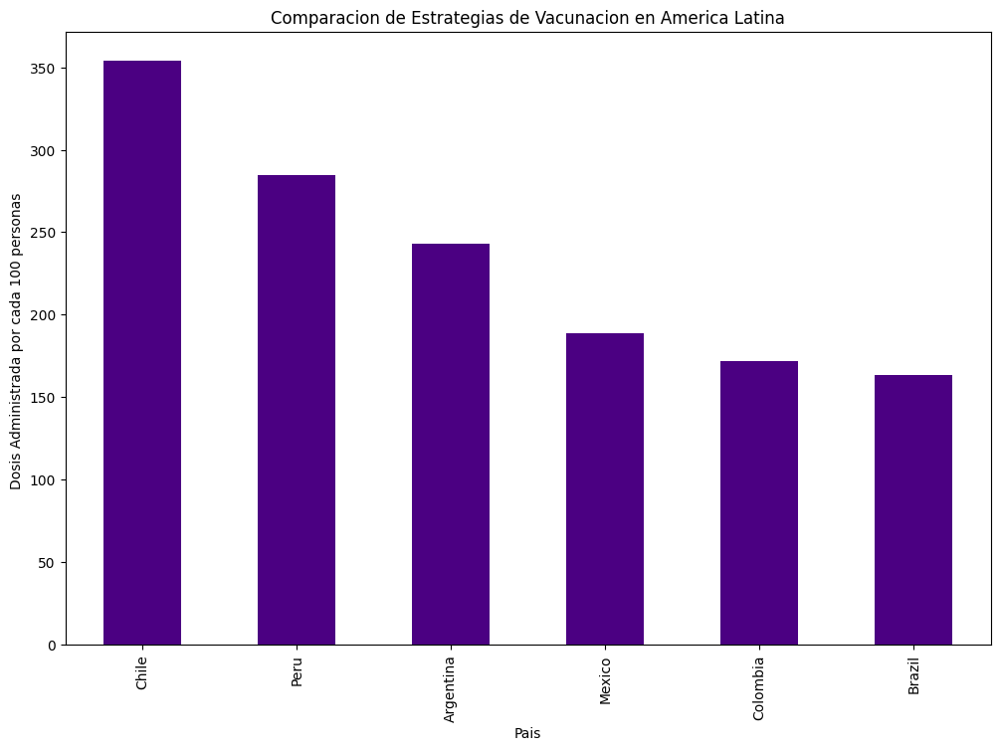

In [95]:
estrategia_vacunacion = df_latinoAmerica_paises_fecha.groupby('country_name')['cumulative_vaccine_doses_administered'].max() / df_latinoAmerica_paises_fecha.groupby('country_name')['population'].max()*100
estrategia_vacunacion.sort_values(ascending=False).plot(kind='bar', figsize=(12, 8), color='indigo')

plt.xlabel('Pais')
plt.ylabel('Dosis Administrada por cada 100 personas ')
plt.title('Comparacion de Estrategias de Vacunacion en America Latina')
plt.show

In [97]:


fig = px.bar(x=estrategia_vacunacion.index, y=estrategia_vacunacion.values,
             labels={'y':'Dosis Administrada por cada 100 personas', 'x':'Pais'},
             title='Comparacion de Estrategias de Vacunacion en America Latina', color=estrategia_vacunacion.index) # Añade color a cada país)

fig.show()


El gráfico de barras muestra la comparación de estrategias de vacunación en América Latina, representando la cantidad de dosis administradas por cada 100 personas en diferentes países. 

**Cobertura de Vacunación:** La altura de las barras indica la proporción de la población que ha recibido vacunas, lo cual es un indicador importante de la cobertura de vacunación.

**Comparación entre Países:** Permite comparar rápidamente qué países han administrado más dosis relativas a su población.

**Estrategias Efectivas:** Los países con barras más altas pueden haber implementado estrategias de vacunación más efectivas o haber tenido mejor acceso a las vacunas.

Podemos ver el buen resultado en Chile y una clara falla en Colombia y Brasil
esto nos puede ayudar para ver que paise necesitan mas ayuda 

**Porcentaje de Diabetes por paises**

In [ ]:
#df_latinoAmerica_paises_fecha.groupby('country_name')['cumulative_deceased'].max().nlargest(5).index

In [ ]:
#df_latinoAmerica_paises_fecha.groupby('country_name')['cumulative_deceased'].max().nsmallest(5).index

*Estos codigos nos sirven para traer los valos mas altos o los valores mas bajos en este caso no los vamos a utilizar ya que nuestro estudio es una lista de paises muy reducida, tambien podemos ver en el siguento codigo como podriamos usar la funcion .union para unir loos mas grandes y los mas bajos solo que los tenemos comentados por lo que dijimos anteriormente*

<function matplotlib.pyplot.show(close=None, block=None)>

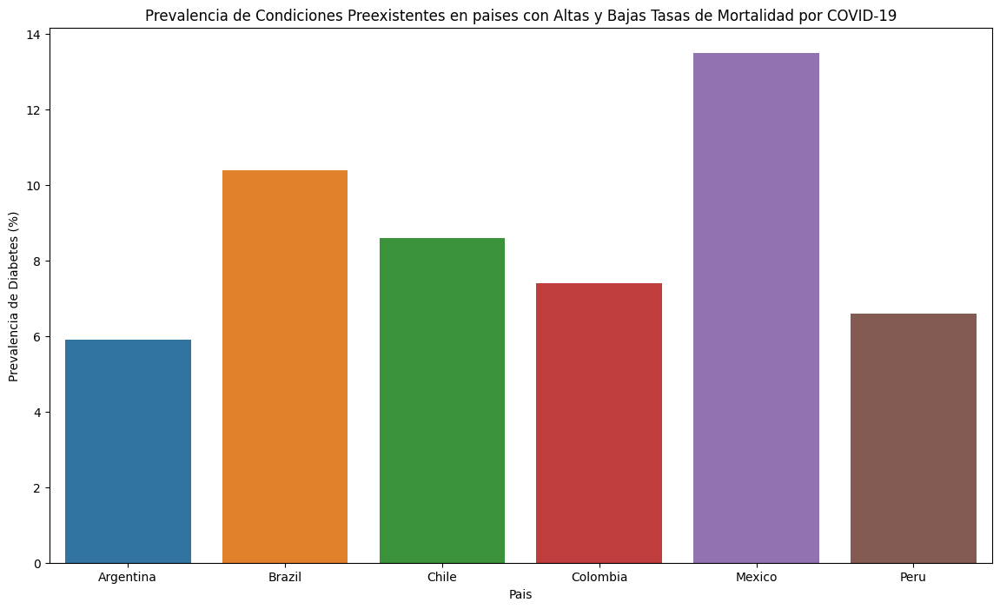

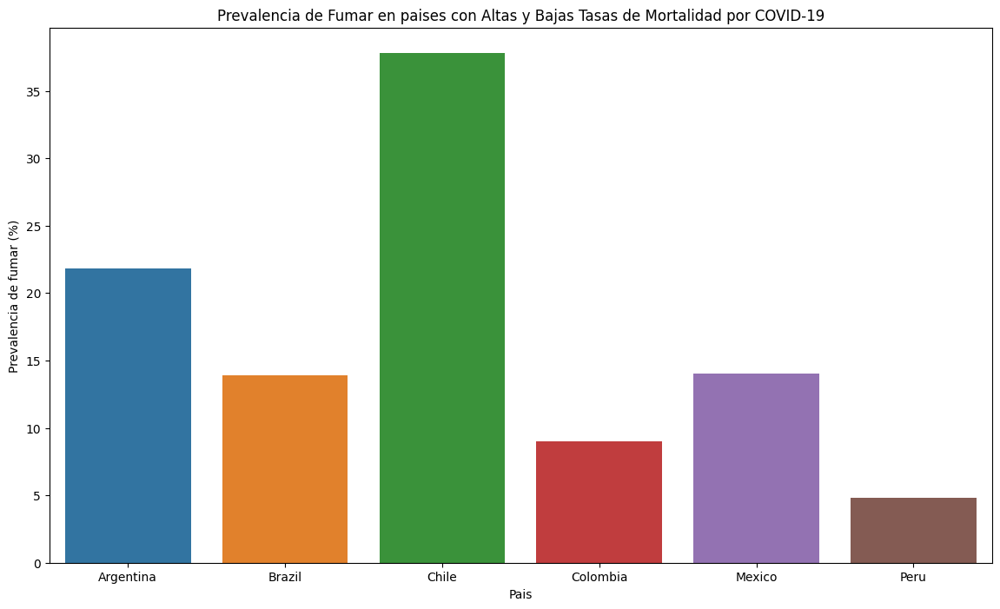

In [98]:
#Prevalencia de Diabetes
altos_paises = df_latinoAmerica_paises_fecha.groupby('country_name')['cumulative_deceased'].max().nlargest(5).index
bajos_paises= df_latinoAmerica_paises_fecha.groupby('country_name')['cumulative_deceased'].max().nsmallest(5).index
condiciones = df_latinoAmerica_paises_fecha[df_latinoAmerica_paises_fecha['country_name'].isin(altos_paises.union(bajos_paises))]


plt.figure(figsize=(14, 8))
sns.barplot(data=condiciones, x='country_name', y='diabetes_prevalence', hue='country_name')
plt.xlabel('Pais')
plt.ylabel('Prevalencia de Diabetes (%)')
plt.title('Prevalencia de Condiciones Preexistentes en paises con Altas y Bajas Tasas de Mortalidad por COVID-19')
plt.show


#prevalencia de fumar
plt.figure(figsize=(14, 8))
sns.barplot(data=condiciones, x='country_name', y='smoking_prevalence', hue='country_name')
plt.xlabel('Pais')
plt.ylabel('Prevalencia de fumar (%)')
plt.title('Prevalencia de Fumar en paises con Altas y Bajas Tasas de Mortalidad por COVID-19')
plt.show


In [99]:


# Gráfico para la prevalencia de diabetes
fig1 = px.bar(condiciones, x='country_name', y='diabetes_prevalence', color='country_name',
             labels={'country_name': 'País', 'diabetes_prevalence': 'Prevalencia de Diabetes (%)'},
             title='Prevalencia de Condiciones Preexistentes en paises con Altas y Bajas Tasas de Mortalidad por COVID-19')

# Añade tooltips
fig1.update_traces(hoverinfo='x+y+name')

# Muestra el gráfico
fig1.show()

# Gráfico para la prevalencia de fumar
fig2 = px.bar(condiciones, x='country_name', y='smoking_prevalence', color='country_name',
             labels={'country_name': 'País', 'smoking_prevalence': 'Prevalencia de fumar (%)'},
             title='Prevalencia de Fumar en paises con Altas y Bajas Tasas de Mortalidad por COVID-19')

# Añade tooltips
fig2.update_traces(hoverinfo='x+y+name')

# Muestra el gráfico
fig2.show()


El gráfico proporciona una comparación visual de la prevalencia de diabetes y el hábito de fumar en países de América Latina con altas y bajas tasas de mortalidad por COVID-19.

*Prevalencia de Diabetes:* Muestra el porcentaje de la población con diabetes en cada país.

*Prevalencia de Fumar:* Indica el porcentaje de la población que fuma.

*Comparación de Países:* Permite comparar estas condiciones preexistentes entre países con diferentes tasas de mortalidad.

*Impacto en la Salud Pública:* Ayuda a entender cómo estas condiciones pueden influir en la gravedad de la pandemia.

Tasa de letalidad

<function matplotlib.pyplot.show(close=None, block=None)>

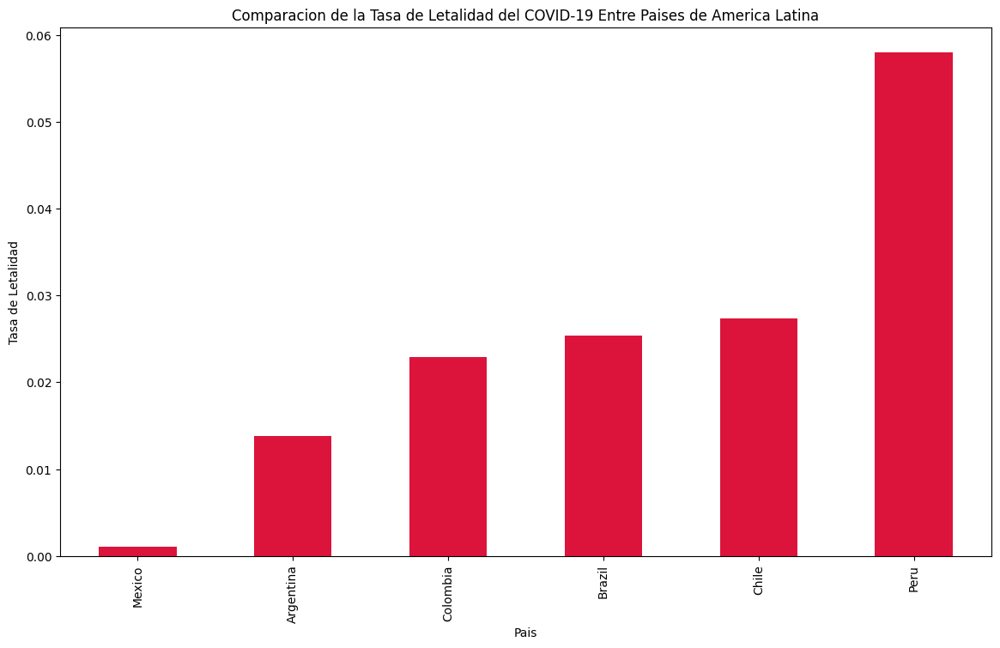

In [101]:
#calculamos la tasa de letalidad por pais 
df_latinoAmerica_paises_fecha['case_fatality_rate'] = df_latinoAmerica_paises_fecha['cumulative_deceased'] / df_latinoAmerica_paises_fecha['cumulative_confirmed']
tasa_letalidad = df_latinoAmerica_paises_fecha.groupby('country_name')['case_fatality_rate'].last().sort_values()

#creamos el grafico
plt.figure(figsize=(14, 8))
barras = tasa_letalidad.plot(kind='bar', color='crimson')
plt.xlabel('Pais')
plt.ylabel('Tasa de Letalidad')
plt.title('Comparacion de la Tasa de Letalidad del COVID-19 Entre Paises de America Latina')
plt.show


En este gráfico, estás visualizando la Tasa de Letalidad del COVID-19 para diferentes países de América Latina. 

**Aquí hay algunas observaciones que puedes hacer:**

*Comparación entre países:* El gráfico de barras permite comparar la tasa de letalidad entre los diferentes países. Puedes identificar qué países tienen las tasas de letalidad más altas y más bajas.

*Magnitud de la letalidad:* La longitud de las barras representa la magnitud de la tasa de letalidad. Una barra más larga indica una tasa de letalidad más alta.

*Orden de los países:* Los países están ordenados en función de su tasa de letalidad. Esto facilita la identificación de patrones y tendencias.

*Color de las barras:* Todas las barras son de color carmesí, lo que ayuda a mantener el enfoque en la longitud de las barras en lugar de en sus colores.

Recuerda, la tasa de letalidad se calcula como el número de muertes confirmadas dividido por el número de casos confirmados. 

Por lo tanto, este gráfico te da una idea de qué porcentaje de personas infectadas con COVID-19 han fallecido en cada país. Sin embargo, ten en cuenta que la tasa de letalidad puede estar influenciada por muchos factores, incluyendo la cantidad de pruebas realizadas, la calidad de la atención médica, y las características demográficas de la población, entre otros.

Evolucion de la Vacunacion


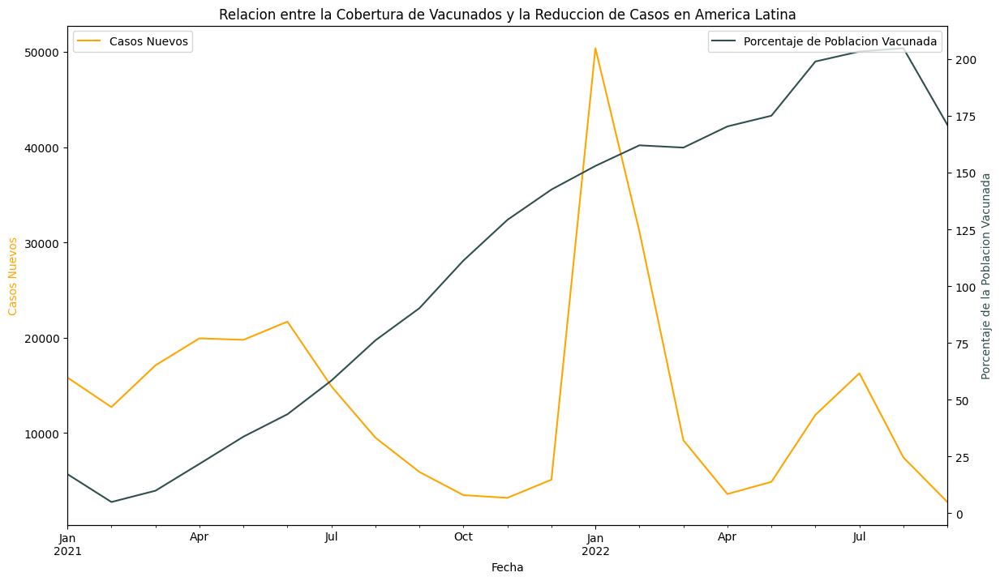

In [114]:
#como evoluciona la vacunacion en America Latina y la  reduccion de casos de COVID-19
plt.figure(figsize=(14, 8))
ax1 = plt.gca()
ax2 = ax1.twinx()

#porcentaje de vacunacion 
df_latinoAmerica_paises_fecha['percentage_vaccinated'] = (df_latinoAmerica_paises_fecha['cumulative_vaccine_doses_administered'] / df_latinoAmerica_paises_fecha['population']) * 100
df_latinoAmerica_paises_fecha.resample('ME').mean(numeric_only=True)['new_confirmed'].plot(ax=ax1, color='orange', label='Casos Nuevos')
df_latinoAmerica_paises_fecha.resample('ME').mean(numeric_only=True)['percentage_vaccinated'].plot(ax=ax2, color='darkslategrey', label='Porcentaje de Poblacion Vacunada')

ax1.set_xlabel('Fecha')
ax1.set_ylabel('Casos Nuevos', color='orange')
ax2.set_ylabel('Porcentaje de la Poblacion Vacunada', color='darkslategrey')
ax1.set_title('Relacion entre la Cobertura de Vacunados y la Reduccion de Casos en America Latina')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.show()


Este gráfico muestra la evolución de la vacunación en América Latina y la reducción de casos de COVID-19. 

*Tendencias a lo largo del tiempo:* El gráfico muestra cómo han cambiado tanto la tasa de nuevos casos de COVID-19 como el porcentaje de la población vacunada a lo largo del tiempo. Esto nos puede ayudarte a identificar si hay una correlación entre la cobertura de la vacunación y la reducción de los casos.

*Comparación de las métricas:* Al tener dos ejes y, puedes comparar las dos métricas (nuevos casos y porcentaje de población vacunada) en la misma gráfica, aunque estén en diferentes escalas.

*Porcentaje de la población vacunada:* La línea de color gris oscuro muestra el porcentaje promedio de la población que ha sido vacunada cada mes. Un aumento en esta línea indicaría un aumento en la cobertura de la vacunación.

*Nuevos casos de COVID-19:* La línea de color naranja muestra el número promedio de nuevos casos confirmados de COVID-19 cada mes. Una disminución en esta línea indicaría una reducción en la propagación del virus.

*Relación entre las variables:* Si las líneas muestran tendencias opuestas (es decir, a medida que la línea de vacunación sube, la línea de casos nuevos baja), esto podría sugerir que la vacunación está teniendo un efecto en la reducción de los casos de COVID-19.

Recuerda, este gráfico muestra promedios mensuales, por lo que puede no capturar variaciones a corto plazo o picos en los datos. Además, aunque este gráfico puede sugerir una correlación entre la vacunación y la reducción de casos, es importante recordar que la correlación no implica causalidad y pueden existir otros factores en juego.

Podemos ver que los casos nuevos estan resumidos a nivel mensual, cada que llega a un mes tenemos una estacion podemos ver que el porcentage de vacunados llega  aun 175 por el tema de que hay varias dosis por vacuna.

Evolucion de la Mortalidad

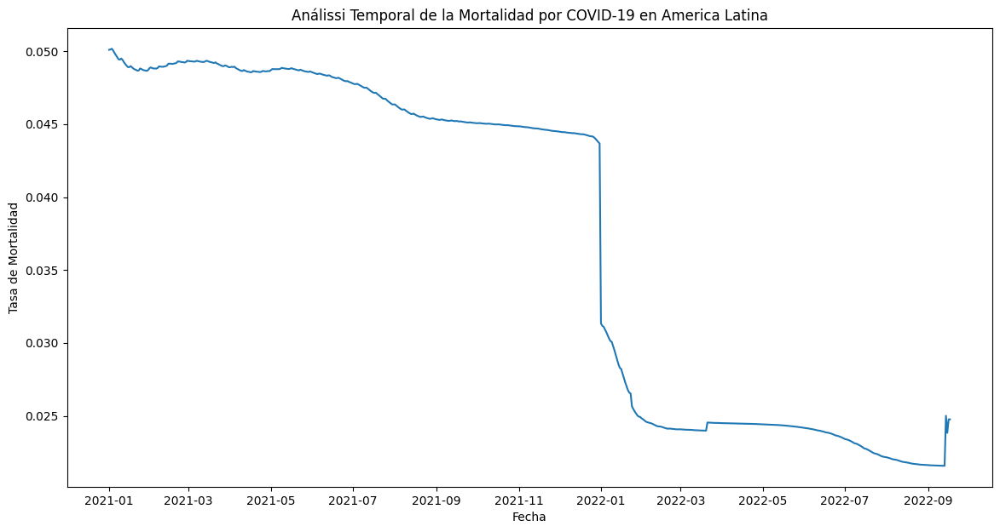

In [87]:
df_latinoAmerica_paises_fecha['mortality_rate'] = df_latinoAmerica_paises_fecha['cumulative_deceased'] / df_latinoAmerica_paises_fecha['cumulative_confirmed']
plt.figure(figsize=(14, 7))
sns.lineplot(data=df_latinoAmerica_paises_fecha, x='date', y='mortality_rate', estimator='mean', errorbar=None)
plt.title('Análissi Temporal de la Mortalidad por COVID-19 en America Latina')
plt.xlabel('Fecha')
plt.ylabel('Tasa de Mortalidad')
plt.show()

Este gráfico muestra la evolución de la tasa de mortalidad por COVID-19 en América Latina a lo largo del tiempo. 

**Aquí hay algunas observaciones que puedes hacer:**

*Tendencia a lo largo del tiempo:* El gráfico muestra cómo ha cambiado la tasa de mortalidad a lo largo del tiempo. Esto puede ayudarte a identificar si la tasa de mortalidad está aumentando, disminuyendo o se mantiene constante.

*Promedio de la tasa de mortalidad:* Estás utilizando el promedio de la tasa de mortalidad, lo que puede ayudar a suavizar las fluctuaciones a corto plazo y resaltar las tendencias a largo plazo.

*Ausencia de barras de error:* Has elegido no incluir barras de error en tu gráfico. Las barras de error pueden ser útiles para visualizar la variabilidad o incertidumbre de los datos.

*Tasa de mortalidad:* La tasa de mortalidad se calcula como el número de muertes confirmadas dividido por el número de casos confirmados. Esta es una medida comúnmente utilizada para evaluar la gravedad de una enfermedad.

Recuerda, este gráfico muestra promedios, por lo que puede no capturar variaciones a corto plazo o picos en los datos. Además, aunque este gráfico puede sugerir una correlación entre la vacunación y la reducción de casos, es importante recordar que la correlación no implica causalidad y pueden existir otros factores en juego.

Casos Activos

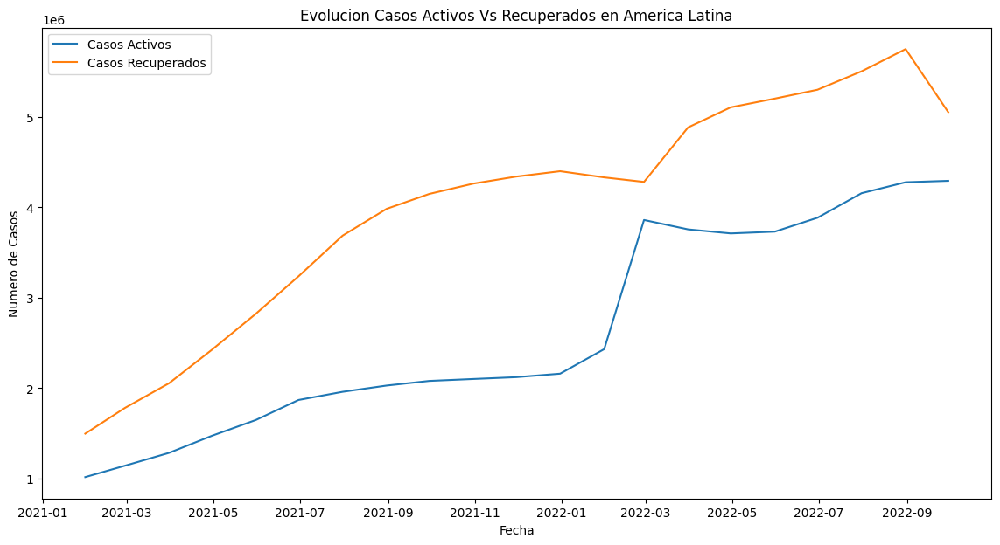

In [89]:
#como evolucionan los casos activos y recuperados en America Latina
df_latinoAmerica_paises_fecha['casos_activos'] = df_latinoAmerica_paises_fecha['cumulative_confirmed'] - df_latinoAmerica_paises_fecha['cumulative_deceased'] - df_latinoAmerica_paises_fecha['cumulative_recovered']
plt.figure(figsize=(14, 7))
sns.lineplot(data=df_latinoAmerica_paises_fecha.resample('ME').mean(numeric_only=True), x='date', y='casos_activos' ,label='Casos Activos')
sns.lineplot(data=df_latinoAmerica_paises_fecha.resample('ME').mean(numeric_only=True), x='date', y='cumulative_recovered', label='Casos Recuperados')
plt.title('Evolucion Casos Activos Vs Recuperados en America Latina')
plt.xlabel('Fecha')
plt.ylabel('Numero de Casos')
plt.show()

Este gráfico muestra la evolución de los casos activos y recuperados de COVID-19 en América Latina a lo largo del tiempo. 

**Tendencias a lo largo del tiempo:** El gráfico muestra cómo han cambiado los casos activos y recuperados a lo largo del tiempo. Esto puede ayudarte a identificar si los casos activos están aumentando o disminuyendo y cómo se compara esto con la tasa de recuperación.

**Comparación de casos activos y recuperados:** Al trazar tanto los casos activos como los recuperados en el mismo gráfico, puedes comparar directamente estas dos métricas. Esto puede proporcionarte información sobre la eficacia de las medidas de tratamiento y control de la enfermedad.

**Promedio de casos:** Estás utilizando el promedio mensual de casos, lo que puede ayudar a suavizar las fluctuaciones a corto plazo y resaltar las tendencias a largo plazo.

Recuerda, este gráfico muestra promedios, por lo que puede no capturar variaciones a corto plazo o picos en los datos. Además, aunque este gráfico puede sugerir una correlación entre la vacunación y la reducción de casos, es importante recordar que la correlación no implica causalidad y pueden existir otros factores en juego

## Extra ##

In [123]:
import folium

# Crear un mapa centrado en América Latina
mapa = folium.Map(location=[-15.765379, -47.968776], zoom_start=4, dragging=False, zoom_control=True)


for idx, row in df_copia_paises_latinoamerica_paises_fecha.iterrows():
    # Añadir un marcador para cada punto de datos
    folium.Marker([row['latitude'], row['longitude']]).add_to(mapa)

# Mostrar el mapa
mapa


In [126]:
#mapa para ver la distribucion de casos confirmados, muertes, vacunas y recuperados
import folium 
from folium.plugins import HeatMap

#seleccionamos las columnas que vamos a utilizar
columnas_mapa =['latitude', 'longitude', 'cumulative_confirmed', 'cumulative_deceased', 'cumulative_vaccine_doses_administered', 'cumulative_recovered']
data_mapa = df_copia_paises_latinoamerica_paises_fecha[columnas_mapa].dropna()

#creamos un mapa centrado en america latina
mapa_latinoamerica = folium.Map(location=[-14.235004, -51.92528], zoom_start=3)

#creamos un mapa de calor para los casos confirmados
mapa_calor_confirmados = HeatMap(data=data_mapa[['latitude', 'longitude', 'cumulative_confirmed']], radius=15)
mapa_latinoamerica.add_child(mapa_calor_confirmados)

#creamos un mapa de calor para los decesos
mapa_calor_decesos = HeatMap(data=data_mapa[['latitude', 'longitude', 'cumulative_deceased']], radius=15)
mapa_latinoamerica.add_child(mapa_calor_decesos)

#creamos un mapa de calor para las vacunas administradas
mapa_calor_vacunas = HeatMap(data=data_mapa[['latitude', 'longitude', 'cumulative_vaccine_doses_administered']], radius=15)
mapa_latinoamerica.add_child(mapa_calor_vacunas)

#creamos un mapa de calor para los casos confirmados
mapa_calor_recuperados = HeatMap(data=data_mapa[['latitude', 'longitude', 'cumulative_recovered']], radius=15)
mapa_latinoamerica.add_child(mapa_calor_recuperados)

mapa_latinoamerica.save('mapa.html')

mapa_latinoamerica

In [127]:
df_latinoAmerica_paises_fecha.to_csv('DatosFinalesParaPowerBi.csv', index=False)
